In [1]:
import pandas as pd
import copy
import os
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dropout
import copy
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
from skyfield import almanac
from datetime import datetime
from skyfield import api
from sklearn.preprocessing import MinMaxScaler
import statistics
import random
sc=MinMaxScaler(feature_range=(0,1))
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import linregress
import matplotlib.dates as dates
from tensorflow.keras.optimizers import SGD
import tensorflow as tf
from tensorflow.keras import backend as K
import seaborn as sns
from statsmodels.nonparametric.smoothers_lowess import lowess
from keras.models import Sequential
from keras.layers import LSTM, Dropout, Dense
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler

In [2]:
# Import all Excel Sheets
CMIPValues_CMCC_CM2_SR5_585=pd.read_excel('Path\To\File\CMIPValues_CMCC_CM2_SR5_585_Fulldataset.xlsx')
CMIPValues_CMCC_CM2_SR5_245=pd.read_excel('Path\To\File\CMIPValues_CMCC_CM2_SR5_245_Fulldataset.xlsx')

CMIPValues_CESM2_245=pd.read_excel('Path\To\File\CMIPValues_CESM2_245_Fulldataset.xlsx')
CMIPValues_CESM2_585=pd.read_excel('Path\To\File\CMIPValues_CESM2_585_Fulldataset.xlsx')

CMIPValues_NorESM2_MM_585=pd.read_excel('Path\To\File\CMIPValues_NorESM2_MM_585_Fulldataset.xlsx')
CMIPValues_NorESM2_MM_245=pd.read_excel('Path\To\File\CMIPValues_NorESM2_MM_245_Fulldataset.xlsx')

CMIPValues_CMCC_ESM2_585=pd.read_excel('Path\To\File\CMIPValues_CMCC_ESM2_585_Fulldataset.xlsx')
CMIPValues_CMCC_ESM2_245=pd.read_excel('Path\To\File\CMIPValues_CMCC_ESM2_245_Fulldataset.xlsx')

ObservedDataset = pd.read_excel(r'Path\To\File\Cumulative_Dataset_Polygon_Mosq_Update2.xlsx')
ObservedDataset=ObservedDataset.drop(columns=['Unnamed: 0'])

Daylight = pd.read_excel(r'Path\To\File\DaylightDataset.xlsx')
Daylight=Daylight.drop(columns=['Sunrise','Sunset','Daylight','Unnamed: 0','Moving Daylight'])
# Change to Kelvin
ObservedDataset['Mean Temp']=ObservedDataset['Mean Temp (°C)']+273.15
ObservedDataset=ObservedDataset.drop(columns=['Mean Temp (°C)'])
ObservedDataset['Moving Mean Temp']=ObservedDataset['Moving Mean Temp']+273.15

CMIPValues_CMCC_CM2_SR5_245['Surface Temp']=CMIPValues_CMCC_CM2_SR5_245['Surface Temp']+273.15
CMIPValues_CMCC_CM2_SR5_245['Moving Surface Temp']=CMIPValues_CMCC_CM2_SR5_245['Moving Surface Temp']+273.15
CMIPValues_CMCC_CM2_SR5_585['Surface Temp']=CMIPValues_CMCC_CM2_SR5_585['Surface Temp']+273.15
CMIPValues_CMCC_CM2_SR5_585['Moving Surface Temp']=CMIPValues_CMCC_CM2_SR5_585['Moving Surface Temp']+273.15
CMIPValues_CESM2_245['Surface Temp']=CMIPValues_CESM2_245['Surface Temp']+273.15
CMIPValues_CESM2_245['Moving Surface Temp']=CMIPValues_CESM2_245['Moving Surface Temp']+273.15
CMIPValues_CESM2_585['Surface Temp']=CMIPValues_CESM2_585['Surface Temp']+273.15
CMIPValues_CESM2_585['Moving Surface Temp']=CMIPValues_CESM2_585['Moving Surface Temp']+273.15

CMIPValues_NorESM2_MM_585['Surface Temp']=CMIPValues_NorESM2_MM_585['Surface Temp']+273.15
CMIPValues_NorESM2_MM_585['Moving Surface Temp']=CMIPValues_NorESM2_MM_585['Moving Surface Temp']+273.15
CMIPValues_NorESM2_MM_245['Surface Temp']=CMIPValues_NorESM2_MM_245['Surface Temp']+273.15
CMIPValues_NorESM2_MM_245['Moving Surface Temp']=CMIPValues_NorESM2_MM_245['Moving Surface Temp']+273.15
CMIPValues_CMCC_ESM2_585['Surface Temp']=CMIPValues_CMCC_ESM2_585['Surface Temp']+273.15
CMIPValues_CMCC_ESM2_585['Moving Surface Temp']=CMIPValues_CMCC_ESM2_585['Moving Surface Temp']+273.15
CMIPValues_CMCC_ESM2_245['Surface Temp']=CMIPValues_CMCC_ESM2_245['Surface Temp']+273.15
CMIPValues_CMCC_ESM2_245['Moving Surface Temp']=CMIPValues_CMCC_ESM2_245['Moving Surface Temp']+273.15

In [3]:
# Import individual variables
SM = pd.read_excel(r'Path\To\File\SoilMoisturePolygon.xlsx')
VD = pd.read_excel(r'Path\To\File\VegetationDataPolygon.xlsx')
ClimateData = pd.read_excel(r'Path\To\File\ClimateDataNew2023.xlsx')
StreamflowData = pd.read_excel(r'Path\To\File\Streamflow2023.xlsx')

ClimateData['Mean Temp']=ClimateData['Mean Temp (°C)']+273.15
ClimateData=ClimateData.drop(columns=['Mean Temp (°C)'])

# Clean the files. This portion is to take the Bias ratio/bias sum depending on the variable you're working with
SM['Date']=pd.to_datetime(SM['Date'])
SM['Year']=SM['Date'].dt.to_period('Y')
SM['Month']=SM['Date'].dt.to_period('M')
idx = pd.date_range('2002-01-01', '2017-12-31')
SMtest=copy.deepcopy(SM)
SMtest.set_index('Date', inplace=True)
SMtest = SMtest.reindex(idx, fill_value=np.nan)
SMtest = SMtest.reset_index()
SMtest.rename(columns = {'index':'Date'}, inplace = True)
SMtest['Date']=pd.to_datetime(SMtest['Date'])
SMtest['Year']=SMtest['Date'].dt.year
SMtest['Month']=SMtest['Date'].dt.month
SMtest=SMtest.drop(columns=['Unnamed: 0','Count'])
SMtest['SM']=SMtest['SM'].interpolate(method='linear')
SMtest['Moving SM']=SMtest['SM']
SMtest.fillna(method='bfill', inplace=True)

VD=VD.drop(columns=['Unnamed: 0','Count'])
StreamflowData=StreamflowData.drop(columns=['Unnamed: 0'])
ClimateData=ClimateData.drop(columns=['Unnamed: 0','Year','Month','Day','Latitude (y)','Longitude (x)'])

# compile datasets for the anomaly ratio later on
AnomalyCalcObservedPeriod=pd.merge(StreamflowData, VD, how = 'right', left_on = ['Date'], right_on = ['Date'])
AnomalyCalcObservedPeriod=pd.merge(SMtest, AnomalyCalcObservedPeriod, how = 'right', left_on = ['Date'], right_on = ['Date'])
AnomalyCalcObservedPeriod=pd.merge(ClimateData, AnomalyCalcObservedPeriod, how = 'right', left_on = ['Date'], right_on = ['Date'])

AnomalyCalcObservedPeriod['Year']=AnomalyCalcObservedPeriod['Date'].dt.to_period('Y')
AnomalyCalcObservedPeriod['Month']=AnomalyCalcObservedPeriod['Date'].dt.to_period('M')
AnomalyCalcObservedPeriod['Day']=AnomalyCalcObservedPeriod['Date'].dt.to_period('D')

for i, row in AnomalyCalcObservedPeriod.iterrows():
    AnomalyCalcObservedPeriod['Year'][i]=AnomalyCalcObservedPeriod['Date'][i].year
    AnomalyCalcObservedPeriod['Day'][i]=AnomalyCalcObservedPeriod['Date'][i].day
    AnomalyCalcObservedPeriod['Month'][i]=AnomalyCalcObservedPeriod['Date'][i].month
    
ActualObs=AnomalyCalcObservedPeriod[AnomalyCalcObservedPeriod['Year']<2018]
AnomalyCalcObservedPeriod=AnomalyCalcObservedPeriod[AnomalyCalcObservedPeriod['Year']<2015]
AnomalyCalcObservedPeriod=AnomalyCalcObservedPeriod.dropna()
AnomalyCalcObservedPeriod=AnomalyCalcObservedPeriod[~((AnomalyCalcObservedPeriod['Month']==2) &  (AnomalyCalcObservedPeriod['Day']==29))]

In [4]:
# Getting actual obs data for lookback
ActualObs=pd.merge(Daylight, ActualObs, how = 'inner', left_on = ['Date'], right_on = ['Date'])
ActualObs['Timeskip']=ActualObs['Date']
for i in range(0,len(ActualObs)):
    try:
        ActualObs['Timeskip'][i]=ActualObs['Date'][i+1]-ActualObs['Date'][i]
        ActualObs['Timeskip'][i]=ActualObs['Timeskip'][i].total_seconds()
    except KeyError:
        ActualObs['Timeskip'][i]=0

def calc_rolling_mean(df, col_name, window_size):
    numbers_series = pd.Series(df[col_name])
    windows = numbers_series.rolling(window_size).mean()
    df[f'Moving {col_name}'] = windows
    df[f'Moving {col_name}'][0:6] = df[col_name][0:6]
# Calculating rolling mean for the acutalobs variables
window_size = 7
for col_name in ['Total Precip (mm)', 'Mean Temp','SM', 'Outflow (m^3/s)', 'LAI','Daylight_s']:
    calc_rolling_mean(ActualObs, col_name, window_size)
ObservedDataset['Timeskip']=ObservedDataset['Date']
for i in range(0,len(ObservedDataset)):
    try:
        ObservedDataset['Timeskip'][i]=ObservedDataset['Date'][i+1]-ObservedDataset['Date'][i]
        ObservedDataset['Timeskip'][i]=ObservedDataset['Timeskip'][i].total_seconds() # important step - wee need timeskip
    except KeyError:
        ObservedDataset['Timeskip'][i]=0

In [5]:
ActualObs.rename(columns={'Moving Daylight_s': 'Moving Daylight'}, inplace=True)
ActualObs.rename(columns={'Moving Total Precip (mm)': 'Moving Total Precip'}, inplace=True)
x_data = []
y_data = []
cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']

for _, row in ObservedDataset.iterrows():
    date = row['Date']
    mosquito_count = row['# of Mosquitoes Rolling']
    timeskip_value = row['Timeskip']
    start_date = date - pd.Timedelta(days=60)
    mask = (ActualObs['Date'] > start_date) & (ActualObs['Date'] <= date)
    subset_ActualObs = ActualObs[mask].copy()
    if len(subset_ActualObs) == 60:
        subset_ActualObs['Timeskip'] = timeskip_value
        subset_values = subset_ActualObs[cols].values
        x_data.append(subset_values)
        y_data.append(mosquito_count)

x_data = np.array(x_data)
y_data = np.array(y_data)
num_samples, sequence_length, num_features = x_data.shape

feature_means = {}
feature_stds = {}
for feature in cols:
    feature_idx = cols.index(feature)
    feature_values = x_data[:,:,feature_idx]
    
    feature_mean = feature_values.mean()
    feature_std = feature_values.std()
    feature_std = feature_std if feature_std != 0 else 1
    x_data[:,:,feature_idx] = (feature_values - feature_mean) / feature_std

    feature_means[feature] = feature_mean
    feature_stds[feature] = feature_std
feature_stats_df = pd.DataFrame({'Feature': feature_means.keys(), 'Mean': feature_means.values(), 'Standard Deviation': feature_stds.values()})

y_data_mean = y_data.mean()
y_data_std = y_data.std()
y_data_std = y_data_std if y_data_std != 0 else 1
# We chose not to scale the output data. Input data needed to be scaled for analysis in future climate conditions. Normalizing output led to odd
# model results - it was far more effective to not normalize output.
# y_data = (y_data - y_data_mean) / y_data_std
xtrain = np.array(x_data[:2290]).astype('float32')
ytrain = np.array(y_data[:2290]).astype('float32')
xtest = np.array(x_data[2290:3435]).astype('float32')
ytest = np.array(y_data[2290:3435]).astype('float32')

In [6]:
# We wanted certain parts/values to have a greater impact on the model
# You can try these seeds 69, 70, 31, 25, 53, 27
# 24, 32, 47, 94
# seed = 69
# tf.random.set_seed(seed)
# random.seed(seed)

def custom_loss(dynamic_multiplier, weight_multiplier):
    def loss(y_true, y_pred):
        y_true = K.cast(y_true, 'float32')
        y_pred = K.cast(y_pred, 'float32')
 
        mean = K.mean(y_true, axis=1, keepdims=True)
        dynamic_threshold = mean * dynamic_multiplier
        weight = tf.where(K.greater(y_true, dynamic_threshold), K.cast(weight_multiplier, 'float32'), 1.0)
        mse = K.mean(weight * K.square(y_true - y_pred))
        return mse
    return loss

# Hp was chosen after several runs - these seemed the best. An export of final weights is included
num_epochs = 50
batch_size = 16
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
regressor = Sequential()
regressor.add(LSTM(units=16, return_sequences=True, input_shape=(xtrain.shape[1], xtrain.shape[2])))
regressor.add(Dropout(0.0))  
regressor.add(LSTM(units=32, return_sequences=False))  
regressor.add(Dropout(0.1))
regressor.add(Dense(units=1, activation='relu'))
opt = Adam(learning_rate=0.005)
loss_fn = custom_loss(0, 2) # so multiplies all values by double weight. this seemed to work best 
regressor.compile(loss=loss_fn, optimizer=opt)

regressor.fit(xtrain, ytrain, epochs=num_epochs, batch_size=batch_size, verbose=1, validation_split=0.1, callbacks=[early_stopping])

Epoch 1/50
129/129 [==============================] - 12s 45ms/step - loss: 12.3525 - val_loss: 4.5017
Epoch 2/50
129/129 [==============================] - 5s 37ms/step - loss: 6.8370 - val_loss: 2.1187
Epoch 3/50
129/129 [==============================] - 3s 24ms/step - loss: 7.2434 - val_loss: 1.9762
Epoch 4/50
129/129 [==============================] - 3s 20ms/step - loss: 5.2733 - val_loss: 1.7892
Epoch 5/50
129/129 [==============================] - 3s 20ms/step - loss: 4.9766 - val_loss: 4.0682
Epoch 6/50
129/129 [==============================] - 3s 20ms/step - loss: 3.7932 - val_loss: 3.4490
Epoch 7/50
129/129 [==============================] - 2s 19ms/step - loss: 3.6199 - val_loss: 3.4187
Epoch 8/50
129/129 [==============================] - 3s 19ms/step - loss: 4.4158 - val_loss: 3.0336
Epoch 9/50
129/129 [==============================] - 3s 20ms/step - loss: 5.2686 - val_loss: 3.5699
Epoch 10/50
129/129 [==============================] - 3s 20ms/step - loss: 3.3404 - val_

72/72 [==============================] - 0s 6ms/step
0.40692270862834906


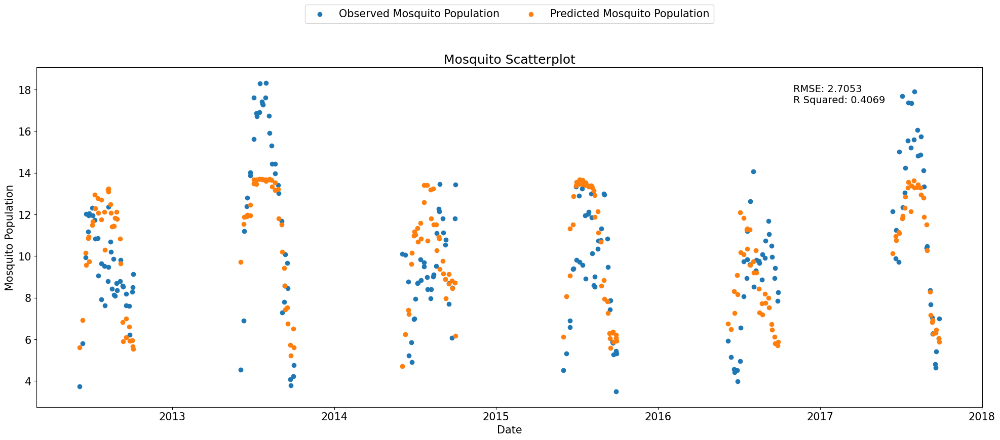

In [7]:
ypred = regressor.predict(xtest)
ypredicttrain=regressor.predict(xtrain)

# Assessing model effectiveness
TestNo0=pd.DataFrame()
TestNo0['Actual Mosquito Data']=ytest.flatten()
TestNo0['Mosquito Predictions']=ypred.flatten()
TestNo0['Date'] = ObservedDataset.iloc[2290:3435]['Date'].reset_index(drop=True)
TestNo0['Actual Mosquito Data']=TestNo0['Actual Mosquito Data'].round(3)
TestNo0['Mosquito Predictions']=TestNo0['Mosquito Predictions'].round(3)
TestNo0 = TestNo0[TestNo0['Actual Mosquito Data'] != 0]
plt.rcParams["figure.figsize"] = (20,9)
plt.rcParams.update({'font.size': 15})

mse = mean_squared_error(TestNo0['Actual Mosquito Data'], TestNo0['Mosquito Predictions'])
rmse = np.sqrt(mse)
corr_matrix = np.corrcoef(TestNo0['Actual Mosquito Data'], TestNo0['Mosquito Predictions'])
corr = corr_matrix[0,1]
r_sq = corr**2

plt.close('all')
plt.scatter(TestNo0['Date'],TestNo0['Actual Mosquito Data'],label='Observed Mosquito Population')
plt.scatter(TestNo0['Date'],TestNo0['Mosquito Predictions'],label='Predicted Mosquito Population')
text = f"RMSE: {rmse:.4f}\nR Squared: {r_sq:.4f}"
plt.text(0.80, 0.95, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')
plt.title('Mosquito Scatterplot')
plt.ylabel('Mosquito Population')
plt.xlabel('Date')

print(r_sq)

plt.legend(loc="upper center", bbox_to_anchor=(0.5, 1.2), ncol=2)
plt.tight_layout()
plt.show()

In [8]:
#CMIPValues_NorESM2_MM 245
# Note: I took NorESM 245 and 585, wrote those scripts, and then copy pasted the same script for the rest of the datasets.
# For remaining CMIP datasets, I changed DF, necessary variable names and file names.

In [9]:
# Timeskip Calculation in seconds
CMIPValues_NorESM2_MM_245['Timeskip'] = CMIPValues_NorESM2_MM_245['Date'].diff().dt.total_seconds()
CMIPValues_NorESM2_MM_245['Timeskip'].fillna(CMIPValues_NorESM2_MM_245['Timeskip'][1], inplace=True)

# Daylight Extraction for amount of daylight each day
DaylightExtract = copy.deepcopy(ObservedDataset)
DaylightExtract['Year'] = DaylightExtract['Date'].dt.year
DaylightExtract['Month'] = DaylightExtract['Date'].dt.month
DaylightExtract['Day'] = DaylightExtract['Date'].dt.day

# Daylight should be roughly similar for each month, so we average by that. Remove all other columns
Daylight = DaylightExtract.groupby('Month').mean().reset_index()
Daylight = Daylight.drop(columns=[ 'Moving Daylight', '# of Mosquitoes', '# of Mosquitoes Rolling', 'Total Rain (mm)', 'Total Precip (mm)',
       'Moving Mean Temp', 'Moving Total Precip', 'Moving Total Rain', 'LAI', 'Moving LAI', 'Outflow (m^3/s)','Moving Outflow (m^3/s)', 'SM',
       'Moving SM', 'Mean Temp', 'Year','Date', 'Day'])
CMIPValues_NorESM2_MM_245=pd.merge(CMIPValues_NorESM2_MM_245,Daylight,how='left',left_on=['Month'],right_on=['Month'])
CMIPValues_NorESM2_MM_245_1=CMIPValues_NorESM2_MM_245.drop(columns=['Unnamed: 0'])
CMIPValues_NorESM2_MM_245_1['Week'] = CMIPValues_NorESM2_MM_245_1['Date'].dt.isocalendar().week

# Preparing for anomaly calculation, per figures 4a and b in paper. 
# Taking future values and observational values to account for biases in how climate predictions change over time.
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_NorESM2_MM_245)

# Historical vs future values - Taking the future dataset here
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

# The cmip histoircal period
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)

# Taking a daily mean across the timeperiod (total of 365 datapoints)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

# Taking the ratio of obs vs cmip simulated
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])

# Picked 2014 because it gave 52 data points for a weekly average. 
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)
CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()

# Making sure the week denotations line up by adding 1. Then find the week for each future datapoint to multiply/add.
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
ratio_cols = ['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM']
CMIP_Anomaly_Daily_Ratio_Finalized.rename(columns={col: f"{col}_ratio" for col in ratio_cols}, inplace=True)

# Multiply everything else, add temp due to the type of variable it is.
combined_df =pd.merge(CMIPValues_NorESM2_MM_245_1, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
combined_df=combined_df.sort_values(by='Date')
combined_df['Corrected_LAI'] = combined_df['LAI'] * abs(combined_df['LAI_ratio'])
combined_df['Corrected_Surface Temp'] = combined_df['Surface Temp'] + combined_df['Surface Temp_ratio']
combined_df['Corrected_Precip'] = combined_df['Precip'] * abs(combined_df['Precip_ratio'])
combined_df['Corrected_Runoff'] = combined_df['Runoff'] * abs(combined_df['Runoff_ratio'])
combined_df['Corrected_SM'] = combined_df['SM'] * abs(combined_df['SM_ratio'])

# take the rolling mean
window_size = 7
for col_name in ['Corrected_LAI','Corrected_Surface Temp', 'Corrected_Precip', 'Corrected_Runoff','Corrected_SM']:
    calc_rolling_mean(combined_df, col_name, window_size)

In [10]:
Yobserved=ObservedDataset.iloc[:,4:5]
# I made sure the variable position here is the same as the position from the training dataset.
xtestset = combined_df.iloc[18980:, [17, 31, 32, 30, 33, 34, 16]]
ytestset = ObservedDataset.iloc[:, 4:5]
look_back = 60
xtest = np.array([xtestset.iloc[i-look_back:i, :] for i in range(look_back, 5840)])
ytest = np.array([ytestset.iloc[i, 0] for i in range(look_back, 3435)])
xtest = xtest.astype('float32')
ytest = ytest.astype('float32')

# name differences - scaling values as per usual using observational mean and std
key_mapping = {'Daylight_s': 'Moving Daylight', 
               'Moving Corrected_Surface Temp': 'Moving Mean Temp', 
               'Moving Corrected_Precip': 'Moving Total Precip',
               'Moving Corrected_LAI': 'Moving LAI', 
               'Moving Corrected_Runoff': 'Moving Outflow (m^3/s)', 
               'Moving Corrected_SM': 'Moving SM',
               'Timeskip': 'Timeskip'}
for i, feature in enumerate(cols):
    mapped_feature = key_mapping.get(feature, feature)  
    xtest[:,:,i] = (xtest[:,:,i] - feature_means[mapped_feature]) / feature_stds[mapped_feature]

CMIPprediction=regressor.predict(xtest)

181/181 [==============================] - 2s 12ms/step


In [11]:
pd.to_datetime(CMIPValues_NorESM2_MM_245_1[['Year', 'Month', 'Day']][19039:24820]).reset_index(drop=True)

0      2002-03-01
1      2002-03-02
2      2002-03-03
3      2002-03-04
4      2002-03-05
          ...    
5776   2017-12-27
5777   2017-12-28
5778   2017-12-29
5779   2017-12-30
5780   2017-12-31
Length: 5781, dtype: datetime64[ns]

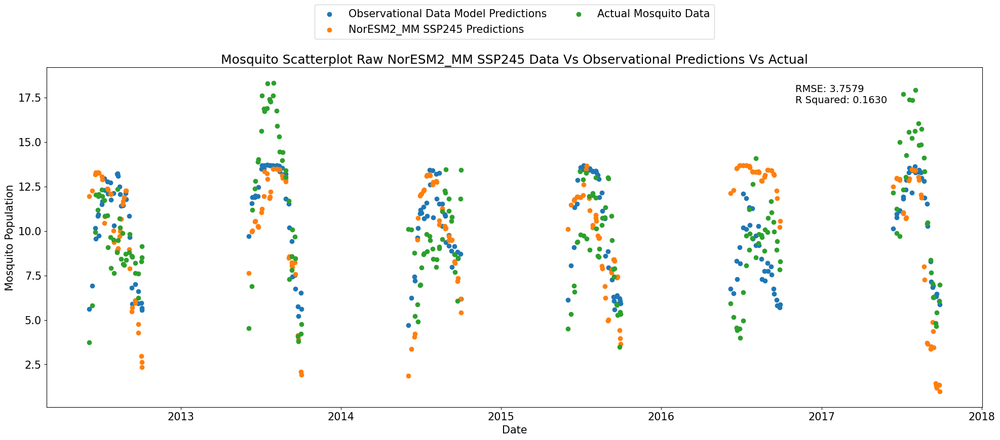

In [12]:
CMIP_Test_Results = pd.DataFrame({'CMIP Mosq Predict Std Scale': CMIPprediction.reshape(-1)})
# Just need to make sure the date is before May 2002, which is when we first have data
CMIP_Test_Results['Date']=pd.to_datetime(CMIPValues_NorESM2_MM_245_1[['Year', 'Month', 'Day']][19039:24820]).reset_index(drop=True)

#Actual obs mosquito values are included so we can get figures
ObservedMosqValues = pd.DataFrame({'St Scale Mosq Actual': Yobserved.values.reshape(-1),'Date': ObservedDataset['Date']})
merged_df_NorESM2_MM_SSP245 = pd.merge(CMIP_Test_Results,ObservedMosqValues,how='right',on='Date')
merged_df_NorESM2_MM_SSP245['CMIP Mosq Predict'] = merged_df_NorESM2_MM_SSP245['CMIP Mosq Predict Std Scale'] 
merged_df_NorESM2_MM_SSP245['Mosq Actual'] = merged_df_NorESM2_MM_SSP245['St Scale Mosq Actual'] 
merged_df_NorESM2_MM_SSP245.dropna(inplace=True)
merged_df_NorESM2_MM_SSP245 = merged_df_NorESM2_MM_SSP245[merged_df_NorESM2_MM_SSP245['Mosq Actual'] > 0]
merged_df_NorESM2_MM_SSP245.reset_index(inplace=True, drop=True)

# How does the CMIP Prediction compare to the Actual LSTM Pred vs Observational Data
CMIPvsObsPredict_NorESM2_MM_SSP245=pd.merge(TestNo0,merged_df_NorESM2_MM_SSP245,how='left',left_on=['Date'],right_on=['Date'])
plt.close('all')
merged_df_NorESM2_MM_SSP245 = merged_df_NorESM2_MM_SSP245[merged_df_NorESM2_MM_SSP245['Mosq Actual'] > 0]
merged_df_NorESM2_MM_SSP245.reset_index(inplace=True, drop=True)

CMIPvsObsPredict_NorESM2_MM_SSP245=CMIPvsObsPredict_NorESM2_MM_SSP245.dropna()

# Determining R-Sq and RSME
mse = mean_squared_error(CMIPvsObsPredict_NorESM2_MM_SSP245['Mosq Actual'], CMIPvsObsPredict_NorESM2_MM_SSP245['CMIP Mosq Predict'])
rmse = np.sqrt(mse)
corr_matrix = np.corrcoef(CMIPvsObsPredict_NorESM2_MM_SSP245['Mosq Actual'], CMIPvsObsPredict_NorESM2_MM_SSP245['CMIP Mosq Predict'])
corr = corr_matrix[0,1]
r_sq = corr**2

text = f"RMSE: {rmse:.4f}\nR Squared: {r_sq:.4f}"
plt.text(0.80, 0.95, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')

plt.scatter(CMIPvsObsPredict_NorESM2_MM_SSP245['Date'],CMIPvsObsPredict_NorESM2_MM_SSP245['Mosquito Predictions'],label='Observational Data Model Predictions')
plt.scatter(CMIPvsObsPredict_NorESM2_MM_SSP245['Date'],CMIPvsObsPredict_NorESM2_MM_SSP245['CMIP Mosq Predict'],label='NorESM2_MM SSP245 Predictions')
plt.scatter(CMIPvsObsPredict_NorESM2_MM_SSP245['Date'],CMIPvsObsPredict_NorESM2_MM_SSP245['Mosq Actual'],label='Actual Mosquito Data')
plt.title('Mosquito Scatterplot Raw NorESM2_MM SSP245 Data Vs Observational Predictions Vs Actual')
plt.ylabel('Mosquito Population')
plt.xlabel('Date')
plt.legend(loc="upper center", bbox_to_anchor=(0.5, 1.2), ncol=2)
plt.tight_layout()
plt.show()

In [13]:
# Adding in anomaly calc for future datasets. we just looked at the observational period right now.
# Similar steps and process as before. Historical vs future values
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_NorESM2_MM_245)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

# Taking the ratio of obs vs cmip simulated
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

# Weekly average and making sure the week denotations line up by adding 1. 
CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week

CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
CombinedDailyFinalized=pd.merge(CMIPAnomaly_2015_2100_Daily, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
CombinedDailyFinalized=CombinedDailyFinalized.sort_values(by='Date')
CMIP_Test_Results_Anomaly_Daily_Dataset=pd.DataFrame()

# finalize with dataset
CMIP_Test_Results_Anomaly_Daily_Dataset['LAI']=CombinedDailyFinalized['LAI_cmip']*abs(CombinedDailyFinalized['LAI_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Surface Temp']=CombinedDailyFinalized['Surface Temp_cmip']+(CombinedDailyFinalized['Surface Temp_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Precip']=CombinedDailyFinalized['Precip_cmip']*abs(CombinedDailyFinalized['Precip_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Runoff']=CombinedDailyFinalized['Runoff_cmip']*abs(CombinedDailyFinalized['Runoff_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['SM']=CombinedDailyFinalized['SM_cmip']*abs(CombinedDailyFinalized['SM_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Date']=CombinedDailyFinalized['Date']
CMIP_Test_Results_Anomaly_Daily_Dataset['Day']=CombinedDailyFinalized['Date'].dt.day
CMIP_Test_Results_Anomaly_Daily_Dataset['Month']=CombinedDailyFinalized['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily_Dataset['Year']=CombinedDailyFinalized['Date'].dt.year

# Take rolling mean and add in consistent timeskip as we assume "no gaps" for this portion
window_size = 7
for col_name in ['Surface Temp', 'Runoff', 'SM', 'Precip', 'LAI']:
    calc_rolling_mean(CMIP_Test_Results_Anomaly_Daily_Dataset, col_name, window_size)
CMIP_Test_Results_Anomaly_Daily_Dataset['Timeskip'] = 86400.0
Daylight=Daylight.drop(columns=['Timeskip'])
CMIP_Test_Results_Anomaly_Daily_Dataset = pd.merge(CMIP_Test_Results_Anomaly_Daily_Dataset, Daylight, how='left', left_on=['Month'], right_on=['Month'])

cols = ['Daylight_s', 'Moving Surface Temp', 'Moving Precip', 'Moving LAI', 'Moving Runoff', 'Moving SM', 'Timeskip']
xtestset = CMIP_Test_Results_Anomaly_Daily_Dataset[cols]

# we're gonna set it up similar to before
num_rows = xtestset.shape[0]
look_back = 60
num_windows = num_rows - look_back
x_test_3d = np.empty((num_windows, look_back, 7))

# we're looking at all the values here just remember that
for i in range(num_windows):
    x_test_3d[i] = xtestset.iloc[i:i+look_back].values
feature_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Surface Temp': 'Moving Mean Temp', 'Moving Precip': 'Moving Total Precip',
    'Moving LAI': 'Moving LAI', 'Moving Runoff': 'Moving Outflow (m^3/s)', 'Moving SM': 'Moving SM', 'Timeskip': 'Timeskip'}

for i, feature in enumerate(cols):
    corresponding_feature = feature_mapping.get(feature, feature) 
    x_test_3d[:,:,i] = (x_test_3d[:,:,i] - feature_means[corresponding_feature]) / feature_stds[corresponding_feature]
    
# Now we predict once more. This time we're looking at all the values not just a limited set
CMIP_prediction_Anomaly_Daily = pd.DataFrame(regressor.predict(x_test_3d))

CMIP_Test_Results_Anomaly_Daily = pd.DataFrame({'Normalized Mosq Predict': CMIP_prediction_Anomaly_Daily[0]})
CMIP_Test_Results_Anomaly_Daily['Mosq Predict'] = CMIP_Test_Results_Anomaly_Daily['Normalized Mosq Predict']

# Clean up the cmip data by removing months we don't have data for and by taking the time period
CMIP_Future_Dates = CMIP_Test_Results_Anomaly_Daily_Dataset['Date'][60:31390].reset_index()
CMIP_Test_Results_Anomaly_Daily_Date = CMIP_Future_Dates.copy()
CMIP_Test_Results_Anomaly_Daily['Date'] = CMIP_Test_Results_Anomaly_Daily_Date['Date']
CMIP_Test_Results_Anomaly_Daily['Year'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.year
CMIP_Test_Results_Anomaly_Daily['Month'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily['Day'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.day

980/980 [==============================] - 8s 8ms/step


In [14]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.0,0.0,2015-03-02 12:00:00,2015,3,2
1,0.0,0.0,2015-03-03 12:00:00,2015,3,3
2,0.0,0.0,2015-03-04 12:00:00,2015,3,4
3,0.0,0.0,2015-03-05 12:00:00,2015,3,5
4,0.0,0.0,2015-03-06 12:00:00,2015,3,6
...,...,...,...,...,...,...
31325,0.0,0.0,2100-12-27 12:00:00,2100,12,27
31326,0.0,0.0,2100-12-28 12:00:00,2100,12,28
31327,0.0,0.0,2100-12-29 12:00:00,2100,12,29
31328,0.0,0.0,2100-12-30 12:00:00,2100,12,30


In [15]:
# Checking to see how it looks, then i remove for the mosquito off season period, where i shouldn't have any mosquitoes
CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Mosq Predict']<0]

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day


In [16]:
CMIP_Test_Results_Anomaly_Daily = CMIP_Test_Results_Anomaly_Daily[(CMIP_Test_Results_Anomaly_Daily['Month'] > 4) & (CMIP_Test_Results_Anomaly_Daily['Month'] < 11)].reset_index(drop=True)
CMIP_Test_Results_Anomaly_Daily=CMIP_Test_Results_Anomaly_Daily.reset_index(drop=True)

In [17]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.282700,0.282700,2015-05-01 12:00:00,2015,5,1
1,0.434029,0.434029,2015-05-02 12:00:00,2015,5,2
2,0.586200,0.586200,2015-05-03 12:00:00,2015,5,3
3,0.672239,0.672239,2015-05-04 12:00:00,2015,5,4
4,0.681759,0.681759,2015-05-05 12:00:00,2015,5,5
...,...,...,...,...,...,...
15819,2.366061,2.366061,2100-10-27 12:00:00,2100,10,27
15820,2.264253,2.264253,2100-10-28 12:00:00,2100,10,28
15821,2.107627,2.107627,2100-10-29 12:00:00,2100,10,29
15822,1.964896,1.964896,2100-10-30 12:00:00,2100,10,30


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


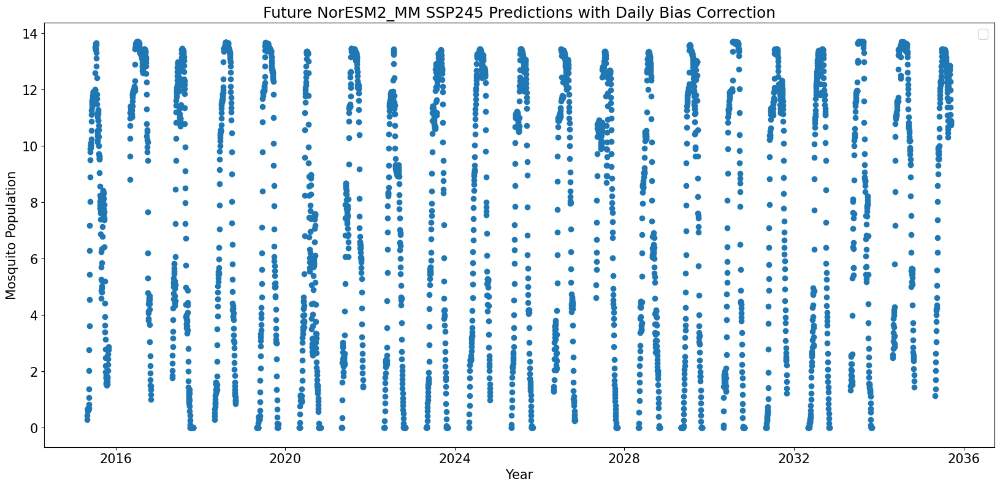

In [18]:
# Bias corrected plot of NORESM 245 - daily for a small period
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'][0:3818],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'][0:3818])
plt.title('Future NorESM2_MM SSP245 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


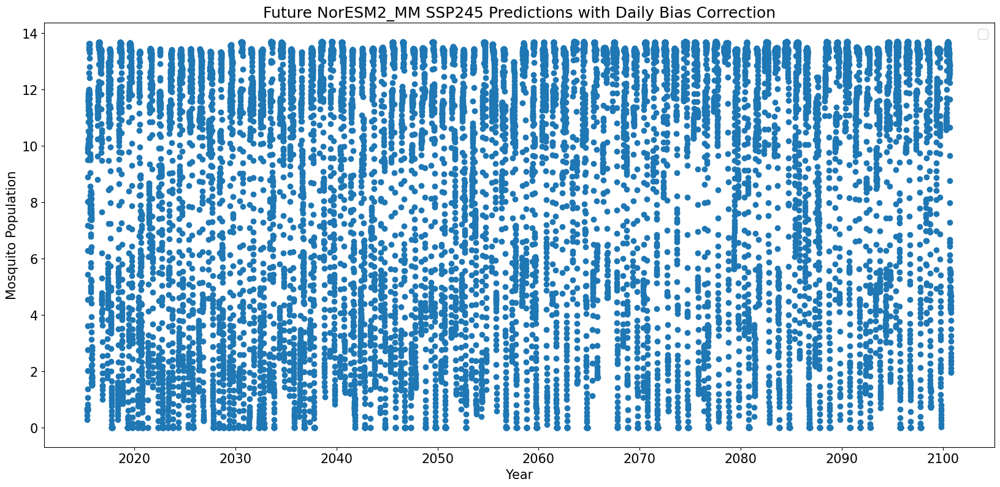

In [19]:
# Bias corrected plot of NORESM 245 - daily for the entire period
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'])
plt.title('Future NorESM2_MM SSP245 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


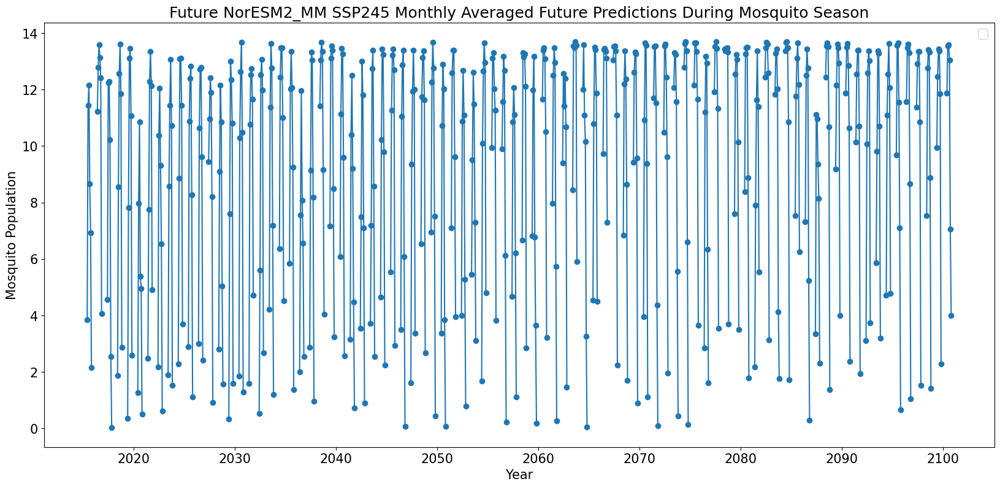

In [20]:
# Bias corrected plot of NORESM 245 - monthly average
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')

CMIP_Test_Results_Anomaly_Daily['Date'] = pd.to_datetime(CMIP_Test_Results_Anomaly_Daily['Date'])
CMIP_Test_Results_Anomaly_Daily.set_index('Date', inplace=True)
# just to see how things vary!
monthly_means = CMIP_Test_Results_Anomaly_Daily['Mosq Predict'].resample('M').mean()

plt.plot(monthly_means.index, monthly_means.values, marker='o')
plt.title('Future NorESM2_MM SSP245 Monthly Averaged Future Predictions During Mosquito Season')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

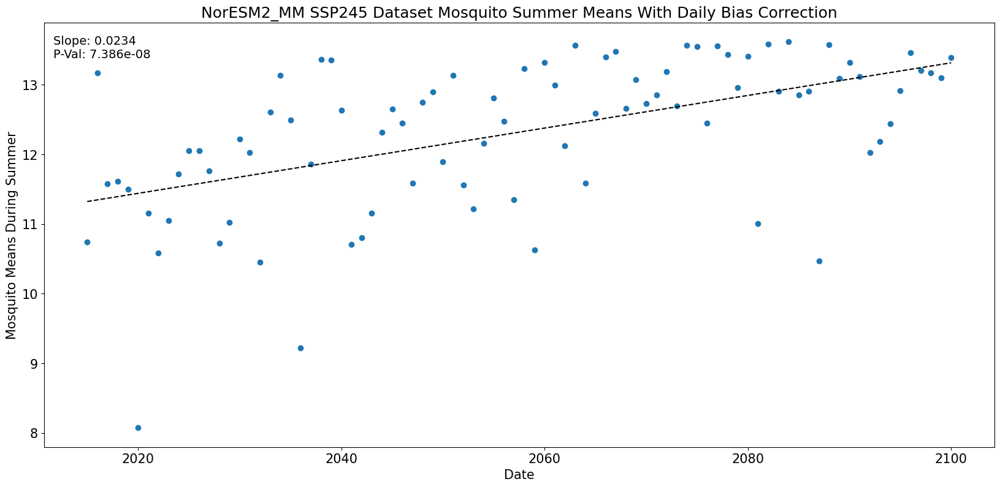

In [21]:
# summer means plot
SummerMeansDF=pd.DataFrame()
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Month']<9]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal[CMIP_Test_Results_Anomaly_Summer_Seasonal['Month']>5]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.groupby(['Year']).mean()
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.reset_index()
# saving values here for the figures at the end
SummerMeansDF['Year']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']
SummerMeansDF['Mosq Predict NorESM2_MM SSP245']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']

plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'])
plt.title('NorESM2_MM SSP245 Dataset Mosquito Summer Means With Daily Bias Correction')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Date')

trend = np.polyfit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'], 1)
fit = np.poly1d(trend)
plt.plot(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'], fit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']), "r--", color='black')
slope = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).slope
pval = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).pvalue
text = f"Slope: {slope:.4f}\nP-Val: {pval:.3e}"
plt.text(0.01, 0.97, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')
plt.show()

In [ ]:
# The rest is really just a repeat of what i made here

In [22]:
####################################### CMIPValues_NorESM2_MM 585

In [23]:
# Timeskip Calculation in seconds
CMIPValues_NorESM2_MM_585['Timeskip'] = CMIPValues_NorESM2_MM_585['Date'].diff().dt.total_seconds()
CMIPValues_NorESM2_MM_585['Timeskip'].fillna(CMIPValues_NorESM2_MM_585['Timeskip'][1], inplace=True)

# Daylight Extraction for amount of daylight each day
DaylightExtract = copy.deepcopy(ObservedDataset)
DaylightExtract['Year'] = DaylightExtract['Date'].dt.year
DaylightExtract['Month'] = DaylightExtract['Date'].dt.month
DaylightExtract['Day'] = DaylightExtract['Date'].dt.day

Daylight = DaylightExtract.groupby('Month').mean().reset_index()
Daylight = Daylight.drop(columns=[ 'Moving Daylight', '# of Mosquitoes', '# of Mosquitoes Rolling', 'Total Rain (mm)', 'Total Precip (mm)',
       'Moving Mean Temp', 'Moving Total Precip', 'Moving Total Rain', 'LAI', 'Moving LAI', 'Outflow (m^3/s)','Moving Outflow (m^3/s)', 'SM',
       'Moving SM', 'Mean Temp', 'Year','Date', 'Day'])
CMIPValues_NorESM2_MM_585=pd.merge(CMIPValues_NorESM2_MM_585,Daylight,how='left',left_on=['Month'],right_on=['Month'])
CMIPValues_NorESM2_MM_585_1=CMIPValues_NorESM2_MM_585.drop(columns=['Unnamed: 0'])
CMIPValues_NorESM2_MM_585_1['Week'] = CMIPValues_NorESM2_MM_585_1['Date'].dt.isocalendar().week

# Preparing for anomaly calculation, per figures 4a and b in paper. 
# Taking future values and observational values to account for biases in how climate predictions change over time.
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_NorESM2_MM_585)

# Historical vs future values - Taking the future dataset here
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

# The cmip histoircal period
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)

# Taking a daily mean across the timeperiod (total of 365 datapoints)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

# Taking the ratio of obs vs cmip simulated
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])

# Picked 2014 because it gave 52 data points for a weekly average. 
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)
CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()

# Making sure the week denotations line up by adding 1. Then find the week for each future datapoint to multiply/add.
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
ratio_cols = ['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM']
CMIP_Anomaly_Daily_Ratio_Finalized.rename(columns={col: f"{col}_ratio" for col in ratio_cols}, inplace=True)

# Multiply everything else, add temp due to the type of variable it is.
combined_df =pd.merge(CMIPValues_NorESM2_MM_585_1, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
combined_df=combined_df.sort_values(by='Date')
combined_df['Corrected_LAI'] = combined_df['LAI'] * abs(combined_df['LAI_ratio'])
combined_df['Corrected_Surface Temp'] = combined_df['Surface Temp'] + combined_df['Surface Temp_ratio']
combined_df['Corrected_Precip'] = combined_df['Precip'] * abs(combined_df['Precip_ratio'])
combined_df['Corrected_Runoff'] = combined_df['Runoff'] * abs(combined_df['Runoff_ratio'])
combined_df['Corrected_SM'] = combined_df['SM'] * abs(combined_df['SM_ratio'])

# take the rolling mean
window_size = 7
for col_name in ['Corrected_LAI','Corrected_Surface Temp', 'Corrected_Precip', 'Corrected_Runoff','Corrected_SM']:
    calc_rolling_mean(combined_df, col_name, window_size)

In [24]:
Yobserved=ObservedDataset.iloc[:,4:5]
# I made sure the variable position here is the same as the position from the training dataset.
xtestset = combined_df.iloc[18980:, [17, 31, 32, 30, 33, 34, 16]]
ytestset = ObservedDataset.iloc[:, 4:5]
look_back = 60
xtest = np.array([xtestset.iloc[i-look_back:i, :] for i in range(look_back, 5840)])
ytest = np.array([ytestset.iloc[i, 0] for i in range(look_back, 3435)])
xtest = xtest.astype('float32')
ytest = ytest.astype('float32')
cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']

# name differences - scaling values as per usual using observational mean and std
key_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Corrected_Surface Temp': 'Moving Mean Temp', 'Moving Corrected_Precip': 'Moving Total Precip',
        'Moving Corrected_LAI': 'Moving LAI', 'Moving Corrected_Runoff': 'Moving Outflow (m^3/s)', 'Moving Corrected_SM': 'Moving SM',
        'Timeskip': 'Timeskip'}
for i, feature in enumerate(cols):
    mapped_feature = key_mapping.get(feature, feature)
    xtest[:,:,i] = (xtest[:,:,i] - feature_means[mapped_feature]) / feature_stds[mapped_feature]
    
CMIPprediction=regressor.predict(xtest)

181/181 [==============================] - 2s 10ms/step


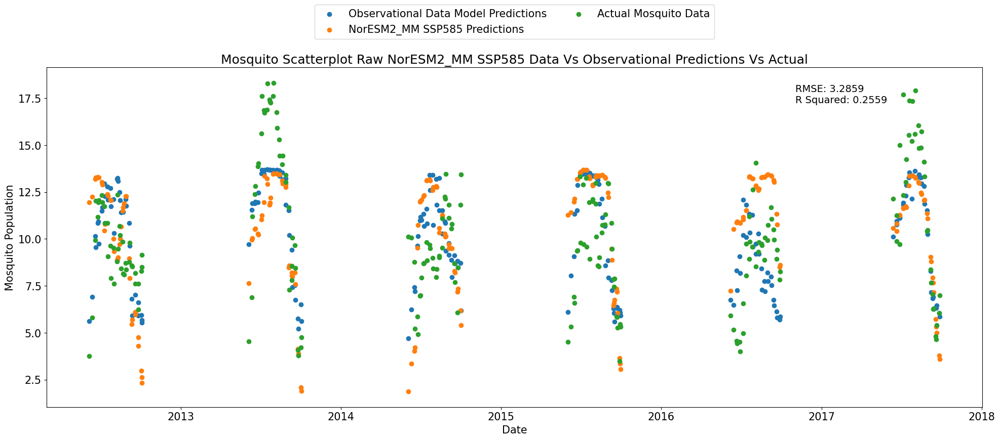

In [25]:
CMIP_Test_Results = pd.DataFrame({'CMIP Mosq Predict Std Scale': CMIPprediction.reshape(-1)})
# Just need to make sure the date is before May 2002, which is when we first have data
CMIP_Test_Results['Date']=pd.to_datetime(CMIPValues_NorESM2_MM_585_1[['Year', 'Month', 'Day']][19039:24820]).reset_index(drop=True)

#Actual obs mosquito values are included so we can get figures
ObservedMosqValues = pd.DataFrame({'St Scale Mosq Actual': Yobserved.values.reshape(-1),'Date': ObservedDataset['Date']})
merged_df_NorESM2_MM_SSP585 = pd.merge(CMIP_Test_Results,ObservedMosqValues,how='right',on='Date')
merged_df_NorESM2_MM_SSP585['CMIP Mosq Predict'] = merged_df_NorESM2_MM_SSP585['CMIP Mosq Predict Std Scale'] 
merged_df_NorESM2_MM_SSP585['Mosq Actual'] = merged_df_NorESM2_MM_SSP585['St Scale Mosq Actual'] 
merged_df_NorESM2_MM_SSP585.dropna(inplace=True)
merged_df_NorESM2_MM_SSP585 = merged_df_NorESM2_MM_SSP585[merged_df_NorESM2_MM_SSP585['Mosq Actual'] > 0]
merged_df_NorESM2_MM_SSP585.reset_index(inplace=True, drop=True)

# How does the CMIP Prediction compare to the Actual LSTM Pred vs Observational Data
CMIPvsObsPredict_NorESM2_MM_SSP585=pd.merge(TestNo0,merged_df_NorESM2_MM_SSP585,how='left',left_on=['Date'],right_on=['Date'])
plt.close('all')
merged_df_NorESM2_MM_SSP585 = merged_df_NorESM2_MM_SSP585[merged_df_NorESM2_MM_SSP585['Mosq Actual'] > 0]
merged_df_NorESM2_MM_SSP585.reset_index(inplace=True, drop=True)

# How does the CMIP Prediction compare to the Actual LSTM Pred vs Observational Data
CMIPvsObsPredict_NorESM2_MM_SSP585=pd.merge(TestNo0,merged_df_NorESM2_MM_SSP585,how='left',left_on=['Date'],right_on=['Date'])
plt.close('all')

CMIPvsObsPredict_NorESM2_MM_SSP585=CMIPvsObsPredict_NorESM2_MM_SSP585.dropna()

# Determining R-Sq and RSME
mse = mean_squared_error(CMIPvsObsPredict_NorESM2_MM_SSP585['Mosq Actual'], CMIPvsObsPredict_NorESM2_MM_SSP585['CMIP Mosq Predict'])
rmse = np.sqrt(mse)
corr_matrix = np.corrcoef(CMIPvsObsPredict_NorESM2_MM_SSP585['Mosq Actual'], CMIPvsObsPredict_NorESM2_MM_SSP585['CMIP Mosq Predict'])
corr = corr_matrix[0,1]
r_sq = corr**2

text = f"RMSE: {rmse:.4f}\nR Squared: {r_sq:.4f}"
plt.text(0.80, 0.95, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')

plt.scatter(CMIPvsObsPredict_NorESM2_MM_SSP585['Date'],CMIPvsObsPredict_NorESM2_MM_SSP585['Mosquito Predictions'],label='Observational Data Model Predictions')
plt.scatter(CMIPvsObsPredict_NorESM2_MM_SSP585['Date'],CMIPvsObsPredict_NorESM2_MM_SSP585['CMIP Mosq Predict'],label='NorESM2_MM SSP585 Predictions')
plt.scatter(CMIPvsObsPredict_NorESM2_MM_SSP585['Date'],CMIPvsObsPredict_NorESM2_MM_SSP585['Mosq Actual'],label='Actual Mosquito Data')
plt.title('Mosquito Scatterplot Raw NorESM2_MM SSP585 Data Vs Observational Predictions Vs Actual')
plt.ylabel('Mosquito Population')
plt.xlabel('Date')
plt.legend(loc="upper center", bbox_to_anchor=(0.5, 1.2), ncol=2)
plt.tight_layout()
plt.show()

In [26]:
# Adding in anomaly calc for future datasets. we just looked at the observational period right now.
# Similar steps and process as before. Historical vs future values
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_NorESM2_MM_585)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

# Taking the ratio of obs vs cmip simulated
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

# Weekly average and making sure the week denotations line up by adding 1. 
CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week

CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
CombinedDailyFinalized=pd.merge(CMIPAnomaly_2015_2100_Daily, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
CombinedDailyFinalized=CombinedDailyFinalized.sort_values(by='Date')
CMIP_Test_Results_Anomaly_Daily_Dataset=pd.DataFrame()

# finalize with dataset
CMIP_Test_Results_Anomaly_Daily_Dataset['LAI']=CombinedDailyFinalized['LAI_cmip']*abs(CombinedDailyFinalized['LAI_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Surface Temp']=CombinedDailyFinalized['Surface Temp_cmip']+(CombinedDailyFinalized['Surface Temp_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Precip']=CombinedDailyFinalized['Precip_cmip']*abs(CombinedDailyFinalized['Precip_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Runoff']=CombinedDailyFinalized['Runoff_cmip']*abs(CombinedDailyFinalized['Runoff_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['SM']=CombinedDailyFinalized['SM_cmip']*abs(CombinedDailyFinalized['SM_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Date']=CombinedDailyFinalized['Date']
CMIP_Test_Results_Anomaly_Daily_Dataset['Day']=CombinedDailyFinalized['Date'].dt.day
CMIP_Test_Results_Anomaly_Daily_Dataset['Month']=CombinedDailyFinalized['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily_Dataset['Year']=CombinedDailyFinalized['Date'].dt.year

# Take rolling mean and add in consistent timeskip as we assume "no gaps" for this portion
window_size = 7
for col_name in ['Surface Temp', 'Runoff', 'SM', 'Precip', 'LAI']:
    calc_rolling_mean(CMIP_Test_Results_Anomaly_Daily_Dataset, col_name, window_size)
CMIP_Test_Results_Anomaly_Daily_Dataset['Timeskip'] = 86400.0
Daylight=Daylight.drop(columns=['Timeskip'])
CMIP_Test_Results_Anomaly_Daily_Dataset = pd.merge(CMIP_Test_Results_Anomaly_Daily_Dataset, Daylight, how='left', left_on=['Month'], right_on=['Month'])

cols = ['Daylight_s', 'Moving Surface Temp', 'Moving Precip', 'Moving LAI', 'Moving Runoff', 'Moving SM', 'Timeskip']
xtestset = CMIP_Test_Results_Anomaly_Daily_Dataset[cols]

# we're gonna set it up similar to before
num_rows = xtestset.shape[0]
look_back = 60
num_windows = num_rows - look_back
x_test_3d = np.empty((num_windows, look_back, 7))

# we're looking at all the values here just remember that
for i in range(num_windows):
    x_test_3d[i] = xtestset.iloc[i:i+look_back].values
feature_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Surface Temp': 'Moving Mean Temp', 'Moving Precip': 'Moving Total Precip',
    'Moving LAI': 'Moving LAI', 'Moving Runoff': 'Moving Outflow (m^3/s)', 'Moving SM': 'Moving SM', 'Timeskip': 'Timeskip'}

for i, feature in enumerate(cols):
    corresponding_feature = feature_mapping.get(feature, feature)
    x_test_3d[:,:,i] = (x_test_3d[:,:,i] - feature_means[corresponding_feature]) / feature_stds[corresponding_feature]
    
# Now we predict once more. This time we're looking at all the values not just a limited set
CMIP_prediction_Anomaly_Daily = pd.DataFrame(regressor.predict(x_test_3d))
CMIP_Test_Results_Anomaly_Daily = pd.DataFrame({'Normalized Mosq Predict': CMIP_prediction_Anomaly_Daily[0]})
CMIP_Test_Results_Anomaly_Daily['Mosq Predict'] = CMIP_Test_Results_Anomaly_Daily['Normalized Mosq Predict']

# Clean up the cmip data by removing months we don't have data for and by taking the time period
CMIP_Future_Dates = CMIP_Test_Results_Anomaly_Daily_Dataset['Date'][60:31390].reset_index()
CMIP_Test_Results_Anomaly_Daily_Date = CMIP_Future_Dates.copy()
CMIP_Test_Results_Anomaly_Daily['Date'] = CMIP_Test_Results_Anomaly_Daily_Date['Date']
CMIP_Test_Results_Anomaly_Daily['Year'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.year
CMIP_Test_Results_Anomaly_Daily['Month'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily['Day'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.day

980/980 [==============================] - 8s 8ms/step


In [27]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.0,0.0,2015-03-02 12:00:00,2015,3,2
1,0.0,0.0,2015-03-03 12:00:00,2015,3,3
2,0.0,0.0,2015-03-04 12:00:00,2015,3,4
3,0.0,0.0,2015-03-05 12:00:00,2015,3,5
4,0.0,0.0,2015-03-06 12:00:00,2015,3,6
...,...,...,...,...,...,...
31325,0.0,0.0,2100-12-27 12:00:00,2100,12,27
31326,0.0,0.0,2100-12-28 12:00:00,2100,12,28
31327,0.0,0.0,2100-12-29 12:00:00,2100,12,29
31328,0.0,0.0,2100-12-30 12:00:00,2100,12,30


In [28]:
CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Mosq Predict']<0]

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day


In [29]:
CMIP_Test_Results_Anomaly_Daily = CMIP_Test_Results_Anomaly_Daily[(CMIP_Test_Results_Anomaly_Daily['Month'] > 4) & (CMIP_Test_Results_Anomaly_Daily['Month'] < 11)].reset_index(drop=True)

CMIP_Test_Results_Anomaly_Daily=CMIP_Test_Results_Anomaly_Daily.reset_index(drop=True)

In [30]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.278575,0.278575,2015-05-01 12:00:00,2015,5,1
1,0.726847,0.726847,2015-05-02 12:00:00,2015,5,2
2,1.243208,1.243208,2015-05-03 12:00:00,2015,5,3
3,1.799997,1.799997,2015-05-04 12:00:00,2015,5,4
4,2.386981,2.386981,2015-05-05 12:00:00,2015,5,5
...,...,...,...,...,...,...
15819,0.000000,0.000000,2100-10-27 12:00:00,2100,10,27
15820,0.000000,0.000000,2100-10-28 12:00:00,2100,10,28
15821,0.000000,0.000000,2100-10-29 12:00:00,2100,10,29
15822,0.000000,0.000000,2100-10-30 12:00:00,2100,10,30


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


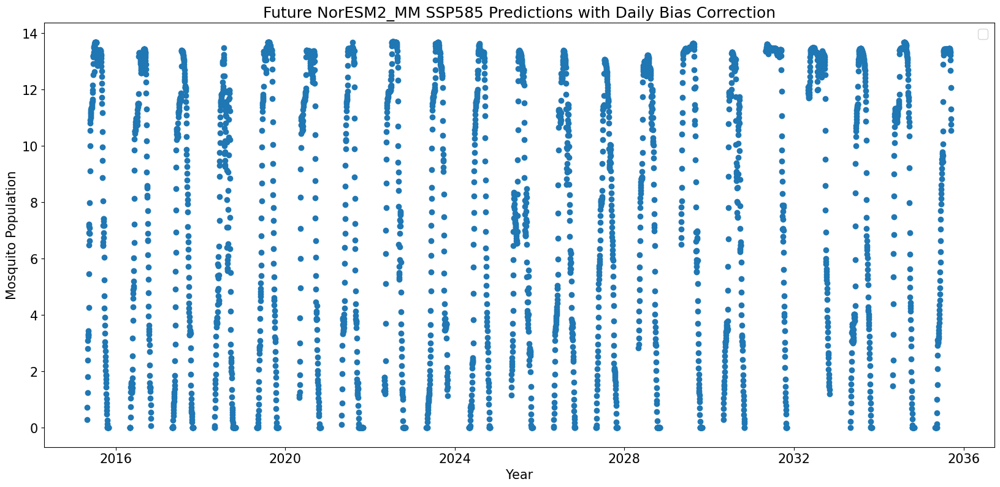

In [31]:
# Bias corrected plot of NORESM 585
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'][0:3818],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'][0:3818])
plt.title('Future NorESM2_MM SSP585 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


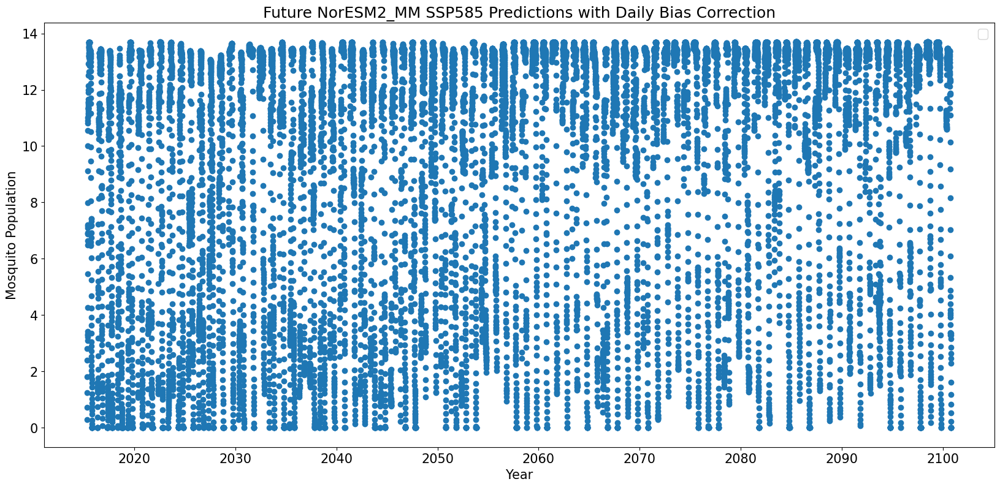

In [32]:
# Bias corrected plot of NORESM 585
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'])
plt.title('Future NorESM2_MM SSP585 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


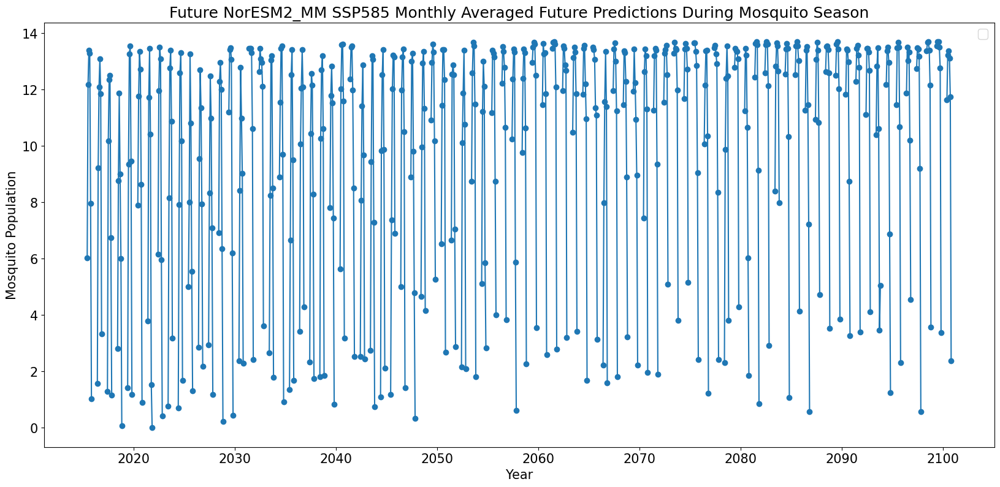

In [33]:
# Bias corrected plot of NORESM 585
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
CMIP_Test_Results_Anomaly_Daily['Date'] = pd.to_datetime(CMIP_Test_Results_Anomaly_Daily['Date'])
CMIP_Test_Results_Anomaly_Daily.set_index('Date', inplace=True)
monthly_means = CMIP_Test_Results_Anomaly_Daily['Mosq Predict'].resample('M').mean()

plt.plot(monthly_means.index, monthly_means.values, marker='o')
plt.title('Future NorESM2_MM SSP585 Monthly Averaged Future Predictions During Mosquito Season')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

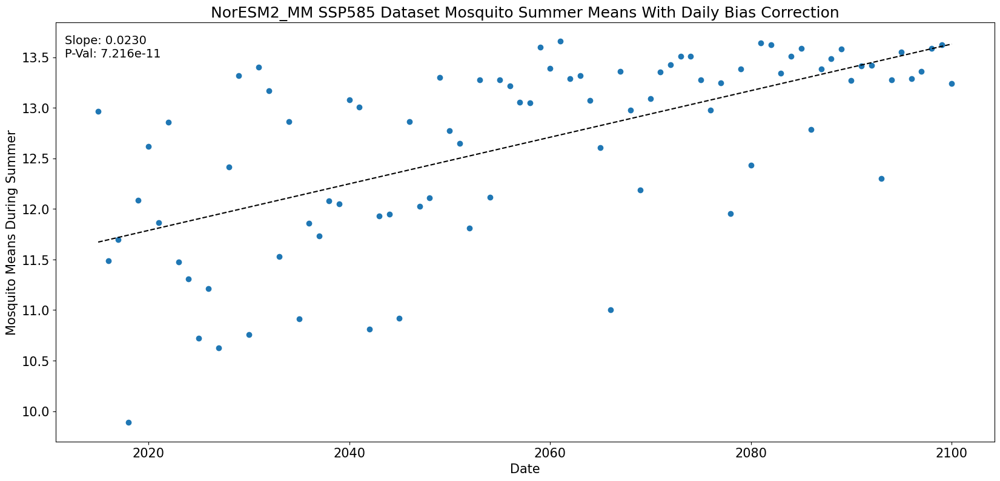

In [34]:
# summer means plot
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Month']<9]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal[CMIP_Test_Results_Anomaly_Summer_Seasonal['Month']>5]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.groupby(['Year']).mean()
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.reset_index()
SummerMeansDF['Year']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']
SummerMeansDF['Mosq Predict NorESM2_MM SSP585']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']

plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'])
plt.title('NorESM2_MM SSP585 Dataset Mosquito Summer Means With Daily Bias Correction')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Date')

trend = np.polyfit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'], 1)
fit = np.poly1d(trend)
plt.plot(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'], fit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']), "r--", color='black')
slope = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).slope
pval = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).pvalue
text = f"Slope: {slope:.4f}\nP-Val: {pval:.3e}"
plt.text(0.01, 0.97, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')
plt.show()

In [35]:
##########################  CMCC_CM2_SR5 245

In [36]:
CMIPValues_CMCC_CM2_SR5_245['Timeskip'] = CMIPValues_CMCC_CM2_SR5_245['Date'].diff().dt.total_seconds()
CMIPValues_CMCC_CM2_SR5_245['Timeskip'].fillna(CMIPValues_CMCC_CM2_SR5_245['Timeskip'][1], inplace=True)

DaylightExtract = copy.deepcopy(ObservedDataset)
DaylightExtract['Year'] = DaylightExtract['Date'].dt.year
DaylightExtract['Month'] = DaylightExtract['Date'].dt.month
DaylightExtract['Day'] = DaylightExtract['Date'].dt.day

Daylight = DaylightExtract.groupby('Month').mean().reset_index()
Daylight = Daylight.drop(columns=[ 'Moving Daylight', '# of Mosquitoes', '# of Mosquitoes Rolling', 'Total Rain (mm)', 'Total Precip (mm)',
       'Moving Mean Temp', 'Moving Total Precip', 'Moving Total Rain', 'LAI', 'Moving LAI', 'Outflow (m^3/s)','Moving Outflow (m^3/s)', 'SM',
       'Moving SM', 'Mean Temp', 'Year','Date', 'Day'])
CMIPValues_CMCC_CM2_SR5_245=pd.merge(CMIPValues_CMCC_CM2_SR5_245,Daylight,how='left',left_on=['Month'],right_on=['Month'])
CMIPValues_CMCC_CM2_SR5_245_1=CMIPValues_CMCC_CM2_SR5_245.drop(columns=['Unnamed: 0'])
CMIPValues_CMCC_CM2_SR5_245_1['Week'] = CMIPValues_CMCC_CM2_SR5_245_1['Date'].dt.isocalendar().week

# anomaly calc
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CMCC_CM2_SR5_245)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
ratio_cols = ['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM']
CMIP_Anomaly_Daily_Ratio_Finalized.rename(columns={col: f"{col}_ratio" for col in ratio_cols}, inplace=True)

combined_df =pd.merge(CMIPValues_CMCC_CM2_SR5_245_1, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
combined_df=combined_df.sort_values(by='Date')
combined_df['Corrected_LAI'] = combined_df['LAI'] * abs(combined_df['LAI_ratio'])
combined_df['Corrected_Surface Temp'] = combined_df['Surface Temp'] + combined_df['Surface Temp_ratio']
combined_df['Corrected_Precip'] = combined_df['Precip'] * abs(combined_df['Precip_ratio'])
combined_df['Corrected_Runoff'] = combined_df['Runoff'] * abs(combined_df['Runoff_ratio'])
combined_df['Corrected_SM'] = combined_df['SM'] * abs(combined_df['SM_ratio'])

window_size = 7
for col_name in ['Corrected_LAI','Corrected_Surface Temp', 'Corrected_Precip', 'Corrected_Runoff','Corrected_SM']:
    calc_rolling_mean(combined_df, col_name, window_size)

181/181 [==============================] - 2s 12ms/step


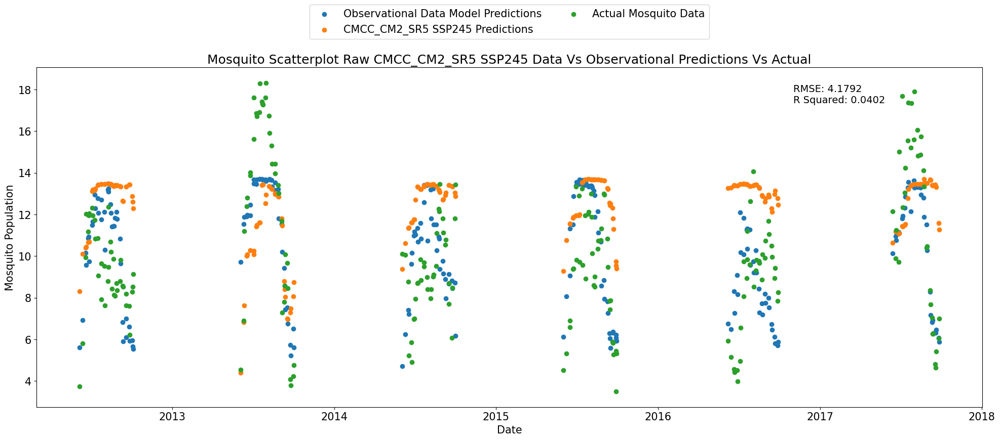

In [37]:
Yobserved=ObservedDataset.iloc[:,4:5]
xtestset = combined_df.iloc[18980:, [17, 31, 32, 30, 33, 34, 16]]
ytestset = ObservedDataset.iloc[:, 4:5]
look_back = 60
xtest = np.array([xtestset.iloc[i-look_back:i, :] for i in range(look_back, 5840)])
ytest = np.array([ytestset.iloc[i, 0] for i in range(look_back, 3435)])
xtest = xtest.astype('float32')
ytest = ytest.astype('float32')

cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']
key_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Corrected_Surface Temp': 'Moving Mean Temp', 'Moving Corrected_Precip': 'Moving Total Precip',
        'Moving Corrected_LAI': 'Moving LAI', 'Moving Corrected_Runoff': 'Moving Outflow (m^3/s)', 'Moving Corrected_SM': 'Moving SM',
        'Timeskip': 'Timeskip'}
for i, feature in enumerate(cols):
    mapped_feature = key_mapping.get(feature, feature)
    xtest[:,:,i] = (xtest[:,:,i] - feature_means[mapped_feature]) / feature_stds[mapped_feature]
CMIPprediction=regressor.predict(xtest)

CMIP_Test_Results = pd.DataFrame({'CMIP Mosq Predict Std Scale': CMIPprediction.reshape(-1)})
CMIP_Test_Results['Date']=pd.to_datetime(CMIPValues_CMCC_CM2_SR5_245_1[['Year', 'Month', 'Day']][19039:24820]).reset_index(drop=True)

#Actual obs scaled values
ObservedMosqValues = pd.DataFrame({'St Scale Mosq Actual': Yobserved.values.reshape(-1),'Date': ObservedDataset['Date']})
merged_df_CMCC_CM2_SR5_SSP245 = pd.merge(CMIP_Test_Results,ObservedMosqValues,how='right',on='Date')
merged_df_CMCC_CM2_SR5_SSP245['CMIP Mosq Predict'] = merged_df_CMCC_CM2_SR5_SSP245['CMIP Mosq Predict Std Scale'] 
merged_df_CMCC_CM2_SR5_SSP245['Mosq Actual'] = merged_df_CMCC_CM2_SR5_SSP245['St Scale Mosq Actual'] 
merged_df_CMCC_CM2_SR5_SSP245.dropna(inplace=True)
merged_df_CMCC_CM2_SR5_SSP245 = merged_df_CMCC_CM2_SR5_SSP245[merged_df_CMCC_CM2_SR5_SSP245['Mosq Actual'] > 0]
merged_df_CMCC_CM2_SR5_SSP245.reset_index(inplace=True, drop=True)

# How does the CMIP Prediction compare to the Actual LSTM Pred vs Observational Data
CMIPvsObsPredict_CMCC_CM2_SR5_SSP245=pd.merge(TestNo0,merged_df_CMCC_CM2_SR5_SSP245,how='left',left_on=['Date'],right_on=['Date'])
plt.close('all')

CMIPvsObsPredict_CMCC_CM2_SR5_SSP245=CMIPvsObsPredict_CMCC_CM2_SR5_SSP245.dropna()

mse = mean_squared_error(CMIPvsObsPredict_CMCC_CM2_SR5_SSP245['Mosq Actual'], CMIPvsObsPredict_CMCC_CM2_SR5_SSP245['CMIP Mosq Predict'])
rmse = np.sqrt(mse)
corr_matrix = np.corrcoef(CMIPvsObsPredict_CMCC_CM2_SR5_SSP245['Mosq Actual'], CMIPvsObsPredict_CMCC_CM2_SR5_SSP245['CMIP Mosq Predict'])
corr = corr_matrix[0,1]
r_sq = corr**2

text = f"RMSE: {rmse:.4f}\nR Squared: {r_sq:.4f}"
plt.text(0.80, 0.95, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')

plt.scatter(CMIPvsObsPredict_CMCC_CM2_SR5_SSP245['Date'],CMIPvsObsPredict_CMCC_CM2_SR5_SSP245['Mosquito Predictions'],label='Observational Data Model Predictions')
plt.scatter(CMIPvsObsPredict_CMCC_CM2_SR5_SSP245['Date'],CMIPvsObsPredict_CMCC_CM2_SR5_SSP245['CMIP Mosq Predict'],label='CMCC_CM2_SR5 SSP245 Predictions')
plt.scatter(CMIPvsObsPredict_CMCC_CM2_SR5_SSP245['Date'],CMIPvsObsPredict_CMCC_CM2_SR5_SSP245['Mosq Actual'],label='Actual Mosquito Data')
plt.title('Mosquito Scatterplot Raw CMCC_CM2_SR5 SSP245 Data Vs Observational Predictions Vs Actual')
plt.ylabel('Mosquito Population')
plt.xlabel('Date')
plt.legend(loc="upper center", bbox_to_anchor=(0.5, 1.2), ncol=2)
plt.tight_layout()
plt.show()

In [38]:
# Adding in anomaly calc for future datasets
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CMCC_CM2_SR5_245)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week

CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
CombinedDailyFinalized=pd.merge(CMIPAnomaly_2015_2100_Daily, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
CombinedDailyFinalized=CombinedDailyFinalized.sort_values(by='Date')
CMIP_Test_Results_Anomaly_Daily_Dataset=pd.DataFrame()

CMIP_Test_Results_Anomaly_Daily_Dataset['LAI']=CombinedDailyFinalized['LAI_cmip']*abs(CombinedDailyFinalized['LAI_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Surface Temp']=CombinedDailyFinalized['Surface Temp_cmip']+(CombinedDailyFinalized['Surface Temp_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Precip']=CombinedDailyFinalized['Precip_cmip']*abs(CombinedDailyFinalized['Precip_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Runoff']=CombinedDailyFinalized['Runoff_cmip']*abs(CombinedDailyFinalized['Runoff_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['SM']=CombinedDailyFinalized['SM_cmip']*abs(CombinedDailyFinalized['SM_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Date']=CombinedDailyFinalized['Date']
CMIP_Test_Results_Anomaly_Daily_Dataset['Day']=CombinedDailyFinalized['Date'].dt.day
CMIP_Test_Results_Anomaly_Daily_Dataset['Month']=CombinedDailyFinalized['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily_Dataset['Year']=CombinedDailyFinalized['Date'].dt.year

window_size = 7
for col_name in ['Surface Temp', 'Runoff', 'SM', 'Precip', 'LAI']:
    calc_rolling_mean(CMIP_Test_Results_Anomaly_Daily_Dataset, col_name, window_size)
CMIP_Test_Results_Anomaly_Daily_Dataset['Timeskip'] = 86400.0
Daylight=Daylight.drop(columns=['Timeskip'])
CMIP_Test_Results_Anomaly_Daily_Dataset = pd.merge(CMIP_Test_Results_Anomaly_Daily_Dataset, Daylight, how='left', left_on=['Month'], right_on=['Month'])

cols = ['Daylight_s', 'Moving Surface Temp', 'Moving Precip', 'Moving LAI', 'Moving Runoff', 'Moving SM', 'Timeskip']
xtestset = CMIP_Test_Results_Anomaly_Daily_Dataset[cols]

num_rows = xtestset.shape[0]
look_back = 60
num_windows = num_rows - look_back
x_test_3d = np.empty((num_windows, look_back, 7))

for i in range(num_windows):
    x_test_3d[i] = xtestset.iloc[i:i+look_back].values
feature_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Surface Temp': 'Moving Mean Temp', 'Moving Precip': 'Moving Total Precip',
    'Moving LAI': 'Moving LAI', 'Moving Runoff': 'Moving Outflow (m^3/s)', 'Moving SM': 'Moving SM', 'Timeskip': 'Timeskip'}

for i, feature in enumerate(cols):
    corresponding_feature = feature_mapping.get(feature, feature)
    x_test_3d[:,:,i] = (x_test_3d[:,:,i] - feature_means[corresponding_feature]) / feature_stds[corresponding_feature]

CMIP_prediction_Anomaly_Daily = pd.DataFrame(regressor.predict(x_test_3d))
CMIP_Test_Results_Anomaly_Daily = pd.DataFrame({'Normalized Mosq Predict': CMIP_prediction_Anomaly_Daily[0]})
CMIP_Test_Results_Anomaly_Daily['Mosq Predict'] = CMIP_Test_Results_Anomaly_Daily['Normalized Mosq Predict'] 

# Clean up the cmip data by removing months we don't have data for and by taking the time period
CMIP_Future_Dates = CMIP_Test_Results_Anomaly_Daily_Dataset['Date'][60:31390].reset_index()
CMIP_Test_Results_Anomaly_Daily_Date = CMIP_Future_Dates.copy()
CMIP_Test_Results_Anomaly_Daily['Date'] = CMIP_Test_Results_Anomaly_Daily_Date['Date']
CMIP_Test_Results_Anomaly_Daily['Year'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.year
CMIP_Test_Results_Anomaly_Daily['Month'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily['Day'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.day

980/980 [==============================] - 8s 8ms/step


In [39]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.0,0.0,2015-03-02 12:00:00,2015,3,2
1,0.0,0.0,2015-03-03 12:00:00,2015,3,3
2,0.0,0.0,2015-03-04 12:00:00,2015,3,4
3,0.0,0.0,2015-03-05 12:00:00,2015,3,5
4,0.0,0.0,2015-03-06 12:00:00,2015,3,6
...,...,...,...,...,...,...
31325,0.0,0.0,2100-12-27 12:00:00,2100,12,27
31326,0.0,0.0,2100-12-28 12:00:00,2100,12,28
31327,0.0,0.0,2100-12-29 12:00:00,2100,12,29
31328,0.0,0.0,2100-12-30 12:00:00,2100,12,30


In [40]:
CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Mosq Predict']<0]

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day


In [41]:
CMIP_Test_Results_Anomaly_Daily = CMIP_Test_Results_Anomaly_Daily[(CMIP_Test_Results_Anomaly_Daily['Month'] > 4) & (CMIP_Test_Results_Anomaly_Daily['Month'] < 11)].reset_index(drop=True)

CMIP_Test_Results_Anomaly_Daily=CMIP_Test_Results_Anomaly_Daily.reset_index(drop=True)

In [42]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.000000,0.000000,2015-05-01 12:00:00,2015,5,1
1,0.000000,0.000000,2015-05-02 12:00:00,2015,5,2
2,0.000000,0.000000,2015-05-03 12:00:00,2015,5,3
3,0.000000,0.000000,2015-05-04 12:00:00,2015,5,4
4,0.000000,0.000000,2015-05-05 12:00:00,2015,5,5
...,...,...,...,...,...,...
15819,6.497988,6.497988,2100-10-27 12:00:00,2100,10,27
15820,6.459569,6.459569,2100-10-28 12:00:00,2100,10,28
15821,6.215146,6.215146,2100-10-29 12:00:00,2100,10,29
15822,6.016185,6.016185,2100-10-30 12:00:00,2100,10,30


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


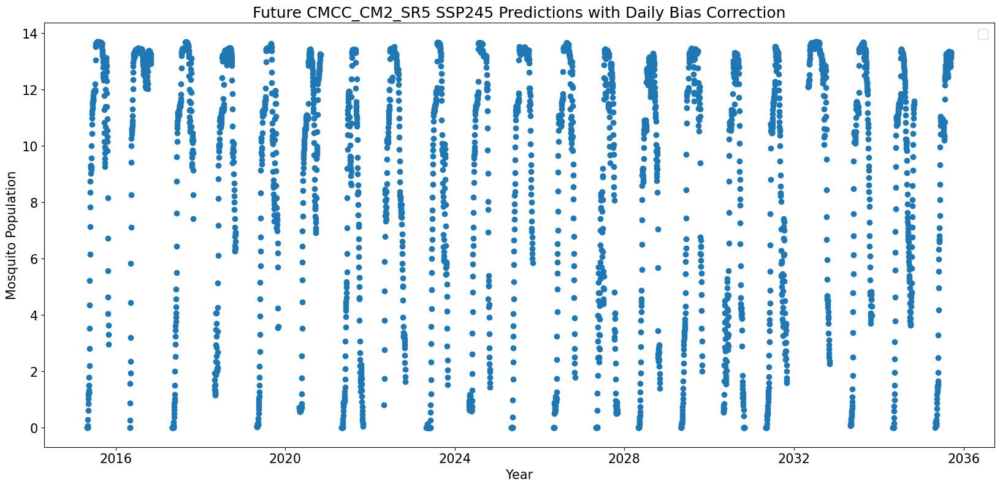

In [43]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'][0:3818],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'][0:3818])
plt.title('Future CMCC_CM2_SR5 SSP245 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


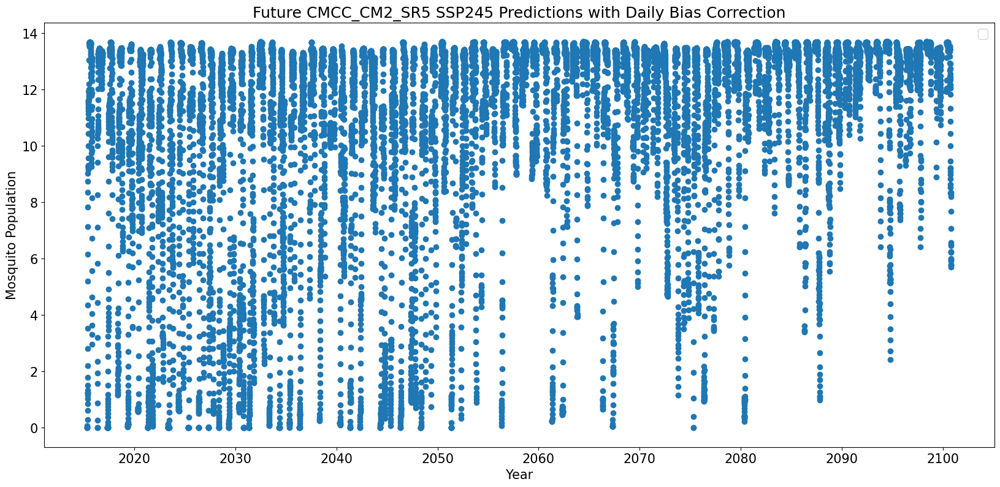

In [44]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'])
plt.title('Future CMCC_CM2_SR5 SSP245 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


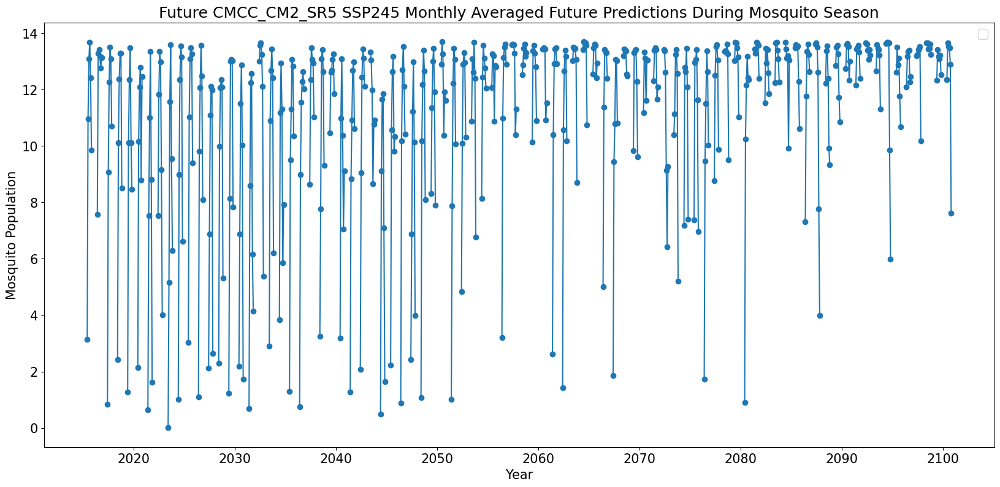

In [45]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')

CMIP_Test_Results_Anomaly_Daily['Date'] = pd.to_datetime(CMIP_Test_Results_Anomaly_Daily['Date'])
CMIP_Test_Results_Anomaly_Daily.set_index('Date', inplace=True)
monthly_means = CMIP_Test_Results_Anomaly_Daily['Mosq Predict'].resample('M').mean()

plt.plot(monthly_means.index, monthly_means.values, marker='o')
plt.title('Future CMCC_CM2_SR5 SSP245 Monthly Averaged Future Predictions During Mosquito Season')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

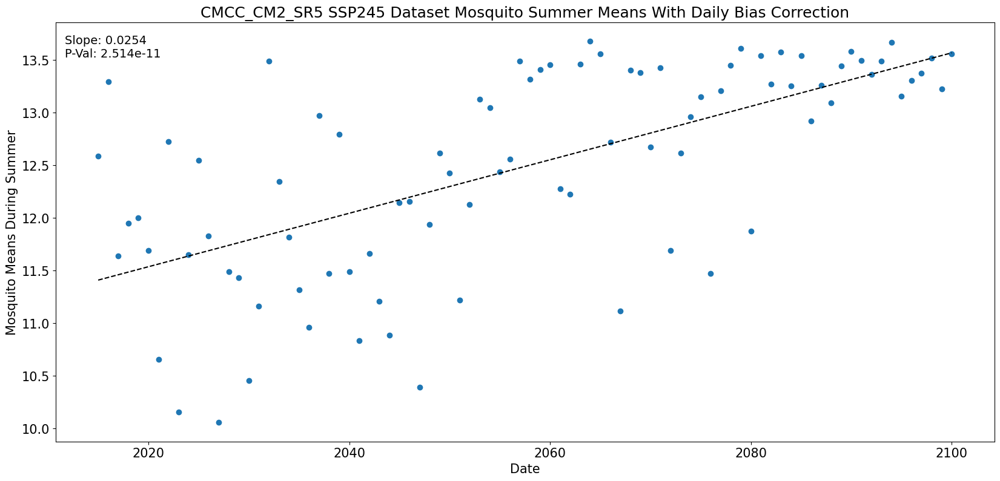

In [46]:
# summer means plot
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Month']<9]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal[CMIP_Test_Results_Anomaly_Summer_Seasonal['Month']>5]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.groupby(['Year']).mean()
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.reset_index()
SummerMeansDF['Year']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']
SummerMeansDF['Mosq Predict CMCC_CM2_SR5 SSP245']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']

plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'])
plt.title('CMCC_CM2_SR5 SSP245 Dataset Mosquito Summer Means With Daily Bias Correction')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Date')

trend = np.polyfit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'], 1)
fit = np.poly1d(trend)
plt.plot(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'], fit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']), "r--", color='black')
slope = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).slope
pval = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).pvalue
text = f"Slope: {slope:.4f}\nP-Val: {pval:.3e}"
plt.text(0.01, 0.97, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')
plt.show()

In [47]:
##########################  CMCC_CM2_SR5 585

In [48]:
CMIPValues_CMCC_CM2_SR5_585['Timeskip'] = CMIPValues_CMCC_CM2_SR5_585['Date'].diff().dt.total_seconds()
CMIPValues_CMCC_CM2_SR5_585['Timeskip'].fillna(CMIPValues_CMCC_CM2_SR5_585['Timeskip'][1], inplace=True)

DaylightExtract = copy.deepcopy(ObservedDataset)
DaylightExtract['Year'] = DaylightExtract['Date'].dt.year
DaylightExtract['Month'] = DaylightExtract['Date'].dt.month
DaylightExtract['Day'] = DaylightExtract['Date'].dt.day

Daylight = DaylightExtract.groupby('Month').mean().reset_index()
Daylight = Daylight.drop(columns=[ 'Moving Daylight', '# of Mosquitoes', '# of Mosquitoes Rolling', 'Total Rain (mm)', 'Total Precip (mm)',
       'Moving Mean Temp', 'Moving Total Precip', 'Moving Total Rain', 'LAI', 'Moving LAI', 'Outflow (m^3/s)','Moving Outflow (m^3/s)', 'SM',
       'Moving SM', 'Mean Temp', 'Year','Date', 'Day'])
CMIPValues_CMCC_CM2_SR5_585=pd.merge(CMIPValues_CMCC_CM2_SR5_585,Daylight,how='left',left_on=['Month'],right_on=['Month'])
CMIPValues_CMCC_CM2_SR5_585_1=CMIPValues_CMCC_CM2_SR5_585.drop(columns=['Unnamed: 0'])
CMIPValues_CMCC_CM2_SR5_585_1['Week'] = CMIPValues_CMCC_CM2_SR5_585_1['Date'].dt.isocalendar().week

# anomaly calc
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CMCC_CM2_SR5_585)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
ratio_cols = ['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM']
CMIP_Anomaly_Daily_Ratio_Finalized.rename(columns={col: f"{col}_ratio" for col in ratio_cols}, inplace=True)

combined_df =pd.merge(CMIPValues_CMCC_CM2_SR5_585_1, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
combined_df=combined_df.sort_values(by='Date')
combined_df['Corrected_LAI'] = combined_df['LAI'] * abs(combined_df['LAI_ratio'])
combined_df['Corrected_Surface Temp'] = combined_df['Surface Temp'] + combined_df['Surface Temp_ratio']
combined_df['Corrected_Precip'] = combined_df['Precip'] * abs(combined_df['Precip_ratio'])
combined_df['Corrected_Runoff'] = combined_df['Runoff'] * abs(combined_df['Runoff_ratio'])
combined_df['Corrected_SM'] = combined_df['SM'] * abs(combined_df['SM_ratio'])

window_size = 7
for col_name in ['Corrected_LAI','Corrected_Surface Temp', 'Corrected_Precip', 'Corrected_Runoff','Corrected_SM']:
    calc_rolling_mean(combined_df, col_name, window_size)

181/181 [==============================] - 2s 12ms/step


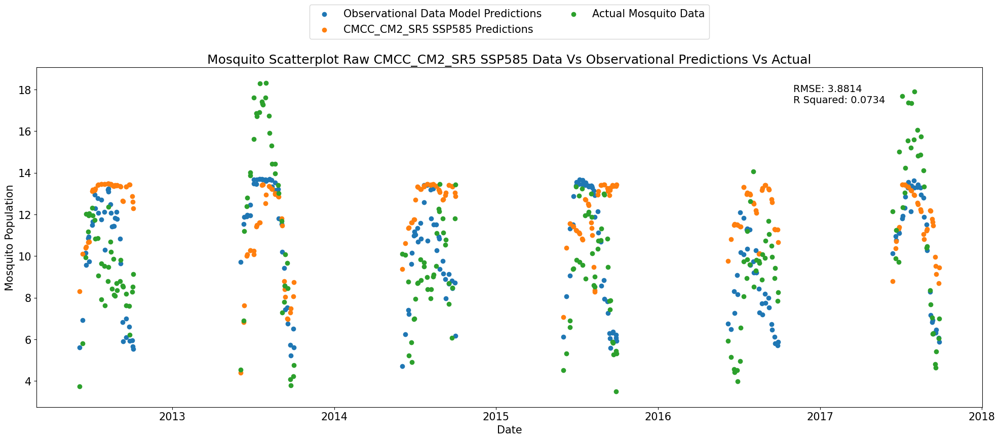

In [49]:
Yobserved=ObservedDataset.iloc[:,4:5]
xtestset = combined_df.iloc[18980:, [17, 31, 32, 30, 33, 34, 16]]
ytestset = ObservedDataset.iloc[:, 4:5]
look_back = 60
xtest = np.array([xtestset.iloc[i-look_back:i, :] for i in range(look_back, 5840)])
ytest = np.array([ytestset.iloc[i, 0] for i in range(look_back, 3435)])
xtest = xtest.astype('float32')
ytest = ytest.astype('float32')

cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']

key_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Corrected_Surface Temp': 'Moving Mean Temp', 'Moving Corrected_Precip': 'Moving Total Precip',
        'Moving Corrected_LAI': 'Moving LAI', 'Moving Corrected_Runoff': 'Moving Outflow (m^3/s)', 'Moving Corrected_SM': 'Moving SM',
        'Timeskip': 'Timeskip'}
for i, feature in enumerate(cols):
    mapped_feature = key_mapping.get(feature, feature)
    xtest[:,:,i] = (xtest[:,:,i] - feature_means[mapped_feature]) / feature_stds[mapped_feature]

CMIPprediction=regressor.predict(xtest)

CMIP_Test_Results = pd.DataFrame({'CMIP Mosq Predict Std Scale': CMIPprediction.reshape(-1)})
CMIP_Test_Results['Date']=pd.to_datetime(CMIPValues_CMCC_CM2_SR5_585_1[['Year', 'Month', 'Day']][19039:24820]).reset_index(drop=True)

ObservedMosqValues = pd.DataFrame({'St Scale Mosq Actual': Yobserved.values.reshape(-1),'Date': ObservedDataset['Date']})
merged_df_CMCC_CM2_SR5_SSP585 = pd.merge(CMIP_Test_Results,ObservedMosqValues,how='right',on='Date')
merged_df_CMCC_CM2_SR5_SSP585['CMIP Mosq Predict'] = merged_df_CMCC_CM2_SR5_SSP585['CMIP Mosq Predict Std Scale'] 
merged_df_CMCC_CM2_SR5_SSP585['Mosq Actual'] = merged_df_CMCC_CM2_SR5_SSP585['St Scale Mosq Actual'] 
merged_df_CMCC_CM2_SR5_SSP585.dropna(inplace=True)
merged_df_CMCC_CM2_SR5_SSP585 = merged_df_CMCC_CM2_SR5_SSP585[merged_df_CMCC_CM2_SR5_SSP585['Mosq Actual'] > 0]
merged_df_CMCC_CM2_SR5_SSP585.reset_index(inplace=True, drop=True)

# How does the CMIP Prediction compare to the Actual LSTM Pred vs Observational Data
CMIPvsObsPredict_CMCC_CM2_SR5_SSP585=pd.merge(TestNo0,merged_df_CMCC_CM2_SR5_SSP585,how='left',left_on=['Date'],right_on=['Date'])
plt.close('all')
CMIPvsObsPredict_CMCC_CM2_SR5_SSP585=CMIPvsObsPredict_CMCC_CM2_SR5_SSP585.dropna()

mse = mean_squared_error(CMIPvsObsPredict_CMCC_CM2_SR5_SSP585['Mosq Actual'], CMIPvsObsPredict_CMCC_CM2_SR5_SSP585['CMIP Mosq Predict'])
rmse = np.sqrt(mse)
corr_matrix = np.corrcoef(CMIPvsObsPredict_CMCC_CM2_SR5_SSP585['Mosq Actual'], CMIPvsObsPredict_CMCC_CM2_SR5_SSP585['CMIP Mosq Predict'])
corr = corr_matrix[0,1]
r_sq = corr**2

text = f"RMSE: {rmse:.4f}\nR Squared: {r_sq:.4f}"
plt.text(0.80, 0.95, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')

plt.scatter(CMIPvsObsPredict_CMCC_CM2_SR5_SSP585['Date'],CMIPvsObsPredict_CMCC_CM2_SR5_SSP585['Mosquito Predictions'],label='Observational Data Model Predictions')
plt.scatter(CMIPvsObsPredict_CMCC_CM2_SR5_SSP585['Date'],CMIPvsObsPredict_CMCC_CM2_SR5_SSP585['CMIP Mosq Predict'],label='CMCC_CM2_SR5 SSP585 Predictions')
plt.scatter(CMIPvsObsPredict_CMCC_CM2_SR5_SSP585['Date'],CMIPvsObsPredict_CMCC_CM2_SR5_SSP585['Mosq Actual'],label='Actual Mosquito Data')
plt.title('Mosquito Scatterplot Raw CMCC_CM2_SR5 SSP585 Data Vs Observational Predictions Vs Actual')
plt.ylabel('Mosquito Population')
plt.xlabel('Date')
plt.legend(loc="upper center", bbox_to_anchor=(0.5, 1.2), ncol=2)
plt.tight_layout()
plt.show()

In [50]:
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CMCC_CM2_SR5_585)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week

CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
CombinedDailyFinalized=pd.merge(CMIPAnomaly_2015_2100_Daily, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
CombinedDailyFinalized=CombinedDailyFinalized.sort_values(by='Date')
CMIP_Test_Results_Anomaly_Daily_Dataset=pd.DataFrame()

CMIP_Test_Results_Anomaly_Daily_Dataset['LAI']=CombinedDailyFinalized['LAI_cmip']*abs(CombinedDailyFinalized['LAI_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Surface Temp']=CombinedDailyFinalized['Surface Temp_cmip']+(CombinedDailyFinalized['Surface Temp_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Precip']=CombinedDailyFinalized['Precip_cmip']*abs(CombinedDailyFinalized['Precip_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Runoff']=CombinedDailyFinalized['Runoff_cmip']*abs(CombinedDailyFinalized['Runoff_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['SM']=CombinedDailyFinalized['SM_cmip']*abs(CombinedDailyFinalized['SM_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Date']=CombinedDailyFinalized['Date']
CMIP_Test_Results_Anomaly_Daily_Dataset['Day']=CombinedDailyFinalized['Date'].dt.day
CMIP_Test_Results_Anomaly_Daily_Dataset['Month']=CombinedDailyFinalized['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily_Dataset['Year']=CombinedDailyFinalized['Date'].dt.year

window_size = 7
for col_name in ['Surface Temp', 'Runoff', 'SM', 'Precip', 'LAI']:
    calc_rolling_mean(CMIP_Test_Results_Anomaly_Daily_Dataset, col_name, window_size)
CMIP_Test_Results_Anomaly_Daily_Dataset['Timeskip'] = 86400.0
Daylight=Daylight.drop(columns=['Timeskip'])
CMIP_Test_Results_Anomaly_Daily_Dataset = pd.merge(CMIP_Test_Results_Anomaly_Daily_Dataset, Daylight, how='left', left_on=['Month'], right_on=['Month'])

cols = ['Daylight_s', 'Moving Surface Temp', 'Moving Precip', 'Moving LAI', 'Moving Runoff', 'Moving SM', 'Timeskip']
xtestset = CMIP_Test_Results_Anomaly_Daily_Dataset[cols]

num_rows = xtestset.shape[0]
look_back = 60
num_windows = num_rows - look_back
x_test_3d = np.empty((num_windows, look_back, 7))

for i in range(num_windows):
    x_test_3d[i] = xtestset.iloc[i:i+look_back].values
feature_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Surface Temp': 'Moving Mean Temp', 'Moving Precip': 'Moving Total Precip',
    'Moving LAI': 'Moving LAI', 'Moving Runoff': 'Moving Outflow (m^3/s)', 'Moving SM': 'Moving SM', 'Timeskip': 'Timeskip'}

for i, feature in enumerate(cols):
    corresponding_feature = feature_mapping.get(feature, feature) 
    x_test_3d[:,:,i] = (x_test_3d[:,:,i] - feature_means[corresponding_feature]) / feature_stds[corresponding_feature]

CMIP_prediction_Anomaly_Daily = pd.DataFrame(regressor.predict(x_test_3d))
CMIP_Test_Results_Anomaly_Daily = pd.DataFrame({'Normalized Mosq Predict': CMIP_prediction_Anomaly_Daily[0]})
CMIP_Test_Results_Anomaly_Daily['Mosq Predict'] = CMIP_Test_Results_Anomaly_Daily['Normalized Mosq Predict'] 

CMIP_Future_Dates = CMIP_Test_Results_Anomaly_Daily_Dataset['Date'][60:31390].reset_index()
CMIP_Test_Results_Anomaly_Daily_Date = CMIP_Future_Dates.copy()
CMIP_Test_Results_Anomaly_Daily['Date'] = CMIP_Test_Results_Anomaly_Daily_Date['Date']
CMIP_Test_Results_Anomaly_Daily['Year'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.year
CMIP_Test_Results_Anomaly_Daily['Month'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily['Day'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.day

980/980 [==============================] - 8s 8ms/step


In [51]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.0,0.0,2015-03-02 12:00:00,2015,3,2
1,0.0,0.0,2015-03-03 12:00:00,2015,3,3
2,0.0,0.0,2015-03-04 12:00:00,2015,3,4
3,0.0,0.0,2015-03-05 12:00:00,2015,3,5
4,0.0,0.0,2015-03-06 12:00:00,2015,3,6
...,...,...,...,...,...,...
31325,0.0,0.0,2100-12-27 12:00:00,2100,12,27
31326,0.0,0.0,2100-12-28 12:00:00,2100,12,28
31327,0.0,0.0,2100-12-29 12:00:00,2100,12,29
31328,0.0,0.0,2100-12-30 12:00:00,2100,12,30


In [52]:
CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Mosq Predict']<0]

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day


In [53]:
CMIP_Test_Results_Anomaly_Daily = CMIP_Test_Results_Anomaly_Daily[(CMIP_Test_Results_Anomaly_Daily['Month'] > 4) & (CMIP_Test_Results_Anomaly_Daily['Month'] < 11)].reset_index(drop=True)

CMIP_Test_Results_Anomaly_Daily=CMIP_Test_Results_Anomaly_Daily.reset_index(drop=True)

In [54]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.000000,0.000000,2015-05-01 12:00:00,2015,5,1
1,0.000000,0.000000,2015-05-02 12:00:00,2015,5,2
2,0.000000,0.000000,2015-05-03 12:00:00,2015,5,3
3,0.000000,0.000000,2015-05-04 12:00:00,2015,5,4
4,0.000000,0.000000,2015-05-05 12:00:00,2015,5,5
...,...,...,...,...,...,...
15819,7.673224,7.673224,2100-10-27 12:00:00,2100,10,27
15820,8.006193,8.006193,2100-10-28 12:00:00,2100,10,28
15821,8.477668,8.477668,2100-10-29 12:00:00,2100,10,29
15822,9.018380,9.018380,2100-10-30 12:00:00,2100,10,30


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


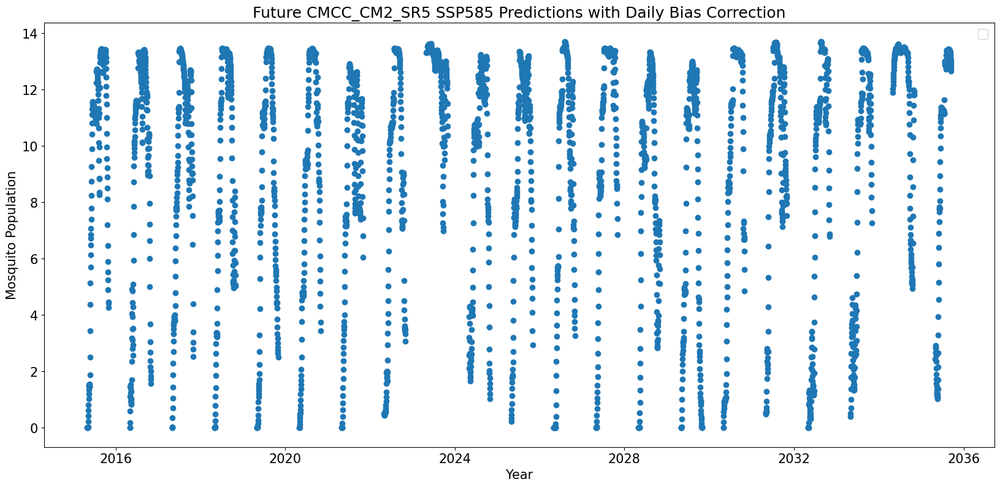

In [55]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'][0:3818],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'][0:3818])
plt.title('Future CMCC_CM2_SR5 SSP585 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


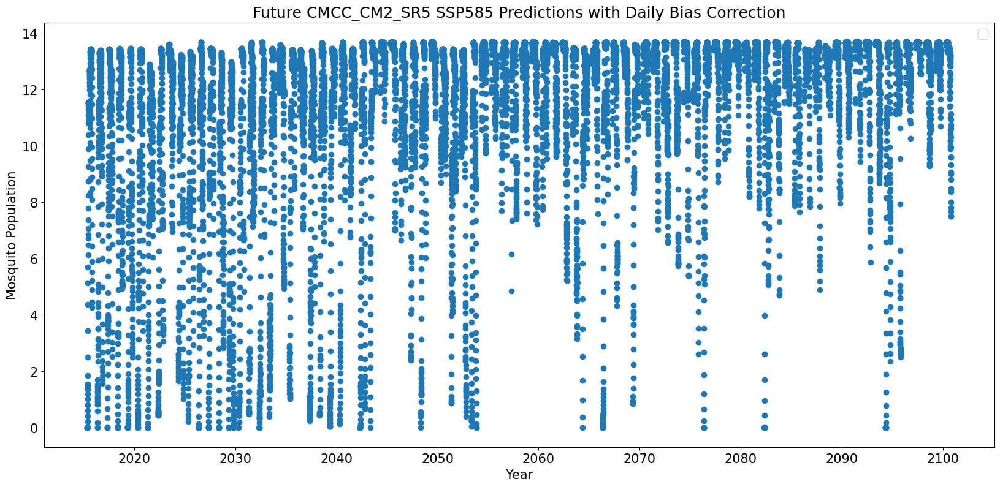

In [56]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'])
plt.title('Future CMCC_CM2_SR5 SSP585 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


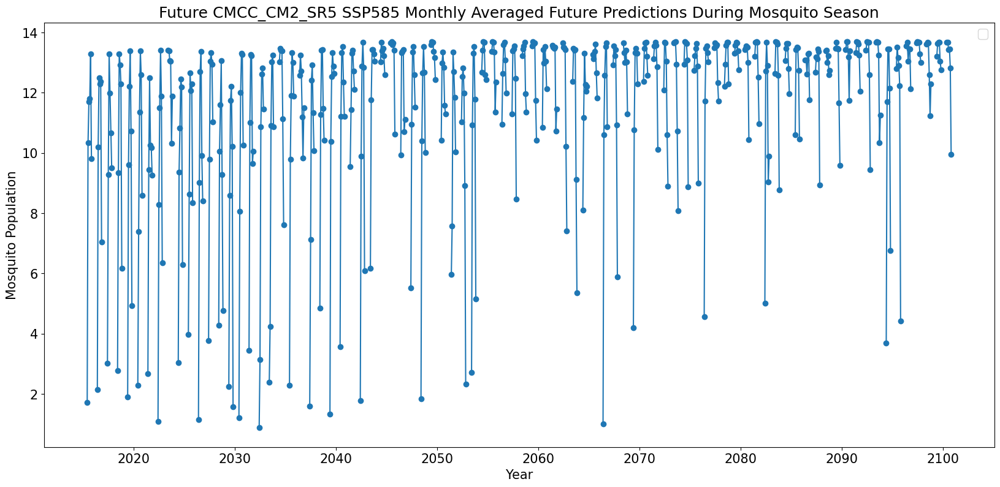

In [57]:
# Bias corrected plot
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')

CMIP_Test_Results_Anomaly_Daily['Date'] = pd.to_datetime(CMIP_Test_Results_Anomaly_Daily['Date'])
CMIP_Test_Results_Anomaly_Daily.set_index('Date', inplace=True)
monthly_means = CMIP_Test_Results_Anomaly_Daily['Mosq Predict'].resample('M').mean()

plt.plot(monthly_means.index, monthly_means.values, marker='o')
plt.title('Future CMCC_CM2_SR5 SSP585 Monthly Averaged Future Predictions During Mosquito Season')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

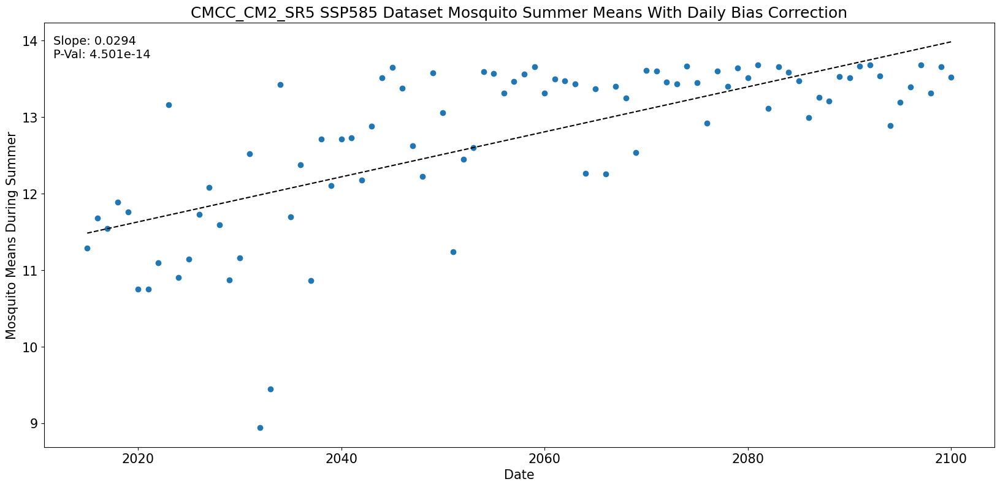

In [58]:
# summer means plot
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Month']<9]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal[CMIP_Test_Results_Anomaly_Summer_Seasonal['Month']>5]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.groupby(['Year']).mean()
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.reset_index()
SummerMeansDF['Year']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']
SummerMeansDF['Mosq Predict CMCC_CM2_SR5 SSP585']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']

plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'])
plt.title('CMCC_CM2_SR5 SSP585 Dataset Mosquito Summer Means With Daily Bias Correction')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Date')

trend = np.polyfit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'], 1)
fit = np.poly1d(trend)
plt.plot(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'], fit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']), "r--", color='black')
slope = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).slope
pval = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).pvalue
text = f"Slope: {slope:.4f}\nP-Val: {pval:.3e}"
plt.text(0.01, 0.97, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')
plt.show()

In [59]:
##########################  CESM2 245

In [60]:
CMIPValues_CESM2_245['Timeskip'] = CMIPValues_CESM2_245['Date'].diff().dt.total_seconds()
CMIPValues_CESM2_245['Timeskip'].fillna(CMIPValues_CESM2_245['Timeskip'][1], inplace=True)

DaylightExtract = copy.deepcopy(ObservedDataset)
DaylightExtract['Year'] = DaylightExtract['Date'].dt.year
DaylightExtract['Month'] = DaylightExtract['Date'].dt.month
DaylightExtract['Day'] = DaylightExtract['Date'].dt.day

Daylight = DaylightExtract.groupby('Month').mean().reset_index()
Daylight = Daylight.drop(columns=[ 'Moving Daylight', '# of Mosquitoes', '# of Mosquitoes Rolling', 'Total Rain (mm)', 'Total Precip (mm)',
       'Moving Mean Temp', 'Moving Total Precip', 'Moving Total Rain', 'LAI', 'Moving LAI', 'Outflow (m^3/s)','Moving Outflow (m^3/s)', 'SM',
       'Moving SM', 'Mean Temp', 'Year','Date', 'Day'])
CMIPValues_CESM2_245=pd.merge(CMIPValues_CESM2_245,Daylight,how='left',left_on=['Month'],right_on=['Month'])
CMIPValues_CESM2_245_1=CMIPValues_CESM2_245.drop(columns=['Unnamed: 0'])
CMIPValues_CESM2_245_1['Week'] = CMIPValues_CESM2_245_1['Date'].dt.isocalendar().week

CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CESM2_245)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
ratio_cols = ['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM']
CMIP_Anomaly_Daily_Ratio_Finalized.rename(columns={col: f"{col}_ratio" for col in ratio_cols}, inplace=True)


combined_df =pd.merge(CMIPValues_CESM2_245_1, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
combined_df=combined_df.sort_values(by='Date')
combined_df['Corrected_LAI'] = combined_df['LAI'] * abs(combined_df['LAI_ratio'])
combined_df['Corrected_Surface Temp'] = combined_df['Surface Temp'] + combined_df['Surface Temp_ratio']
combined_df['Corrected_Precip'] = combined_df['Precip'] * abs(combined_df['Precip_ratio'])
combined_df['Corrected_Runoff'] = combined_df['Runoff'] * abs(combined_df['Runoff_ratio'])
combined_df['Corrected_SM'] = combined_df['SM'] * abs(combined_df['SM_ratio'])

window_size = 7
for col_name in ['Corrected_LAI','Corrected_Surface Temp', 'Corrected_Precip', 'Corrected_Runoff','Corrected_SM']:
    calc_rolling_mean(combined_df, col_name, window_size)

181/181 [==============================] - 2s 12ms/step


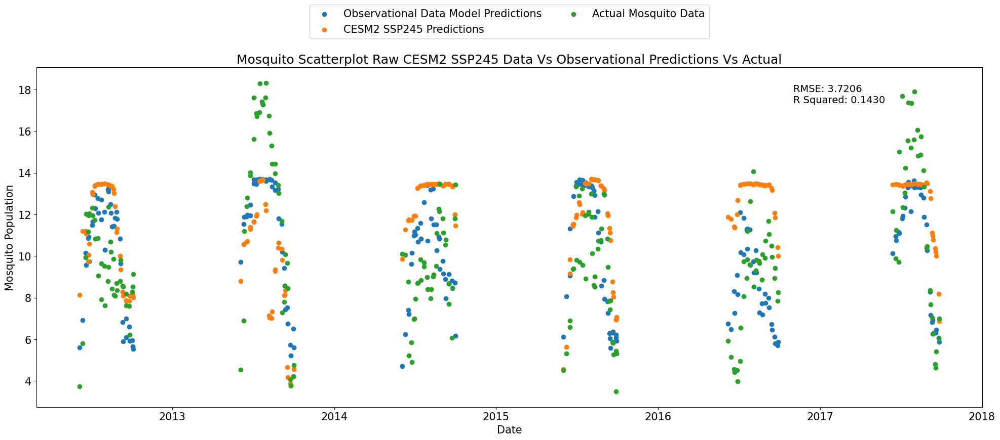

In [61]:
Yobserved=ObservedDataset.iloc[:,4:5]
xtestset = combined_df.iloc[18980:, [17, 31, 32, 30, 33, 34, 16]]
ytestset = ObservedDataset.iloc[:, 4:5]
look_back = 60
xtest = np.array([xtestset.iloc[i-look_back:i, :] for i in range(look_back, 5840)])
ytest = np.array([ytestset.iloc[i, 0] for i in range(look_back, 3435)])
xtest = xtest.astype('float32')
ytest = ytest.astype('float32')

cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']
key_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Corrected_Surface Temp': 'Moving Mean Temp', 'Moving Corrected_Precip': 'Moving Total Precip',
        'Moving Corrected_LAI': 'Moving LAI', 'Moving Corrected_Runoff': 'Moving Outflow (m^3/s)', 'Moving Corrected_SM': 'Moving SM',
        'Timeskip': 'Timeskip'}
for i, feature in enumerate(cols):
    mapped_feature = key_mapping.get(feature, feature) 
    xtest[:,:,i] = (xtest[:,:,i] - feature_means[mapped_feature]) / feature_stds[mapped_feature]

CMIPprediction=regressor.predict(xtest)

CMIP_Test_Results = pd.DataFrame({'CMIP Mosq Predict Std Scale': CMIPprediction.reshape(-1)})
CMIP_Test_Results['Date']=pd.to_datetime(CMIPValues_CESM2_245_1[['Year', 'Month', 'Day']][19039:24820]).reset_index(drop=True)
ObservedMosqValues = pd.DataFrame({'St Scale Mosq Actual': Yobserved.values.reshape(-1),'Date': ObservedDataset['Date']})
merged_df_CESM2_SSP245 = pd.merge(CMIP_Test_Results,ObservedMosqValues,how='right',on='Date')
merged_df_CESM2_SSP245['CMIP Mosq Predict'] = merged_df_CESM2_SSP245['CMIP Mosq Predict Std Scale'] 
merged_df_CESM2_SSP245['Mosq Actual'] = merged_df_CESM2_SSP245['St Scale Mosq Actual']
merged_df_CESM2_SSP245.dropna(inplace=True)
merged_df_CESM2_SSP245 = merged_df_CESM2_SSP245[merged_df_CESM2_SSP245['Mosq Actual'] > 0]
merged_df_CESM2_SSP245.reset_index(inplace=True, drop=True)

# How does the CMIP Prediction compare to the Actual LSTM Pred vs Observational Data
CMIPvsObsPredict_CESM2_SSP245=pd.merge(TestNo0,merged_df_CESM2_SSP245,how='left',left_on=['Date'],right_on=['Date'])
plt.close('all')
CMIPvsObsPredict_CESM2_SSP245=CMIPvsObsPredict_CESM2_SSP245.dropna()

mse = mean_squared_error(CMIPvsObsPredict_CESM2_SSP245['Mosq Actual'], CMIPvsObsPredict_CESM2_SSP245['CMIP Mosq Predict'])
rmse = np.sqrt(mse)
corr_matrix = np.corrcoef(CMIPvsObsPredict_CESM2_SSP245['Mosq Actual'], CMIPvsObsPredict_CESM2_SSP245['CMIP Mosq Predict'])
corr = corr_matrix[0,1]
r_sq = corr**2

text = f"RMSE: {rmse:.4f}\nR Squared: {r_sq:.4f}"
plt.text(0.80, 0.95, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')

plt.scatter(CMIPvsObsPredict_CESM2_SSP245['Date'],CMIPvsObsPredict_CESM2_SSP245['Mosquito Predictions'],label='Observational Data Model Predictions')
plt.scatter(CMIPvsObsPredict_CESM2_SSP245['Date'],CMIPvsObsPredict_CESM2_SSP245['CMIP Mosq Predict'],label='CESM2 SSP245 Predictions')
plt.scatter(CMIPvsObsPredict_CESM2_SSP245['Date'],CMIPvsObsPredict_CESM2_SSP245['Mosq Actual'],label='Actual Mosquito Data')
plt.title('Mosquito Scatterplot Raw CESM2 SSP245 Data Vs Observational Predictions Vs Actual')
plt.ylabel('Mosquito Population')
plt.xlabel('Date')
plt.legend(loc="upper center", bbox_to_anchor=(0.5, 1.2), ncol=2)
plt.tight_layout()
plt.show()

In [62]:
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CESM2_245)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week

CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
CombinedDailyFinalized=pd.merge(CMIPAnomaly_2015_2100_Daily, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
CombinedDailyFinalized=CombinedDailyFinalized.sort_values(by='Date')
CMIP_Test_Results_Anomaly_Daily_Dataset=pd.DataFrame()

CMIP_Test_Results_Anomaly_Daily_Dataset['LAI']=CombinedDailyFinalized['LAI_cmip']*abs(CombinedDailyFinalized['LAI_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Surface Temp']=CombinedDailyFinalized['Surface Temp_cmip']+(CombinedDailyFinalized['Surface Temp_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Precip']=CombinedDailyFinalized['Precip_cmip']*abs(CombinedDailyFinalized['Precip_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Runoff']=CombinedDailyFinalized['Runoff_cmip']*abs(CombinedDailyFinalized['Runoff_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['SM']=CombinedDailyFinalized['SM_cmip']*abs(CombinedDailyFinalized['SM_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Date']=CombinedDailyFinalized['Date']
CMIP_Test_Results_Anomaly_Daily_Dataset['Day']=CombinedDailyFinalized['Date'].dt.day
CMIP_Test_Results_Anomaly_Daily_Dataset['Month']=CombinedDailyFinalized['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily_Dataset['Year']=CombinedDailyFinalized['Date'].dt.year

window_size = 7
for col_name in ['Surface Temp', 'Runoff', 'SM', 'Precip', 'LAI']:
    calc_rolling_mean(CMIP_Test_Results_Anomaly_Daily_Dataset, col_name, window_size)
CMIP_Test_Results_Anomaly_Daily_Dataset['Timeskip'] = 86400.0
Daylight=Daylight.drop(columns=['Timeskip'])
CMIP_Test_Results_Anomaly_Daily_Dataset = pd.merge(CMIP_Test_Results_Anomaly_Daily_Dataset, Daylight, how='left', left_on=['Month'], right_on=['Month'])

cols = ['Daylight_s', 'Moving Surface Temp', 'Moving Precip', 'Moving LAI', 'Moving Runoff', 'Moving SM', 'Timeskip']
xtestset = CMIP_Test_Results_Anomaly_Daily_Dataset[cols]

num_rows = xtestset.shape[0]
look_back = 60
num_windows = num_rows - look_back
x_test_3d = np.empty((num_windows, look_back, 7))

for i in range(num_windows):
    x_test_3d[i] = xtestset.iloc[i:i+look_back].values
feature_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Surface Temp': 'Moving Mean Temp', 'Moving Precip': 'Moving Total Precip',
    'Moving LAI': 'Moving LAI', 'Moving Runoff': 'Moving Outflow (m^3/s)', 'Moving SM': 'Moving SM', 'Timeskip': 'Timeskip'}

for i, feature in enumerate(cols):
    corresponding_feature = feature_mapping.get(feature, feature)
    x_test_3d[:,:,i] = (x_test_3d[:,:,i] - feature_means[corresponding_feature]) / feature_stds[corresponding_feature]

CMIP_prediction_Anomaly_Daily = pd.DataFrame(regressor.predict(x_test_3d))
CMIP_Test_Results_Anomaly_Daily = pd.DataFrame({'Normalized Mosq Predict': CMIP_prediction_Anomaly_Daily[0]})
CMIP_Test_Results_Anomaly_Daily['Mosq Predict'] = CMIP_Test_Results_Anomaly_Daily['Normalized Mosq Predict'] 

CMIP_Future_Dates = CMIP_Test_Results_Anomaly_Daily_Dataset['Date'][60:31390].reset_index()
CMIP_Test_Results_Anomaly_Daily_Date = CMIP_Future_Dates.copy()
CMIP_Test_Results_Anomaly_Daily['Date'] = CMIP_Test_Results_Anomaly_Daily_Date['Date']
CMIP_Test_Results_Anomaly_Daily['Year'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.year
CMIP_Test_Results_Anomaly_Daily['Month'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily['Day'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.day

980/980 [==============================] - 8s 8ms/step


In [63]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.0,0.0,2015-03-02,2015,3,2
1,0.0,0.0,2015-03-03,2015,3,3
2,0.0,0.0,2015-03-04,2015,3,4
3,0.0,0.0,2015-03-05,2015,3,5
4,0.0,0.0,2015-03-06,2015,3,6
...,...,...,...,...,...,...
31325,0.0,0.0,2100-12-27,2100,12,27
31326,0.0,0.0,2100-12-28,2100,12,28
31327,0.0,0.0,2100-12-29,2100,12,29
31328,0.0,0.0,2100-12-30,2100,12,30


In [64]:
CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Mosq Predict']<0]

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day


In [65]:
CMIP_Test_Results_Anomaly_Daily = CMIP_Test_Results_Anomaly_Daily[(CMIP_Test_Results_Anomaly_Daily['Month'] > 4) & (CMIP_Test_Results_Anomaly_Daily['Month'] < 11)].reset_index(drop=True)
CMIP_Test_Results_Anomaly_Daily=CMIP_Test_Results_Anomaly_Daily.reset_index(drop=True)

In [66]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.000000,0.000000,2015-05-01,2015,5,1
1,0.000000,0.000000,2015-05-02,2015,5,2
2,0.000000,0.000000,2015-05-03,2015,5,3
3,0.000000,0.000000,2015-05-04,2015,5,4
4,0.000000,0.000000,2015-05-05,2015,5,5
...,...,...,...,...,...,...
15819,2.631098,2.631098,2100-10-27,2100,10,27
15820,2.744412,2.744412,2100-10-28,2100,10,28
15821,2.774364,2.774364,2100-10-29,2100,10,29
15822,2.744957,2.744957,2100-10-30,2100,10,30


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


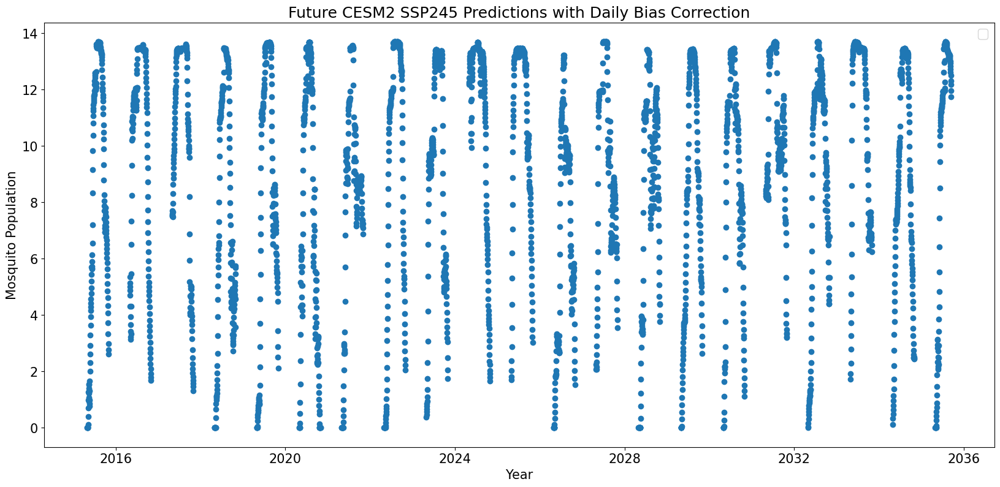

In [67]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'][0:3818],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'][0:3818])
plt.title('Future CESM2 SSP245 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


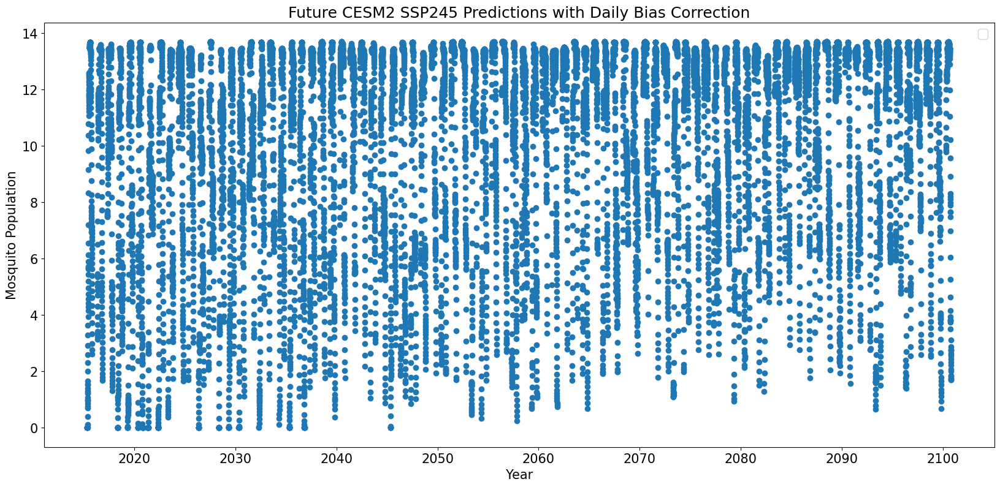

In [68]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'])
plt.title('Future CESM2 SSP245 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


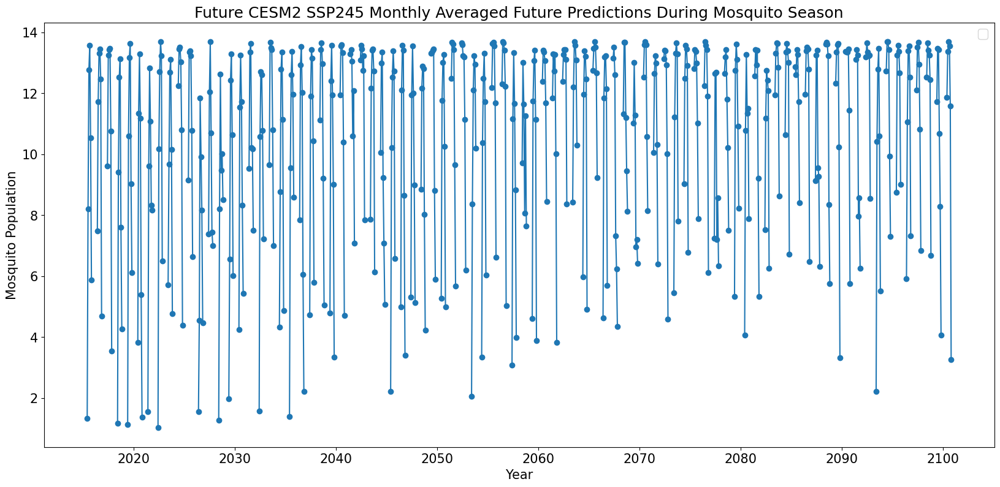

In [69]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
CMIP_Test_Results_Anomaly_Daily['Date'] = pd.to_datetime(CMIP_Test_Results_Anomaly_Daily['Date'])
CMIP_Test_Results_Anomaly_Daily.set_index('Date', inplace=True)
monthly_means = CMIP_Test_Results_Anomaly_Daily['Mosq Predict'].resample('M').mean()
plt.plot(monthly_means.index, monthly_means.values, marker='o')
plt.title('Future CESM2 SSP245 Monthly Averaged Future Predictions During Mosquito Season')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

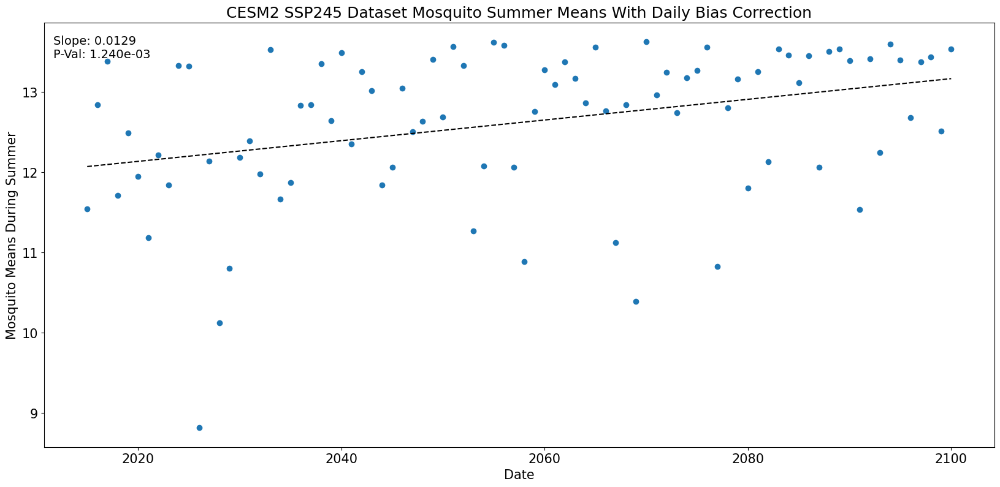

In [70]:
# summer means plot
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Month']<9]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal[CMIP_Test_Results_Anomaly_Summer_Seasonal['Month']>5]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.groupby(['Year']).mean()
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.reset_index()
SummerMeansDF['Year']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']
SummerMeansDF['Mosq Predict CESM2 SSP245']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']

plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'])
plt.title('CESM2 SSP245 Dataset Mosquito Summer Means With Daily Bias Correction')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Date')

trend = np.polyfit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'], 1)
fit = np.poly1d(trend)
plt.plot(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'], fit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']), "r--", color='black')
slope = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).slope
pval = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).pvalue
text = f"Slope: {slope:.4f}\nP-Val: {pval:.3e}"
plt.text(0.01, 0.97, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')
plt.show()

In [71]:
##########################  CESM2 585

In [72]:
CMIPValues_CESM2_585['Timeskip'] = CMIPValues_CESM2_585['Date'].diff().dt.total_seconds()
CMIPValues_CESM2_585['Timeskip'].fillna(CMIPValues_CESM2_585['Timeskip'][1], inplace=True)

DaylightExtract = copy.deepcopy(ObservedDataset)
DaylightExtract['Year'] = DaylightExtract['Date'].dt.year
DaylightExtract['Month'] = DaylightExtract['Date'].dt.month
DaylightExtract['Day'] = DaylightExtract['Date'].dt.day

Daylight = DaylightExtract.groupby('Month').mean().reset_index()
Daylight = Daylight.drop(columns=[ 'Moving Daylight', '# of Mosquitoes', '# of Mosquitoes Rolling', 'Total Rain (mm)', 'Total Precip (mm)',
       'Moving Mean Temp', 'Moving Total Precip', 'Moving Total Rain', 'LAI', 'Moving LAI', 'Outflow (m^3/s)','Moving Outflow (m^3/s)', 'SM',
       'Moving SM', 'Mean Temp', 'Year','Date', 'Day'])
CMIPValues_CESM2_585=pd.merge(CMIPValues_CESM2_585,Daylight,how='left',left_on=['Month'],right_on=['Month'])
CMIPValues_CESM2_585_1=CMIPValues_CESM2_585.drop(columns=['Unnamed: 0'])
CMIPValues_CESM2_585_1['Week'] = CMIPValues_CESM2_585_1['Date'].dt.isocalendar().week

# anomaly calc
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CESM2_585)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
ratio_cols = ['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM']
CMIP_Anomaly_Daily_Ratio_Finalized.rename(columns={col: f"{col}_ratio" for col in ratio_cols}, inplace=True)

combined_df =pd.merge(CMIPValues_CESM2_585_1, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
combined_df=combined_df.sort_values(by='Date')
combined_df['Corrected_LAI'] = combined_df['LAI'] * abs(combined_df['LAI_ratio'])
combined_df['Corrected_Surface Temp'] = combined_df['Surface Temp'] + combined_df['Surface Temp_ratio']
combined_df['Corrected_Precip'] = combined_df['Precip'] * abs(combined_df['Precip_ratio'])
combined_df['Corrected_Runoff'] = combined_df['Runoff'] * abs(combined_df['Runoff_ratio'])
combined_df['Corrected_SM'] = combined_df['SM'] * abs(combined_df['SM_ratio'])

window_size = 7
for col_name in ['Corrected_LAI','Corrected_Surface Temp', 'Corrected_Precip', 'Corrected_Runoff','Corrected_SM']:
    calc_rolling_mean(combined_df, col_name, window_size)

181/181 [==============================] - 2s 12ms/step


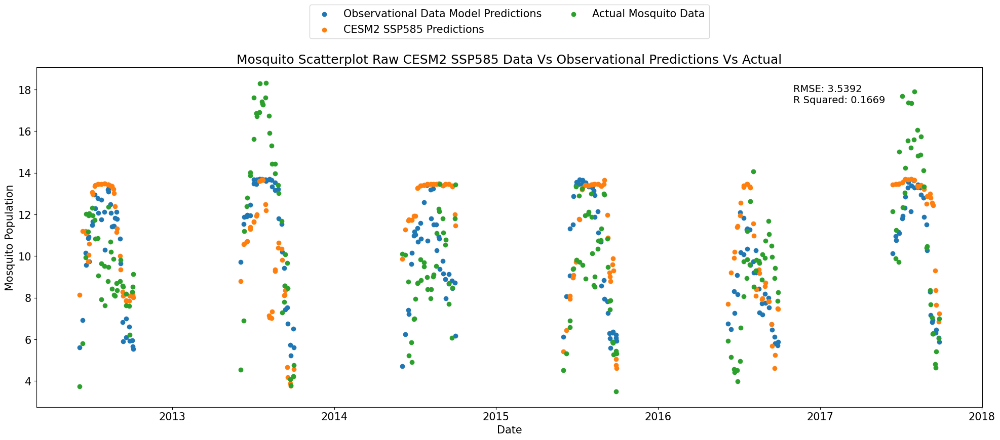

In [73]:
Yobserved=ObservedDataset.iloc[:,4:5]
xtestset = combined_df.iloc[18980:, [17, 31, 32, 30, 33, 34, 16]]
ytestset = ObservedDataset.iloc[:, 4:5]
look_back = 60
xtest = np.array([xtestset.iloc[i-look_back:i, :] for i in range(look_back, 5840)])
ytest = np.array([ytestset.iloc[i, 0] for i in range(look_back, 3435)])
xtest = xtest.astype('float32')
ytest = ytest.astype('float32')

cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']
key_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Corrected_Surface Temp': 'Moving Mean Temp', 'Moving Corrected_Precip': 'Moving Total Precip',
        'Moving Corrected_LAI': 'Moving LAI', 'Moving Corrected_Runoff': 'Moving Outflow (m^3/s)', 'Moving Corrected_SM': 'Moving SM',
        'Timeskip': 'Timeskip'}
for i, feature in enumerate(cols):
    mapped_feature = key_mapping.get(feature, feature)
    xtest[:,:,i] = (xtest[:,:,i] - feature_means[mapped_feature]) / feature_stds[mapped_feature]

CMIPprediction=regressor.predict(xtest)

CMIP_Test_Results = pd.DataFrame({'CMIP Mosq Predict Std Scale': CMIPprediction.reshape(-1)})
CMIP_Test_Results['Date']=pd.to_datetime(CMIPValues_CESM2_585_1[['Year', 'Month', 'Day']][19039:24820]).reset_index(drop=True)
ObservedMosqValues = pd.DataFrame({'St Scale Mosq Actual': Yobserved.values.reshape(-1),'Date': ObservedDataset['Date']})

merged_df_CESM2_SSP585 = pd.merge(CMIP_Test_Results,ObservedMosqValues,how='right',on='Date')
merged_df_CESM2_SSP585['CMIP Mosq Predict'] = merged_df_CESM2_SSP585['CMIP Mosq Predict Std Scale'] 
merged_df_CESM2_SSP585['Mosq Actual'] = merged_df_CESM2_SSP585['St Scale Mosq Actual'] 
merged_df_CESM2_SSP585.dropna(inplace=True)

merged_df_CESM2_SSP585 = merged_df_CESM2_SSP585[merged_df_CESM2_SSP585['Mosq Actual'] > 0]
merged_df_CESM2_SSP585.reset_index(inplace=True, drop=True)

# How does the CMIP Prediction compare to the Actual LSTM Pred vs Observational Data
CMIPvsObsPredict_CESM2_SSP585=pd.merge(TestNo0,merged_df_CESM2_SSP585,how='left',left_on=['Date'],right_on=['Date'])
plt.close('all')
CMIPvsObsPredict_CESM2_SSP585=CMIPvsObsPredict_CESM2_SSP585.dropna()

mse = mean_squared_error(CMIPvsObsPredict_CESM2_SSP585['Mosq Actual'], CMIPvsObsPredict_CESM2_SSP585['CMIP Mosq Predict'])
rmse = np.sqrt(mse)
corr_matrix = np.corrcoef(CMIPvsObsPredict_CESM2_SSP585['Mosq Actual'], CMIPvsObsPredict_CESM2_SSP585['CMIP Mosq Predict'])
corr = corr_matrix[0,1]
r_sq = corr**2

text = f"RMSE: {rmse:.4f}\nR Squared: {r_sq:.4f}"
plt.text(0.80, 0.95, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')

plt.scatter(CMIPvsObsPredict_CESM2_SSP585['Date'],CMIPvsObsPredict_CESM2_SSP585['Mosquito Predictions'],label='Observational Data Model Predictions')
plt.scatter(CMIPvsObsPredict_CESM2_SSP585['Date'],CMIPvsObsPredict_CESM2_SSP585['CMIP Mosq Predict'],label='CESM2 SSP585 Predictions')
plt.scatter(CMIPvsObsPredict_CESM2_SSP585['Date'],CMIPvsObsPredict_CESM2_SSP585['Mosq Actual'],label='Actual Mosquito Data')
plt.title('Mosquito Scatterplot Raw CESM2 SSP585 Data Vs Observational Predictions Vs Actual')
plt.ylabel('Mosquito Population')
plt.xlabel('Date')
plt.legend(loc="upper center", bbox_to_anchor=(0.5, 1.2), ncol=2)
plt.tight_layout()
plt.show()

In [74]:
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CESM2_585)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week

CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
CombinedDailyFinalized=pd.merge(CMIPAnomaly_2015_2100_Daily, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
CombinedDailyFinalized=CombinedDailyFinalized.sort_values(by='Date')
CMIP_Test_Results_Anomaly_Daily_Dataset=pd.DataFrame()

CMIP_Test_Results_Anomaly_Daily_Dataset['LAI']=CombinedDailyFinalized['LAI_cmip']*abs(CombinedDailyFinalized['LAI_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Surface Temp']=CombinedDailyFinalized['Surface Temp_cmip']+(CombinedDailyFinalized['Surface Temp_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Precip']=CombinedDailyFinalized['Precip_cmip']*abs(CombinedDailyFinalized['Precip_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Runoff']=CombinedDailyFinalized['Runoff_cmip']*abs(CombinedDailyFinalized['Runoff_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['SM']=CombinedDailyFinalized['SM_cmip']*abs(CombinedDailyFinalized['SM_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Date']=CombinedDailyFinalized['Date']
CMIP_Test_Results_Anomaly_Daily_Dataset['Day']=CombinedDailyFinalized['Date'].dt.day
CMIP_Test_Results_Anomaly_Daily_Dataset['Month']=CombinedDailyFinalized['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily_Dataset['Year']=CombinedDailyFinalized['Date'].dt.year

window_size = 7
for col_name in ['Surface Temp', 'Runoff', 'SM', 'Precip', 'LAI']:
    calc_rolling_mean(CMIP_Test_Results_Anomaly_Daily_Dataset, col_name, window_size)
CMIP_Test_Results_Anomaly_Daily_Dataset['Timeskip'] = 86400.0
Daylight=Daylight.drop(columns=['Timeskip'])
CMIP_Test_Results_Anomaly_Daily_Dataset = pd.merge(CMIP_Test_Results_Anomaly_Daily_Dataset, Daylight, how='left', left_on=['Month'], right_on=['Month'])

cols = ['Daylight_s', 'Moving Surface Temp', 'Moving Precip', 'Moving LAI', 'Moving Runoff', 'Moving SM', 'Timeskip']
xtestset = CMIP_Test_Results_Anomaly_Daily_Dataset[cols]

num_rows = xtestset.shape[0]
look_back = 60
num_windows = num_rows - look_back
x_test_3d = np.empty((num_windows, look_back, 7))

for i in range(num_windows):
    x_test_3d[i] = xtestset.iloc[i:i+look_back].values
feature_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Surface Temp': 'Moving Mean Temp', 'Moving Precip': 'Moving Total Precip',
    'Moving LAI': 'Moving LAI', 'Moving Runoff': 'Moving Outflow (m^3/s)', 'Moving SM': 'Moving SM', 'Timeskip': 'Timeskip'}

for i, feature in enumerate(cols):
    corresponding_feature = feature_mapping.get(feature, feature)
    x_test_3d[:,:,i] = (x_test_3d[:,:,i] - feature_means[corresponding_feature]) / feature_stds[corresponding_feature]

CMIP_prediction_Anomaly_Daily = pd.DataFrame(regressor.predict(x_test_3d))
CMIP_Test_Results_Anomaly_Daily = pd.DataFrame({'Normalized Mosq Predict': CMIP_prediction_Anomaly_Daily[0]})
CMIP_Test_Results_Anomaly_Daily['Mosq Predict'] = CMIP_Test_Results_Anomaly_Daily['Normalized Mosq Predict'] 

CMIP_Future_Dates = CMIP_Test_Results_Anomaly_Daily_Dataset['Date'][60:31390].reset_index()
CMIP_Test_Results_Anomaly_Daily_Date = CMIP_Future_Dates.copy()
CMIP_Test_Results_Anomaly_Daily['Date'] = CMIP_Test_Results_Anomaly_Daily_Date['Date']
CMIP_Test_Results_Anomaly_Daily['Year'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.year
CMIP_Test_Results_Anomaly_Daily['Month'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily['Day'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.day

980/980 [==============================] - 8s 8ms/step


In [75]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.0,0.0,2015-03-02,2015,3,2
1,0.0,0.0,2015-03-03,2015,3,3
2,0.0,0.0,2015-03-04,2015,3,4
3,0.0,0.0,2015-03-05,2015,3,5
4,0.0,0.0,2015-03-06,2015,3,6
...,...,...,...,...,...,...
31325,0.0,0.0,2100-12-27,2100,12,27
31326,0.0,0.0,2100-12-28,2100,12,28
31327,0.0,0.0,2100-12-29,2100,12,29
31328,0.0,0.0,2100-12-30,2100,12,30


In [76]:
CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Mosq Predict']<0]

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day


In [77]:
CMIP_Test_Results_Anomaly_Daily = CMIP_Test_Results_Anomaly_Daily[(CMIP_Test_Results_Anomaly_Daily['Month'] > 4) & (CMIP_Test_Results_Anomaly_Daily['Month'] < 11)].reset_index(drop=True)
CMIP_Test_Results_Anomaly_Daily=CMIP_Test_Results_Anomaly_Daily.reset_index(drop=True)

In [78]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.000000,0.000000,2015-05-01,2015,5,1
1,0.000000,0.000000,2015-05-02,2015,5,2
2,0.000000,0.000000,2015-05-03,2015,5,3
3,0.000000,0.000000,2015-05-04,2015,5,4
4,0.000000,0.000000,2015-05-05,2015,5,5
...,...,...,...,...,...,...
15819,5.991854,5.991854,2100-10-27,2100,10,27
15820,5.806511,5.806511,2100-10-28,2100,10,28
15821,5.634880,5.634880,2100-10-29,2100,10,29
15822,5.310134,5.310134,2100-10-30,2100,10,30


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


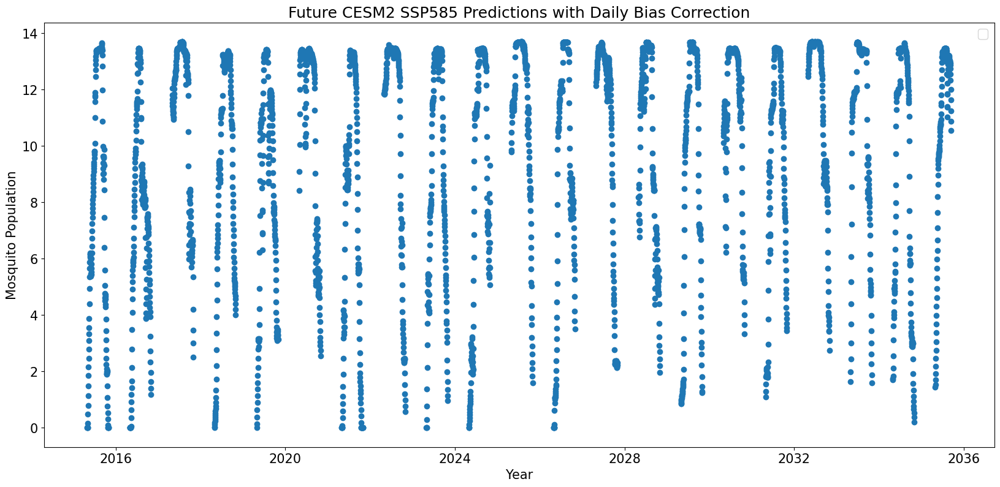

In [79]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'][0:3818],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'][0:3818])
plt.title('Future CESM2 SSP585 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


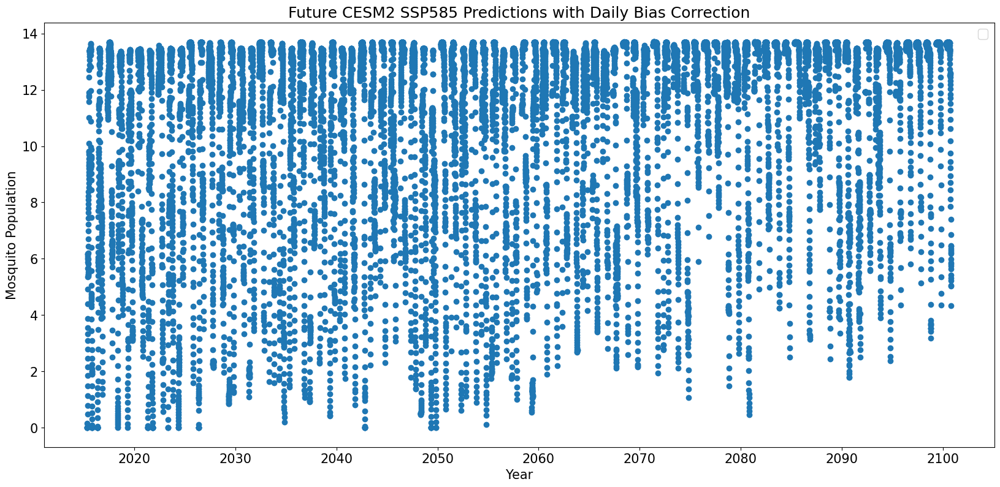

In [80]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'])
plt.title('Future CESM2 SSP585 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


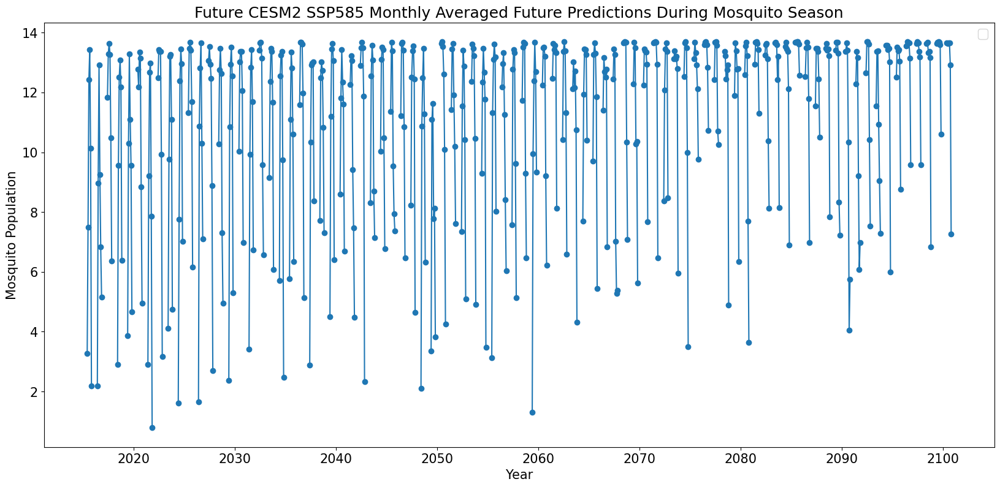

In [81]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
CMIP_Test_Results_Anomaly_Daily['Date'] = pd.to_datetime(CMIP_Test_Results_Anomaly_Daily['Date'])
CMIP_Test_Results_Anomaly_Daily.set_index('Date', inplace=True)
monthly_means = CMIP_Test_Results_Anomaly_Daily['Mosq Predict'].resample('M').mean()
plt.plot(monthly_means.index, monthly_means.values, marker='o')
plt.title('Future CESM2 SSP585 Monthly Averaged Future Predictions During Mosquito Season')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

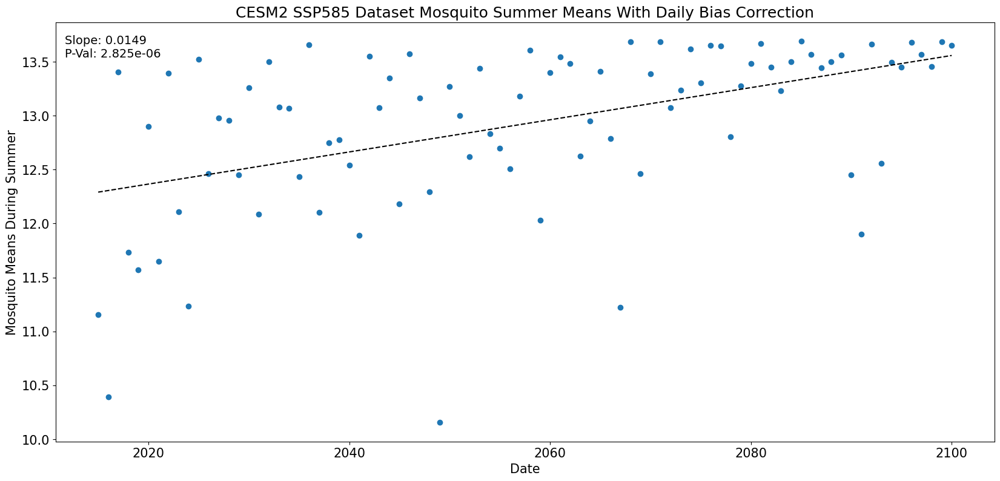

In [82]:
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Month']<9]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal[CMIP_Test_Results_Anomaly_Summer_Seasonal['Month']>5]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.groupby(['Year']).mean()
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.reset_index()
SummerMeansDF['Year']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']
SummerMeansDF['Mosq Predict CESM2 SSP585']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']

plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'])
plt.title('CESM2 SSP585 Dataset Mosquito Summer Means With Daily Bias Correction')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Date')

trend = np.polyfit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'], 1)
fit = np.poly1d(trend)
plt.plot(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'], fit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']), "r--", color='black')
slope = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).slope
pval = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).pvalue
text = f"Slope: {slope:.4f}\nP-Val: {pval:.3e}"
plt.text(0.01, 0.97, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')
plt.show()

In [83]:
##########################  CMCC_ESM2 245

In [84]:
CMIPValues_CMCC_ESM2_245['Timeskip'] = CMIPValues_CMCC_ESM2_245['Date'].diff().dt.total_seconds()
CMIPValues_CMCC_ESM2_245['Timeskip'].fillna(CMIPValues_CMCC_ESM2_245['Timeskip'][1], inplace=True)

DaylightExtract = copy.deepcopy(ObservedDataset)
DaylightExtract['Year'] = DaylightExtract['Date'].dt.year
DaylightExtract['Month'] = DaylightExtract['Date'].dt.month
DaylightExtract['Day'] = DaylightExtract['Date'].dt.day

Daylight = DaylightExtract.groupby('Month').mean().reset_index()
Daylight = Daylight.drop(columns=[ 'Moving Daylight', '# of Mosquitoes', '# of Mosquitoes Rolling', 'Total Rain (mm)', 'Total Precip (mm)',
       'Moving Mean Temp', 'Moving Total Precip', 'Moving Total Rain', 'LAI', 'Moving LAI', 'Outflow (m^3/s)','Moving Outflow (m^3/s)', 'SM',
       'Moving SM', 'Mean Temp', 'Year','Date', 'Day'])
CMIPValues_CMCC_ESM2_245=pd.merge(CMIPValues_CMCC_ESM2_245,Daylight,how='left',left_on=['Month'],right_on=['Month'])
CMIPValues_CMCC_ESM2_245_1=CMIPValues_CMCC_ESM2_245.drop(columns=['Unnamed: 0'])
CMIPValues_CMCC_ESM2_245_1['Week'] = CMIPValues_CMCC_ESM2_245_1['Date'].dt.isocalendar().week

CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CMCC_ESM2_245)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
ratio_cols = ['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM']
CMIP_Anomaly_Daily_Ratio_Finalized.rename(columns={col: f"{col}_ratio" for col in ratio_cols}, inplace=True)

combined_df =pd.merge(CMIPValues_CMCC_ESM2_245_1, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
combined_df=combined_df.sort_values(by='Date')
combined_df['Corrected_LAI'] = combined_df['LAI'] * abs(combined_df['LAI_ratio'])
combined_df['Corrected_Surface Temp'] = combined_df['Surface Temp'] + combined_df['Surface Temp_ratio']
combined_df['Corrected_Precip'] = combined_df['Precip'] * abs(combined_df['Precip_ratio'])
combined_df['Corrected_Runoff'] = combined_df['Runoff'] * abs(combined_df['Runoff_ratio'])
combined_df['Corrected_SM'] = combined_df['SM'] * abs(combined_df['SM_ratio'])

window_size = 7
for col_name in ['Corrected_LAI','Corrected_Surface Temp', 'Corrected_Precip', 'Corrected_Runoff','Corrected_SM']:
    calc_rolling_mean(combined_df, col_name, window_size)

181/181 [==============================] - 2s 12ms/step


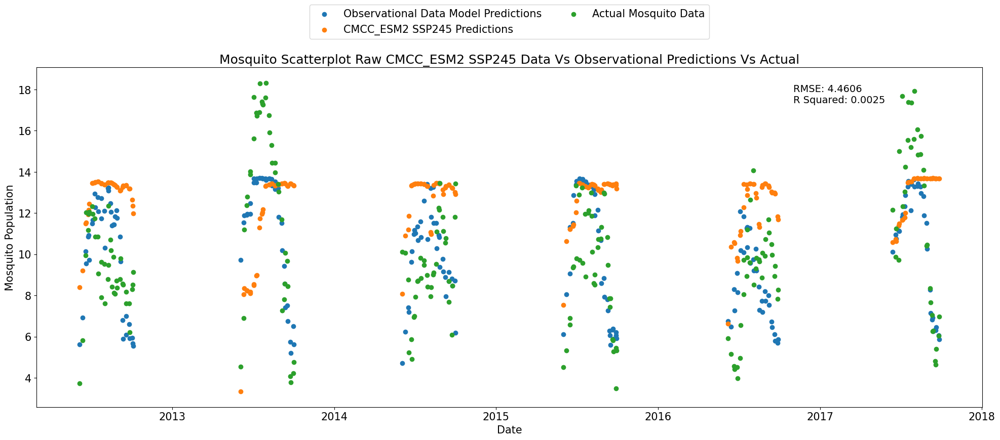

In [85]:
Yobserved=ObservedDataset.iloc[:,4:5]
xtestset = combined_df.iloc[18980:, [17, 31, 32, 30, 33, 34, 16]]
ytestset = ObservedDataset.iloc[:, 4:5]
look_back = 60
xtest = np.array([xtestset.iloc[i-look_back:i, :] for i in range(look_back, 5840)])
ytest = np.array([ytestset.iloc[i, 0] for i in range(look_back, 3435)])
xtest = xtest.astype('float32')
ytest = ytest.astype('float32')

cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']
key_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Corrected_Surface Temp': 'Moving Mean Temp', 'Moving Corrected_Precip': 'Moving Total Precip',
        'Moving Corrected_LAI': 'Moving LAI', 'Moving Corrected_Runoff': 'Moving Outflow (m^3/s)', 'Moving Corrected_SM': 'Moving SM',
        'Timeskip': 'Timeskip'}
for i, feature in enumerate(cols):
    mapped_feature = key_mapping.get(feature, feature)
    xtest[:,:,i] = (xtest[:,:,i] - feature_means[mapped_feature]) / feature_stds[mapped_feature]

CMIPprediction=regressor.predict(xtest)

CMIP_Test_Results = pd.DataFrame({'CMIP Mosq Predict Std Scale': CMIPprediction.reshape(-1)})
CMIP_Test_Results['Date']=pd.to_datetime(CMIPValues_CMCC_ESM2_245_1[['Year', 'Month', 'Day']][19039:24820]).reset_index(drop=True)
ObservedMosqValues = pd.DataFrame({'St Scale Mosq Actual': Yobserved.values.reshape(-1),'Date': ObservedDataset['Date']})

merged_df_CMCC_ESM2_SSP245 = pd.merge(CMIP_Test_Results,ObservedMosqValues,how='right',on='Date')
merged_df_CMCC_ESM2_SSP245['CMIP Mosq Predict'] = merged_df_CMCC_ESM2_SSP245['CMIP Mosq Predict Std Scale'] 
merged_df_CMCC_ESM2_SSP245['Mosq Actual'] = merged_df_CMCC_ESM2_SSP245['St Scale Mosq Actual'] 
merged_df_CMCC_ESM2_SSP245.dropna(inplace=True)
merged_df_CMCC_ESM2_SSP245 = merged_df_CMCC_ESM2_SSP245[merged_df_CMCC_ESM2_SSP245['Mosq Actual'] > 0]
merged_df_CMCC_ESM2_SSP245.reset_index(inplace=True, drop=True)

CMIPvsObsPredict_CMCC_ESM2_SSP245=pd.merge(TestNo0,merged_df_CMCC_ESM2_SSP245,how='left',left_on=['Date'],right_on=['Date'])
plt.close('all')
CMIPvsObsPredict_CMCC_ESM2_SSP245=CMIPvsObsPredict_CMCC_ESM2_SSP245.dropna()

mse = mean_squared_error(CMIPvsObsPredict_CMCC_ESM2_SSP245['Mosq Actual'], CMIPvsObsPredict_CMCC_ESM2_SSP245['CMIP Mosq Predict'])
rmse = np.sqrt(mse)
corr_matrix = np.corrcoef(CMIPvsObsPredict_CMCC_ESM2_SSP245['Mosq Actual'], CMIPvsObsPredict_CMCC_ESM2_SSP245['CMIP Mosq Predict'])
corr = corr_matrix[0,1]
r_sq = corr**2

text = f"RMSE: {rmse:.4f}\nR Squared: {r_sq:.4f}"
plt.text(0.80, 0.95, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')

plt.scatter(CMIPvsObsPredict_CMCC_ESM2_SSP245['Date'],CMIPvsObsPredict_CMCC_ESM2_SSP245['Mosquito Predictions'],label='Observational Data Model Predictions')
plt.scatter(CMIPvsObsPredict_CMCC_ESM2_SSP245['Date'],CMIPvsObsPredict_CMCC_ESM2_SSP245['CMIP Mosq Predict'],label='CMCC_ESM2 SSP245 Predictions')
plt.scatter(CMIPvsObsPredict_CMCC_ESM2_SSP245['Date'],CMIPvsObsPredict_CMCC_ESM2_SSP245['Mosq Actual'],label='Actual Mosquito Data')
plt.title('Mosquito Scatterplot Raw CMCC_ESM2 SSP245 Data Vs Observational Predictions Vs Actual')
plt.ylabel('Mosquito Population')
plt.xlabel('Date')
plt.legend(loc="upper center", bbox_to_anchor=(0.5, 1.2), ncol=2)
plt.tight_layout()
plt.show()

In [86]:
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CMCC_ESM2_245)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week

CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
CombinedDailyFinalized=pd.merge(CMIPAnomaly_2015_2100_Daily, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
CombinedDailyFinalized=CombinedDailyFinalized.sort_values(by='Date')
CMIP_Test_Results_Anomaly_Daily_Dataset=pd.DataFrame()

CMIP_Test_Results_Anomaly_Daily_Dataset['LAI']=CombinedDailyFinalized['LAI_cmip']*abs(CombinedDailyFinalized['LAI_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Surface Temp']=CombinedDailyFinalized['Surface Temp_cmip']+(CombinedDailyFinalized['Surface Temp_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Precip']=CombinedDailyFinalized['Precip_cmip']*abs(CombinedDailyFinalized['Precip_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Runoff']=CombinedDailyFinalized['Runoff_cmip']*abs(CombinedDailyFinalized['Runoff_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['SM']=CombinedDailyFinalized['SM_cmip']*abs(CombinedDailyFinalized['SM_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Date']=CombinedDailyFinalized['Date']
CMIP_Test_Results_Anomaly_Daily_Dataset['Day']=CombinedDailyFinalized['Date'].dt.day
CMIP_Test_Results_Anomaly_Daily_Dataset['Month']=CombinedDailyFinalized['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily_Dataset['Year']=CombinedDailyFinalized['Date'].dt.year

window_size = 7
for col_name in ['Surface Temp', 'Runoff', 'SM', 'Precip', 'LAI']:
    calc_rolling_mean(CMIP_Test_Results_Anomaly_Daily_Dataset, col_name, window_size)
CMIP_Test_Results_Anomaly_Daily_Dataset['Timeskip'] = 86400.0
Daylight=Daylight.drop(columns=['Timeskip'])
CMIP_Test_Results_Anomaly_Daily_Dataset = pd.merge(CMIP_Test_Results_Anomaly_Daily_Dataset, Daylight, how='left', left_on=['Month'], right_on=['Month'])

cols = ['Daylight_s', 'Moving Surface Temp', 'Moving Precip', 'Moving LAI', 'Moving Runoff', 'Moving SM', 'Timeskip']
xtestset = CMIP_Test_Results_Anomaly_Daily_Dataset[cols]

num_rows = xtestset.shape[0]
look_back = 60
num_windows = num_rows - look_back
x_test_3d = np.empty((num_windows, look_back, 7))

for i in range(num_windows):
    x_test_3d[i] = xtestset.iloc[i:i+look_back].values
feature_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Surface Temp': 'Moving Mean Temp', 'Moving Precip': 'Moving Total Precip',
    'Moving LAI': 'Moving LAI', 'Moving Runoff': 'Moving Outflow (m^3/s)', 'Moving SM': 'Moving SM', 'Timeskip': 'Timeskip'}

for i, feature in enumerate(cols):
    corresponding_feature = feature_mapping.get(feature, feature)
    x_test_3d[:,:,i] = (x_test_3d[:,:,i] - feature_means[corresponding_feature]) / feature_stds[corresponding_feature]

CMIP_prediction_Anomaly_Daily = pd.DataFrame(regressor.predict(x_test_3d))
CMIP_Test_Results_Anomaly_Daily = pd.DataFrame({'Normalized Mosq Predict': CMIP_prediction_Anomaly_Daily[0]})
CMIP_Test_Results_Anomaly_Daily['Mosq Predict'] = CMIP_Test_Results_Anomaly_Daily['Normalized Mosq Predict'] 

CMIP_Future_Dates = CMIP_Test_Results_Anomaly_Daily_Dataset['Date'][60:31390].reset_index()
CMIP_Test_Results_Anomaly_Daily_Date = CMIP_Future_Dates.copy()
CMIP_Test_Results_Anomaly_Daily['Date'] = CMIP_Test_Results_Anomaly_Daily_Date['Date']
CMIP_Test_Results_Anomaly_Daily['Year'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.year
CMIP_Test_Results_Anomaly_Daily['Month'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily['Day'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.day

980/980 [==============================] - 8s 8ms/step


In [87]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.0,0.0,2015-03-02 12:00:00,2015,3,2
1,0.0,0.0,2015-03-03 12:00:00,2015,3,3
2,0.0,0.0,2015-03-04 12:00:00,2015,3,4
3,0.0,0.0,2015-03-05 12:00:00,2015,3,5
4,0.0,0.0,2015-03-06 12:00:00,2015,3,6
...,...,...,...,...,...,...
31325,0.0,0.0,2100-12-27 12:00:00,2100,12,27
31326,0.0,0.0,2100-12-28 12:00:00,2100,12,28
31327,0.0,0.0,2100-12-29 12:00:00,2100,12,29
31328,0.0,0.0,2100-12-30 12:00:00,2100,12,30


In [88]:
CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Mosq Predict']<0]

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day


In [89]:
CMIP_Test_Results_Anomaly_Daily = CMIP_Test_Results_Anomaly_Daily[(CMIP_Test_Results_Anomaly_Daily['Month'] > 4) & (CMIP_Test_Results_Anomaly_Daily['Month'] < 11)].reset_index(drop=True)
CMIP_Test_Results_Anomaly_Daily=CMIP_Test_Results_Anomaly_Daily.reset_index(drop=True)

In [90]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.000000,0.000000,2015-05-01 12:00:00,2015,5,1
1,0.000000,0.000000,2015-05-02 12:00:00,2015,5,2
2,0.000000,0.000000,2015-05-03 12:00:00,2015,5,3
3,0.013041,0.013041,2015-05-04 12:00:00,2015,5,4
4,0.098065,0.098065,2015-05-05 12:00:00,2015,5,5
...,...,...,...,...,...,...
15819,3.890211,3.890211,2100-10-27 12:00:00,2100,10,27
15820,3.413752,3.413752,2100-10-28 12:00:00,2100,10,28
15821,3.068906,3.068906,2100-10-29 12:00:00,2100,10,29
15822,2.834346,2.834346,2100-10-30 12:00:00,2100,10,30


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


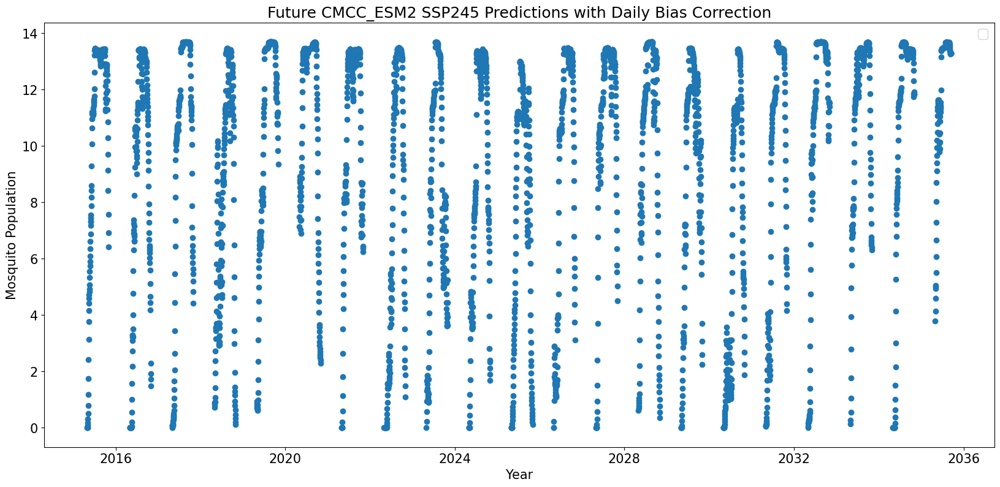

In [91]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'][0:3818],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'][0:3818])
plt.title('Future CMCC_ESM2 SSP245 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


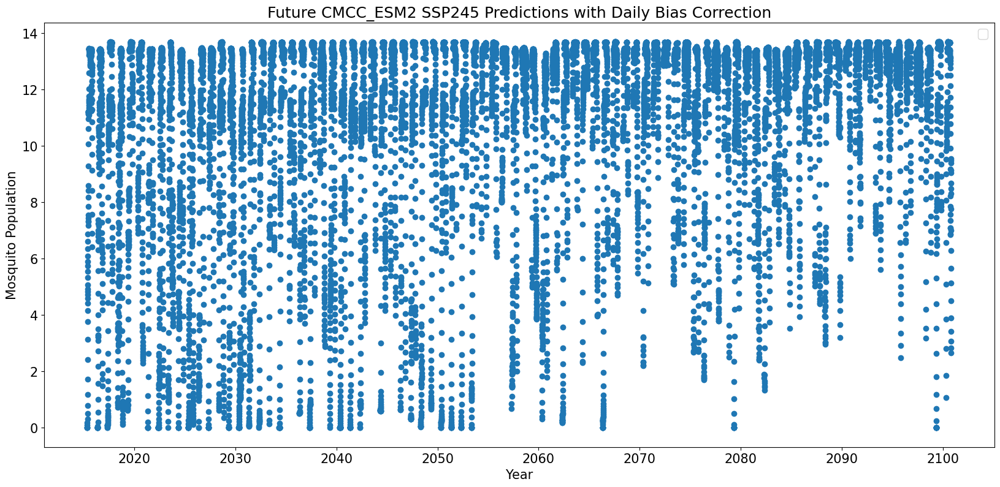

In [92]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'])
plt.title('Future CMCC_ESM2 SSP245 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


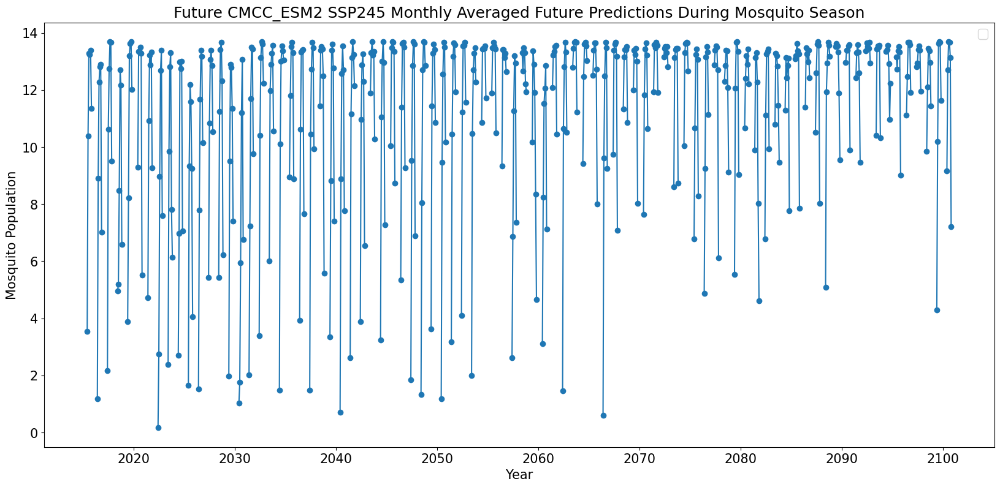

In [93]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')

CMIP_Test_Results_Anomaly_Daily['Date'] = pd.to_datetime(CMIP_Test_Results_Anomaly_Daily['Date'])
CMIP_Test_Results_Anomaly_Daily.set_index('Date', inplace=True)
monthly_means = CMIP_Test_Results_Anomaly_Daily['Mosq Predict'].resample('M').mean()

plt.plot(monthly_means.index, monthly_means.values, marker='o')
plt.title('Future CMCC_ESM2 SSP245 Monthly Averaged Future Predictions During Mosquito Season')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()


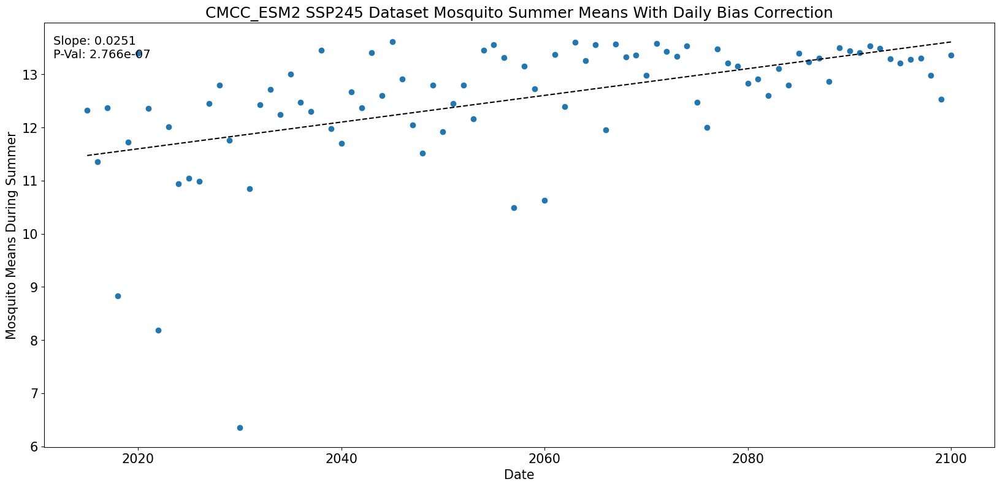

In [94]:
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Month']<9]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal[CMIP_Test_Results_Anomaly_Summer_Seasonal['Month']>5]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.groupby(['Year']).mean()
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.reset_index()
SummerMeansDF['Year']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']
SummerMeansDF['Mosq Predict CMCC_ESM2 SSP245']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']

plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'])
plt.title('CMCC_ESM2 SSP245 Dataset Mosquito Summer Means With Daily Bias Correction')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Date')

trend = np.polyfit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'], 1)
fit = np.poly1d(trend)
plt.plot(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'], fit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']), "r--", color='black')
slope = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).slope
pval = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).pvalue
text = f"Slope: {slope:.4f}\nP-Val: {pval:.3e}"
plt.text(0.01, 0.97, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')
plt.show()

In [95]:
##########################  CMCC_ESM2 585

In [96]:
CMIPValues_CMCC_ESM2_585['Timeskip'] = CMIPValues_CMCC_ESM2_585['Date'].diff().dt.total_seconds()
CMIPValues_CMCC_ESM2_585['Timeskip'].fillna(CMIPValues_CMCC_ESM2_585['Timeskip'][1], inplace=True)

DaylightExtract = copy.deepcopy(ObservedDataset)
DaylightExtract['Year'] = DaylightExtract['Date'].dt.year
DaylightExtract['Month'] = DaylightExtract['Date'].dt.month
DaylightExtract['Day'] = DaylightExtract['Date'].dt.day

Daylight = DaylightExtract.groupby('Month').mean().reset_index()
Daylight = Daylight.drop(columns=[ 'Moving Daylight', '# of Mosquitoes', '# of Mosquitoes Rolling', 'Total Rain (mm)', 'Total Precip (mm)',
       'Moving Mean Temp', 'Moving Total Precip', 'Moving Total Rain', 'LAI', 'Moving LAI', 'Outflow (m^3/s)','Moving Outflow (m^3/s)', 'SM',
       'Moving SM', 'Mean Temp', 'Year','Date', 'Day'])
CMIPValues_CMCC_ESM2_585=pd.merge(CMIPValues_CMCC_ESM2_585,Daylight,how='left',left_on=['Month'],right_on=['Month'])
CMIPValues_CMCC_ESM2_585_1=CMIPValues_CMCC_ESM2_585.drop(columns=['Unnamed: 0'])
CMIPValues_CMCC_ESM2_585_1['Week'] = CMIPValues_CMCC_ESM2_585_1['Date'].dt.isocalendar().week

CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CMCC_ESM2_585)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
ratio_cols = ['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM']
CMIP_Anomaly_Daily_Ratio_Finalized.rename(columns={col: f"{col}_ratio" for col in ratio_cols}, inplace=True)

combined_df =pd.merge(CMIPValues_CMCC_ESM2_585_1, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
combined_df=combined_df.sort_values(by='Date')
combined_df['Corrected_LAI'] = combined_df['LAI'] * abs(combined_df['LAI_ratio'])
combined_df['Corrected_Surface Temp'] = combined_df['Surface Temp'] + combined_df['Surface Temp_ratio']
combined_df['Corrected_Precip'] = combined_df['Precip'] * abs(combined_df['Precip_ratio'])
combined_df['Corrected_Runoff'] = combined_df['Runoff'] * abs(combined_df['Runoff_ratio'])
combined_df['Corrected_SM'] = combined_df['SM'] * abs(combined_df['SM_ratio'])

window_size = 7
for col_name in ['Corrected_LAI','Corrected_Surface Temp', 'Corrected_Precip', 'Corrected_Runoff','Corrected_SM']:
    calc_rolling_mean(combined_df, col_name, window_size)

181/181 [==============================] - 2s 11ms/step


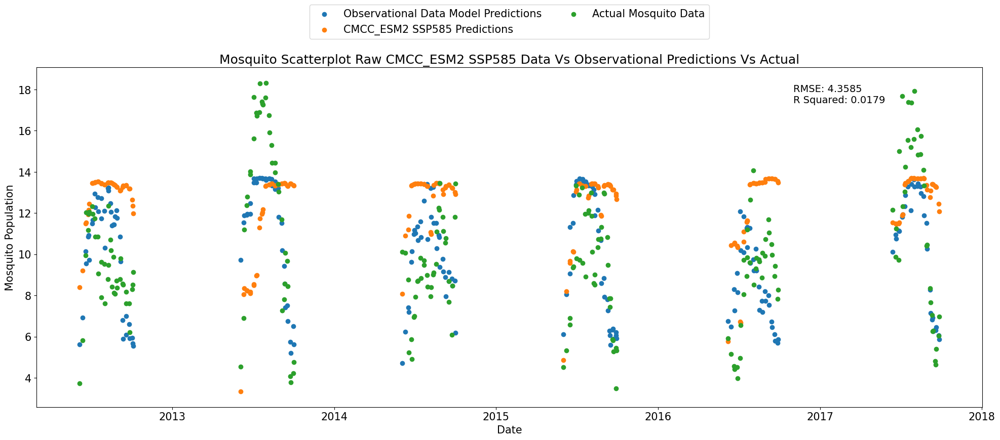

In [97]:
Yobserved=ObservedDataset.iloc[:,4:5]
xtestset = combined_df.iloc[18980:, [17, 31, 32, 30, 33, 34, 16]]
ytestset = ObservedDataset.iloc[:, 4:5]
look_back = 60
xtest = np.array([xtestset.iloc[i-look_back:i, :] for i in range(look_back, 5840)])
ytest = np.array([ytestset.iloc[i, 0] for i in range(look_back, 3435)])
xtest = xtest.astype('float32')
ytest = ytest.astype('float32')

cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']
key_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Corrected_Surface Temp': 'Moving Mean Temp', 'Moving Corrected_Precip': 'Moving Total Precip',
        'Moving Corrected_LAI': 'Moving LAI', 'Moving Corrected_Runoff': 'Moving Outflow (m^3/s)', 'Moving Corrected_SM': 'Moving SM',
        'Timeskip': 'Timeskip'}
for i, feature in enumerate(cols):
    mapped_feature = key_mapping.get(feature, feature)
    xtest[:,:,i] = (xtest[:,:,i] - feature_means[mapped_feature]) / feature_stds[mapped_feature]

CMIPprediction=regressor.predict(xtest)

CMIP_Test_Results = pd.DataFrame({'CMIP Mosq Predict Std Scale': CMIPprediction.reshape(-1)})
CMIP_Test_Results['Date']=pd.to_datetime(CMIPValues_CMCC_ESM2_585_1[['Year', 'Month', 'Day']][19039:24820]).reset_index(drop=True)
ObservedMosqValues = pd.DataFrame({'St Scale Mosq Actual': Yobserved.values.reshape(-1),'Date': ObservedDataset['Date']})

merged_df_CMCC_ESM2_SSP585 = pd.merge(CMIP_Test_Results,ObservedMosqValues,how='right',on='Date')
merged_df_CMCC_ESM2_SSP585['CMIP Mosq Predict'] = merged_df_CMCC_ESM2_SSP585['CMIP Mosq Predict Std Scale']
merged_df_CMCC_ESM2_SSP585['Mosq Actual'] = merged_df_CMCC_ESM2_SSP585['St Scale Mosq Actual'] 
merged_df_CMCC_ESM2_SSP585.dropna(inplace=True)
merged_df_CMCC_ESM2_SSP585 = merged_df_CMCC_ESM2_SSP585[merged_df_CMCC_ESM2_SSP585['Mosq Actual'] > 0]
merged_df_CMCC_ESM2_SSP585.reset_index(inplace=True, drop=True)

CMIPvsObsPredict_CMCC_ESM2_SSP585=pd.merge(TestNo0,merged_df_CMCC_ESM2_SSP585,how='left',left_on=['Date'],right_on=['Date'])
plt.close('all')
CMIPvsObsPredict_CMCC_ESM2_SSP585=CMIPvsObsPredict_CMCC_ESM2_SSP585.dropna()

mse = mean_squared_error(CMIPvsObsPredict_CMCC_ESM2_SSP585['Mosq Actual'], CMIPvsObsPredict_CMCC_ESM2_SSP585['CMIP Mosq Predict'])
rmse = np.sqrt(mse)
corr_matrix = np.corrcoef(CMIPvsObsPredict_CMCC_ESM2_SSP585['Mosq Actual'], CMIPvsObsPredict_CMCC_ESM2_SSP585['CMIP Mosq Predict'])
corr = corr_matrix[0,1]
r_sq = corr**2

text = f"RMSE: {rmse:.4f}\nR Squared: {r_sq:.4f}"
plt.text(0.80, 0.95, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')

plt.scatter(CMIPvsObsPredict_CMCC_ESM2_SSP585['Date'],CMIPvsObsPredict_CMCC_ESM2_SSP585['Mosquito Predictions'],label='Observational Data Model Predictions')
plt.scatter(CMIPvsObsPredict_CMCC_ESM2_SSP585['Date'],CMIPvsObsPredict_CMCC_ESM2_SSP585['CMIP Mosq Predict'],label='CMCC_ESM2 SSP585 Predictions')
plt.scatter(CMIPvsObsPredict_CMCC_ESM2_SSP585['Date'],CMIPvsObsPredict_CMCC_ESM2_SSP585['Mosq Actual'],label='Actual Mosquito Data')
plt.title('Mosquito Scatterplot Raw CMCC_ESM2 SSP585 Data Vs Observational Predictions Vs Actual')
plt.ylabel('Mosquito Population')
plt.xlabel('Date')
plt.legend(loc="upper center", bbox_to_anchor=(0.5, 1.2), ncol=2)
plt.tight_layout()
plt.show()

In [98]:
CMIPAnomlyvalues=copy.deepcopy(CMIPValues_CMCC_ESM2_585)
CMIPAnomaly_2015_2100 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2015) & (CMIPAnomlyvalues['Year'] <= 2100)]
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]
CMIPAnomaly_2005_2014 = CMIPAnomlyvalues.loc[(CMIPAnomlyvalues['Year'] >= 2005) & (CMIPAnomlyvalues['Year'] <= 2014)]
ObservedPeriod_2005_2014 = AnomalyCalcObservedPeriod.loc[(AnomalyCalcObservedPeriod['Year'] >= 2005)]
CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014[['LAI', 'Surface Temp', 'Precip', 'Runoff', 'SM', 'Date', 'Year', 'Month', 'Day']]

ObservedPeriod_2005_2014=ObservedPeriod_2005_2014.reset_index(drop=True)
CMIPAnomaly_2005_2014_Daily=CMIPAnomaly_2005_2014_Daily.reset_index(drop=True)
ObservedPeriod_2005_2014 = ObservedPeriod_2005_2014.groupby(['Month', 'Day']).mean().reset_index()

CMIPAnomaly_2005_2014_Daily = CMIPAnomaly_2005_2014_Daily.groupby(['Month', 'Day']).mean().reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized = pd.DataFrame()
CMIP_Anomaly_Daily_Ratio_Finalized['LAI'] = ObservedPeriod_2005_2014['LAI'] / abs(CMIPAnomaly_2005_2014_Daily['LAI'])
CMIP_Anomaly_Daily_Ratio_Finalized['Surface Temp'] = (CMIPAnomaly_2005_2014_Daily['Surface Temp']) - ObservedPeriod_2005_2014['Mean Temp']
CMIP_Anomaly_Daily_Ratio_Finalized['Precip'] = ObservedPeriod_2005_2014['Total Precip (mm)'] / abs(CMIPAnomaly_2005_2014_Daily['Precip'])
CMIP_Anomaly_Daily_Ratio_Finalized['Runoff'] = ObservedPeriod_2005_2014['Outflow (m^3/s)'] / abs(CMIPAnomaly_2005_2014_Daily['Runoff'])
CMIP_Anomaly_Daily_Ratio_Finalized['SM'] = ObservedPeriod_2005_2014['SM'] / abs(CMIPAnomaly_2005_2014_Daily['SM'])
CMIP_Anomaly_Daily_Ratio_Finalized['Date'] = AnomalyCalcObservedPeriod[4745 - 365:4745]['Date'].reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized.set_index('Date', inplace=True)

CMIP_Anomaly_Daily_Ratio_Finalized = CMIP_Anomaly_Daily_Ratio_Finalized.resample('W').mean().reset_index()
CMIPAnomaly_2015_2100_Daily = CMIPAnomaly_2015_2100_Daily.reset_index(drop=True)
CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index()
CMIP_Anomaly_Daily_Ratio_Finalized['Week']=CMIP_Anomaly_Daily_Ratio_Finalized.reset_index().drop(columns=['Date'])['index']+1
CMIPAnomaly_2015_2100_Daily['Week'] = CMIPAnomaly_2015_2100_Daily['Date'].dt.isocalendar().week

CMIP_Anomaly_Daily_Ratio_Finalized=CMIP_Anomaly_Daily_Ratio_Finalized.drop(columns=['index','Date'])
CombinedDailyFinalized=pd.merge(CMIPAnomaly_2015_2100_Daily, CMIP_Anomaly_Daily_Ratio_Finalized, on='Week', how='inner',suffixes=('_cmip', '_ratio'))
CombinedDailyFinalized=CombinedDailyFinalized.sort_values(by='Date')
CMIP_Test_Results_Anomaly_Daily_Dataset=pd.DataFrame()

CMIP_Test_Results_Anomaly_Daily_Dataset['LAI']=CombinedDailyFinalized['LAI_cmip']*abs(CombinedDailyFinalized['LAI_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Surface Temp']=CombinedDailyFinalized['Surface Temp_cmip']+(CombinedDailyFinalized['Surface Temp_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Precip']=CombinedDailyFinalized['Precip_cmip']*abs(CombinedDailyFinalized['Precip_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Runoff']=CombinedDailyFinalized['Runoff_cmip']*abs(CombinedDailyFinalized['Runoff_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['SM']=CombinedDailyFinalized['SM_cmip']*abs(CombinedDailyFinalized['SM_ratio'])
CMIP_Test_Results_Anomaly_Daily_Dataset['Date']=CombinedDailyFinalized['Date']
CMIP_Test_Results_Anomaly_Daily_Dataset['Day']=CombinedDailyFinalized['Date'].dt.day
CMIP_Test_Results_Anomaly_Daily_Dataset['Month']=CombinedDailyFinalized['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily_Dataset['Year']=CombinedDailyFinalized['Date'].dt.year

window_size = 7
for col_name in ['Surface Temp', 'Runoff', 'SM', 'Precip', 'LAI']:
    calc_rolling_mean(CMIP_Test_Results_Anomaly_Daily_Dataset, col_name, window_size)
CMIP_Test_Results_Anomaly_Daily_Dataset['Timeskip'] = 86400.0
Daylight=Daylight.drop(columns=['Timeskip'])
CMIP_Test_Results_Anomaly_Daily_Dataset = pd.merge(CMIP_Test_Results_Anomaly_Daily_Dataset, Daylight, how='left', left_on=['Month'], right_on=['Month'])

cols = ['Daylight_s', 'Moving Surface Temp', 'Moving Precip', 'Moving LAI', 'Moving Runoff', 'Moving SM', 'Timeskip']
xtestset = CMIP_Test_Results_Anomaly_Daily_Dataset[cols]

num_rows = xtestset.shape[0]
look_back = 60
num_windows = num_rows - look_back
x_test_3d = np.empty((num_windows, look_back, 7))

for i in range(num_windows):
    x_test_3d[i] = xtestset.iloc[i:i+look_back].values
feature_mapping = {'Daylight_s': 'Moving Daylight', 'Moving Surface Temp': 'Moving Mean Temp', 'Moving Precip': 'Moving Total Precip',
    'Moving LAI': 'Moving LAI', 'Moving Runoff': 'Moving Outflow (m^3/s)', 'Moving SM': 'Moving SM', 'Timeskip': 'Timeskip'}

for i, feature in enumerate(cols):
    corresponding_feature = feature_mapping.get(feature, feature) 
    x_test_3d[:,:,i] = (x_test_3d[:,:,i] - feature_means[corresponding_feature]) / feature_stds[corresponding_feature]

CMIP_prediction_Anomaly_Daily = pd.DataFrame(regressor.predict(x_test_3d))
CMIP_Test_Results_Anomaly_Daily = pd.DataFrame({'Normalized Mosq Predict': CMIP_prediction_Anomaly_Daily[0]})
CMIP_Test_Results_Anomaly_Daily['Mosq Predict'] = CMIP_Test_Results_Anomaly_Daily['Normalized Mosq Predict'] 

CMIP_Future_Dates = CMIP_Test_Results_Anomaly_Daily_Dataset['Date'][60:31390].reset_index()
CMIP_Test_Results_Anomaly_Daily_Date = CMIP_Future_Dates.copy()
CMIP_Test_Results_Anomaly_Daily['Date'] = CMIP_Test_Results_Anomaly_Daily_Date['Date']
CMIP_Test_Results_Anomaly_Daily['Year'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.year
CMIP_Test_Results_Anomaly_Daily['Month'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.month
CMIP_Test_Results_Anomaly_Daily['Day'] = CMIP_Test_Results_Anomaly_Daily_Date['Date'].dt.day

980/980 [==============================] - 8s 8ms/step


In [99]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,0.0,0.0,2015-03-02 12:00:00,2015,3,2
1,0.0,0.0,2015-03-03 12:00:00,2015,3,3
2,0.0,0.0,2015-03-04 12:00:00,2015,3,4
3,0.0,0.0,2015-03-05 12:00:00,2015,3,5
4,0.0,0.0,2015-03-06 12:00:00,2015,3,6
...,...,...,...,...,...,...
31325,0.0,0.0,2100-12-27 12:00:00,2100,12,27
31326,0.0,0.0,2100-12-28 12:00:00,2100,12,28
31327,0.0,0.0,2100-12-29 12:00:00,2100,12,29
31328,0.0,0.0,2100-12-30 12:00:00,2100,12,30


In [100]:
CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Mosq Predict']<0]

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day


In [101]:
CMIP_Test_Results_Anomaly_Daily = CMIP_Test_Results_Anomaly_Daily[(CMIP_Test_Results_Anomaly_Daily['Month'] > 4) & (CMIP_Test_Results_Anomaly_Daily['Month'] < 11)].reset_index(drop=True)

CMIP_Test_Results_Anomaly_Daily=CMIP_Test_Results_Anomaly_Daily.reset_index(drop=True)

In [102]:
CMIP_Test_Results_Anomaly_Daily

,Normalized Mosq Predict,Mosq Predict,Date,Year,Month,Day
0,1.723237,1.723237,2015-05-01 12:00:00,2015,5,1
1,1.809596,1.809596,2015-05-02 12:00:00,2015,5,2
2,1.952367,1.952367,2015-05-03 12:00:00,2015,5,3
3,2.157325,2.157325,2015-05-04 12:00:00,2015,5,4
4,2.528512,2.528512,2015-05-05 12:00:00,2015,5,5
...,...,...,...,...,...,...
15819,8.520540,8.520540,2100-10-27 12:00:00,2100,10,27
15820,8.536797,8.536797,2100-10-28 12:00:00,2100,10,28
15821,8.449469,8.449469,2100-10-29 12:00:00,2100,10,29
15822,8.320348,8.320348,2100-10-30 12:00:00,2100,10,30


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


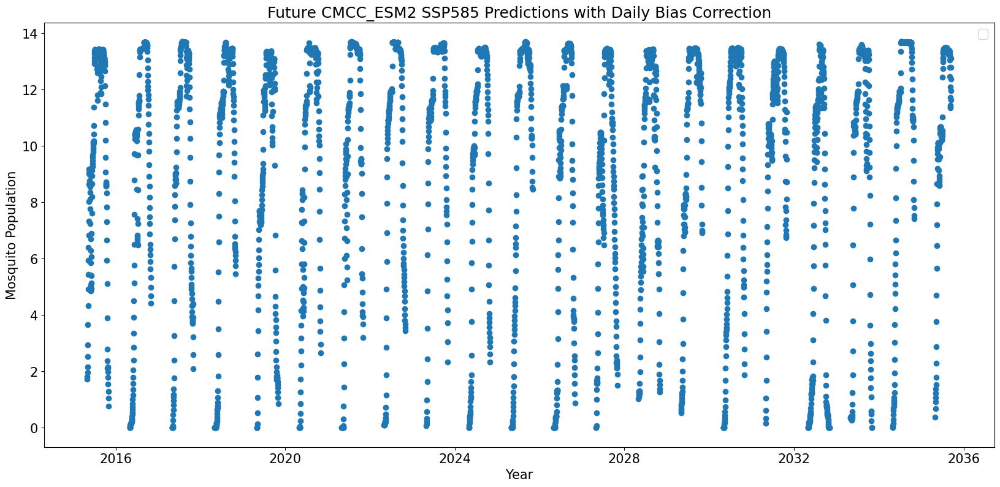

In [103]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'][0:3818],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'][0:3818])
plt.title('Future CMCC_ESM2 SSP585 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


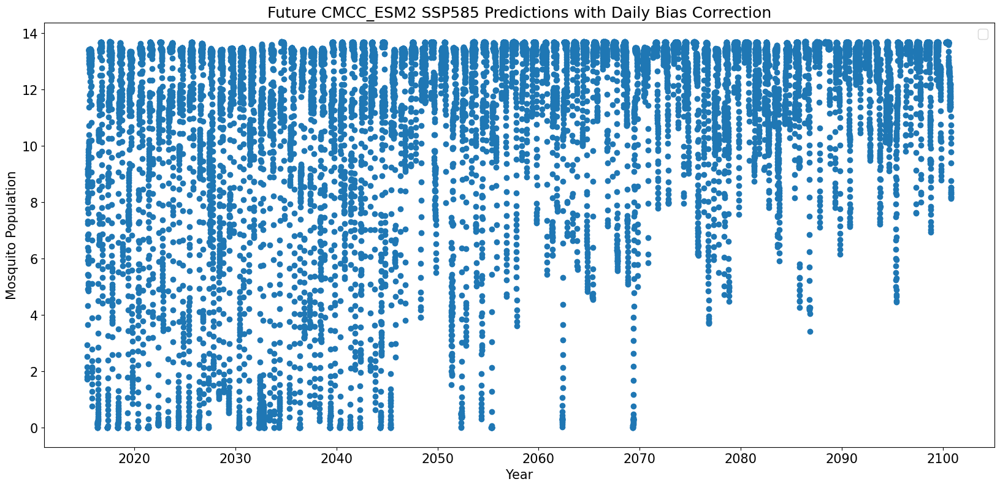

In [104]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Daily['Date'],CMIP_Test_Results_Anomaly_Daily['Mosq Predict'])
plt.title('Future CMCC_ESM2 SSP585 Predictions with Daily Bias Correction')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


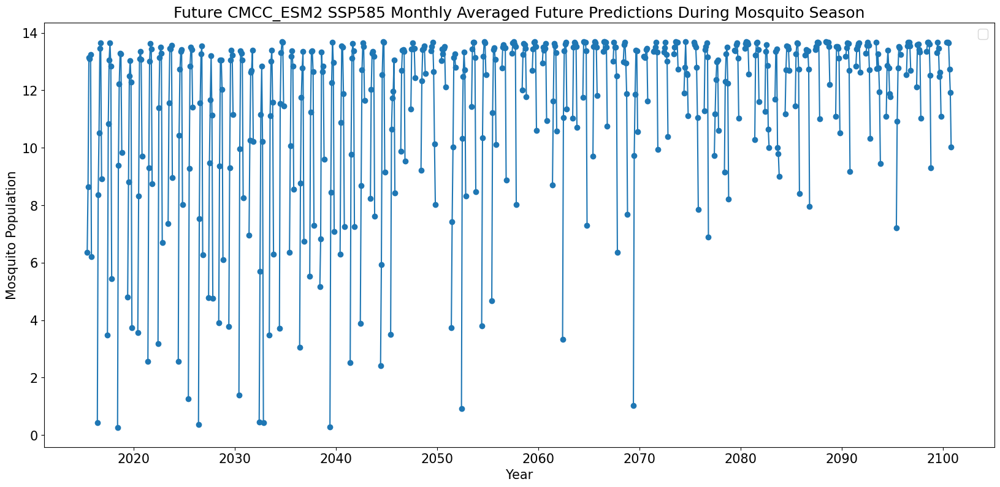

In [105]:
plt.rcParams["figure.figsize"] = (20,9)
plt.close('all')

CMIP_Test_Results_Anomaly_Daily['Date'] = pd.to_datetime(CMIP_Test_Results_Anomaly_Daily['Date'])
CMIP_Test_Results_Anomaly_Daily.set_index('Date', inplace=True)
monthly_means = CMIP_Test_Results_Anomaly_Daily['Mosq Predict'].resample('M').mean()

plt.plot(monthly_means.index, monthly_means.values, marker='o')
plt.title('Future CMCC_ESM2 SSP585 Monthly Averaged Future Predictions During Mosquito Season')
plt.ylabel('Mosquito Population')
plt.xlabel('Year')
plt.legend()
plt.show()

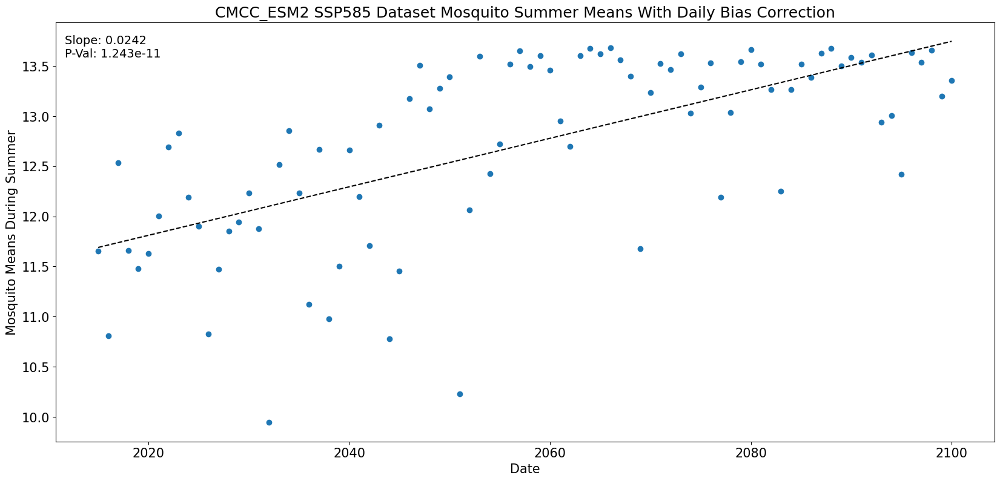

In [106]:
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Daily[CMIP_Test_Results_Anomaly_Daily['Month']<9]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal[CMIP_Test_Results_Anomaly_Summer_Seasonal['Month']>5]
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.groupby(['Year']).mean()
CMIP_Test_Results_Anomaly_Summer_Seasonal=CMIP_Test_Results_Anomaly_Summer_Seasonal.reset_index()
SummerMeansDF['Year']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']
SummerMeansDF['Mosq Predict CMCC_ESM2 SSP585']=CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']

plt.close('all')
plt.scatter(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'])
plt.title('CMCC_ESM2 SSP585 Dataset Mosquito Summer Means With Daily Bias Correction')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Date')

trend = np.polyfit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict'], 1)
fit = np.poly1d(trend)
plt.plot(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'], fit(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year']), "r--", color='black')
slope = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).slope
pval = linregress(CMIP_Test_Results_Anomaly_Summer_Seasonal['Year'],CMIP_Test_Results_Anomaly_Summer_Seasonal['Mosq Predict']).pvalue
text = f"Slope: {slope:.4f}\nP-Val: {pval:.3e}"
plt.text(0.01, 0.97, text, transform=plt.gca().transAxes, fontsize=14, verticalalignment='top')
plt.show()

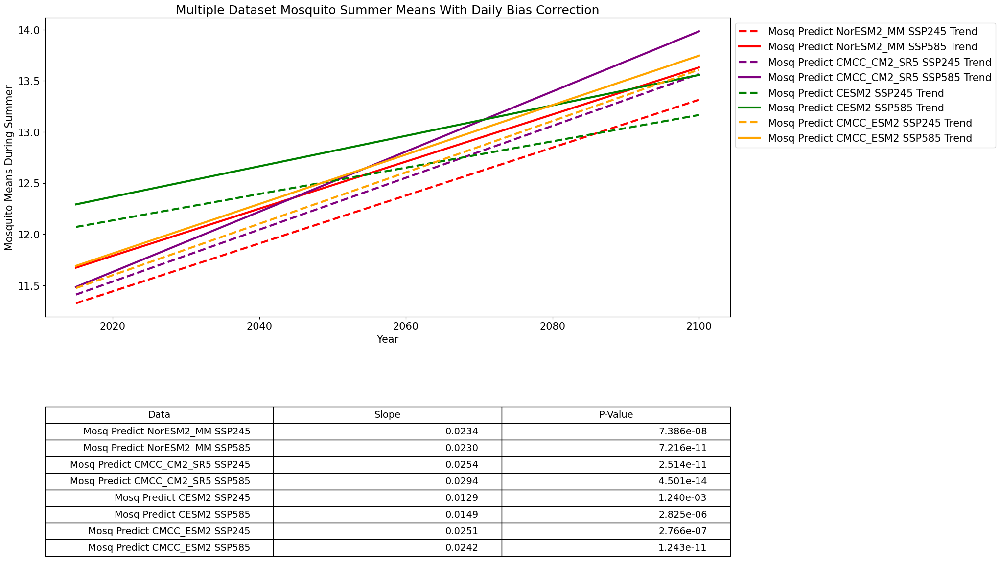

In [107]:
table_data = []
plt.close('all')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Year')

color_map = {'NorESM2_MM': 'red', 'CMCC_ESM2': 'orange', 'CESM2': 'green', 'CMCC_CM2_SR5':'purple'}

# plotting the trendline of the annual future mosquito prediction scatterplots
for column in SummerMeansDF.columns:
    if column != 'Year':
        data_for_column = SummerMeansDF[[column, 'Year']].dropna()
        color = None
        linestyle = '-'
        for model in color_map:
            if model in column:
                color = color_map[model]
                break
        if '245' in column:
            linestyle = '--'
        trend = np.polyfit(data_for_column['Year'], data_for_column[column], 1)
        fit = np.poly1d(trend)
        plt.plot(data_for_column['Year'], fit(data_for_column['Year']), label=f"{column} Trend", color=color, linewidth=3, linestyle=linestyle)
        slope, _, _, pval, _ = linregress(data_for_column['Year'], data_for_column[column])
        table_data.append([column, f"{slope:.4f}", f"{pval:.3e}"])
        
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
the_table = plt.table(cellText=table_data, colLabels=['Data', 'Slope', 'P-Value'], loc='bottom', bbox=[0.0, -0.8, 1.0, 0.5])

cellDict = the_table.get_celld()
for i in range(0,len(table_data)+1):
    cellDict[(i,0)].set_height(0.2)
    cellDict[(i,1)].set_height(0.2)
    cellDict[(i,2)].set_height(0.2)

plt.subplots_adjust(left=0.2, bottom=0.2)
plt.title('Multiple Dataset Mosquito Summer Means With Daily Bias Correction')
plt.show()

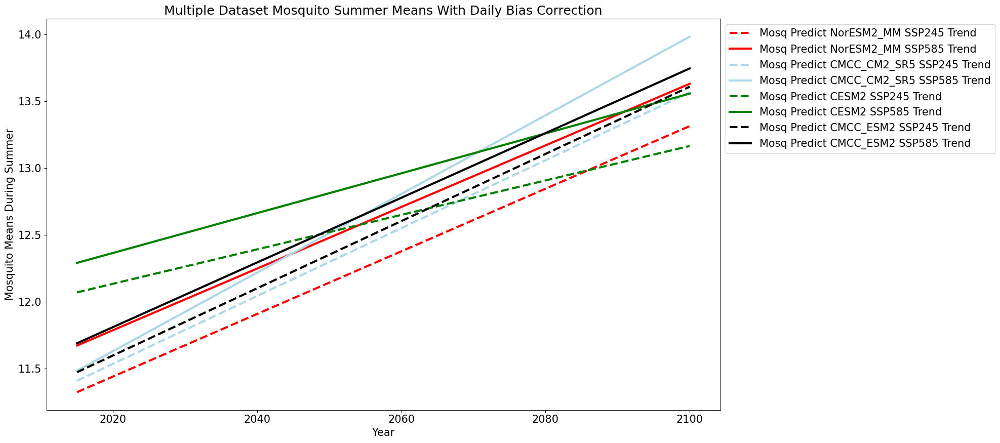

In [108]:
table_data = []
plt.close('all')

color_map = {'NorESM2_MM': 'red', 'CMCC_ESM2': 'orange', 'CESM2': 'green', 'CMCC_CM2_SR5':'purple'}
# plotting the trendline of the annual future mosquito prediction scatterplots
for column in SummerMeansDF.columns:
    if column != 'Year':
        data_for_column = SummerMeansDF[[column, 'Year']].dropna()
        color = None
        linestyle = '-'
        for model in color_map:
            if model in column:
                color = color_map[model]
                break
        if '245' in column:
            linestyle = '--'
        trend = np.polyfit(data_for_column['Year'], data_for_column[column], 1)
        fit = np.poly1d(trend)
        plt.plot(data_for_column['Year'], fit(data_for_column['Year']), label=f"{column} Trend", color=color, linewidth=3, linestyle=linestyle)
        slope, _, _, pval, _ = linregress(data_for_column['Year'], data_for_column[column])
        table_data.append([column, f"{slope:.4f}", f"{pval:.3e}"])

plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.title('Multiple Dataset Mosquito Summer Means With Daily Bias Correction')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Year')
plt.tight_layout()
plt.show()

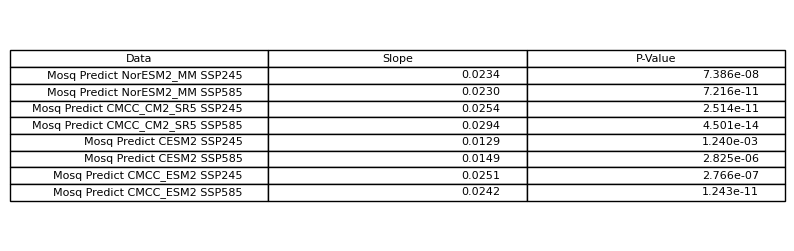

In [109]:
plt.figure(figsize=(10, 3))
ax = plt.gca()
ax.axis('off')
the_table = plt.table(cellText=table_data, colLabels=['Data', 'Slope', 'P-Value'], loc='center')
plt.show()

Text(0.5, 0, 'Year')

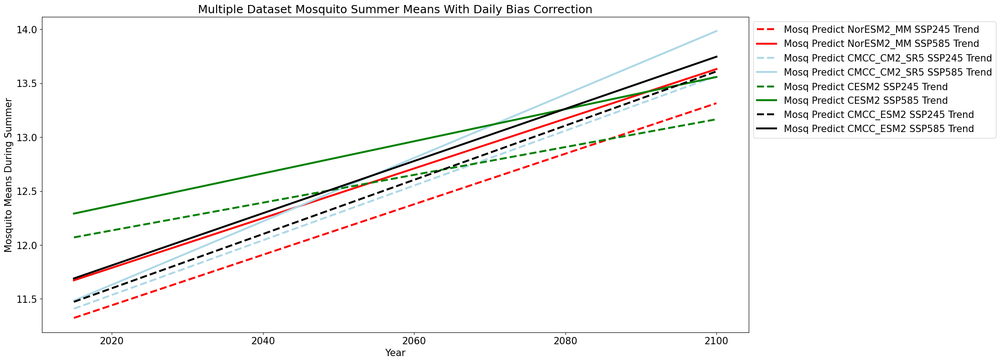

In [110]:
table_data = []
plt.close('all')

color_map = {'NorESM2_MM': 'red', 'CMCC_ESM2': 'orange', 'CESM2': 'green', 'CMCC_CM2_SR5':'purple'}
# plotting the trendline of the annual future mosquito prediction scatterplots
for column in SummerMeansDF.columns:
    if column != 'Year':
        data_for_column = SummerMeansDF[[column, 'Year']].dropna()
        color = None
        linestyle = '-'
        for model in color_map:
            if model in column:
                color = color_map[model]
                break
        if '245' in column:
            linestyle = '--'
        trend = np.polyfit(data_for_column['Year'], data_for_column[column], 1)
        fit = np.poly1d(trend)
        
        # trying to calculate the percent change baesd on trendline
        start_year = data_for_column['Year'].iloc[0]
        end_year = data_for_column['Year'].iloc[-1]
        start_value = fit(start_year)
        end_value = fit(end_year)
        percentage_change = ((end_value - start_value) / start_value) * 100

        slope, _, _, pval, _ = linregress(data_for_column['Year'], data_for_column[column])
        table_data.append([column, f"{slope:.4f}", f"{pval:.3e}", f"{percentage_change:.2f}%"])
        plt.plot(data_for_column['Year'], fit(data_for_column['Year']), label=f"{column} Trend", color=color, linewidth=3, linestyle=linestyle)

plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

plt.title('Multiple Dataset Mosquito Summer Means With Daily Bias Correction')
plt.ylabel('Mosquito Means During Summer')
plt.xlabel('Year')



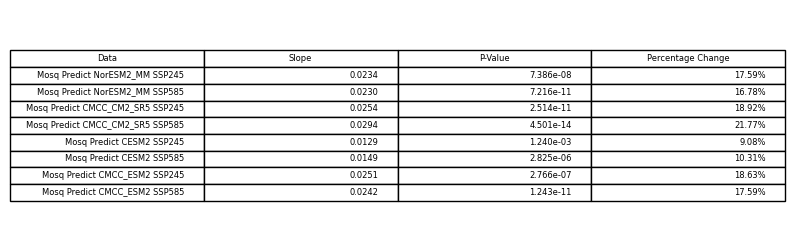

In [112]:
plt.figure(figsize=(10, 3))
ax = plt.gca()
ax.axis('off')
the_table = plt.table(cellText=table_data, colLabels=['Data', 'Slope', 'P-Value', 'Percentage Change'], loc='center')
# this version has the percentage cahnge
plt.show()

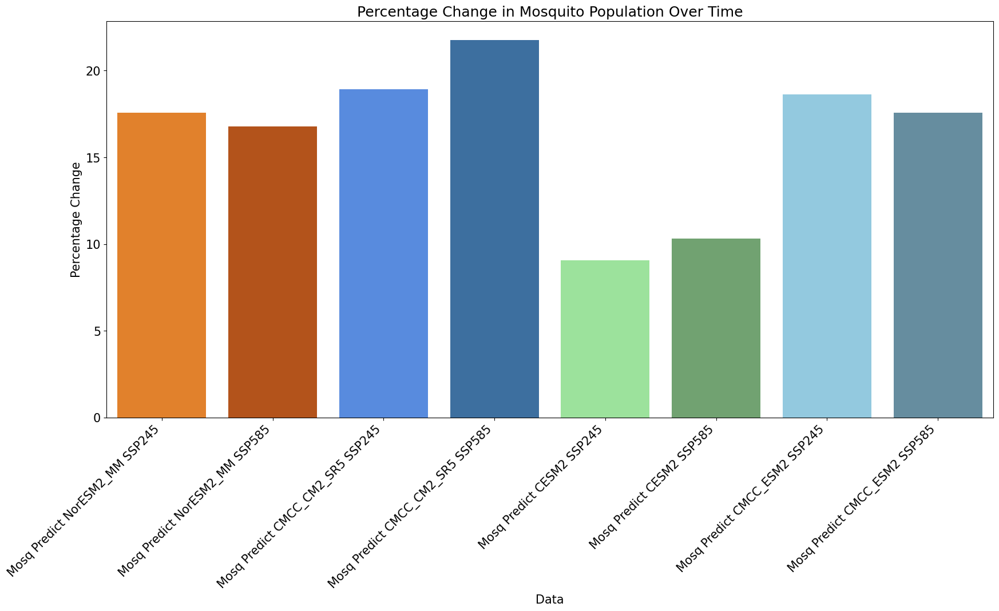

<Figure size 1000x600 with 0 Axes>

In [114]:
data_labels = []
percent_change_data = []
# putting the percentage cahnge from the table into a dataframe
for row in table_data:
  data_labels.append(row[0]) 
  percent_change = float(row[3].split('%')[0]) 
  percent_change_data.append(percent_change)
Table_df= pd.DataFrame({'Data': data_labels, 'Percentage Change': percent_change_data})

# setting up the colors properly for the bar plot
plt.close('all')
color_map = {
    'Mosq Predict NorESM2_MM SSP245': '#ff7f0e', 'Mosq Predict NorESM2_MM SSP585': '#cc4c02', 'Mosq Predict CMCC_CM2_SR5 SSP245':'#4285f4',
    'Mosq Predict CMCC_CM2_SR5 SSP585':'#2d6faf','Mosq Predict CESM2 SSP245':'#90ee90','Mosq Predict CESM2 SSP585':'#69aa69',
    'Mosq Predict CMCC_ESM2 SSP245':'#87ceeb','Mosq Predict CMCC_ESM2 SSP585':'#5d90a8'}

#bar plot
sns.barplot(x = 'Data', y = 'Percentage Change', data = Table_df, hue='Data', palette=color_map)
plt.title('Percentage Change in Mosquito Population Over Time')
plt.xticks(rotation=45, ha='right')
plt.figure(figsize=(10, 6))
plt.show()

In [115]:
# grabbing the x data, y data for the integrated gradients
ActualObs.rename(columns={'Moving Daylight_s': 'Moving Daylight'}, inplace=True)
ActualObs.rename(columns={'Moving Total Precip (mm)': 'Moving Total Precip'}, inplace=True)
x_data = []
y_data = []
cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']

for _, row in ObservedDataset.iterrows():
    date = row['Date']
    mosquito_count = row['# of Mosquitoes Rolling']
    timeskip_value = row['Timeskip']
    start_date = date - pd.Timedelta(days=60)
    mask = (ActualObs['Date'] > start_date) & (ActualObs['Date'] <= date)
    subset_ActualObs = ActualObs[mask].copy()
    if len(subset_ActualObs) == 60:
        subset_ActualObs['Timeskip'] = timeskip_value
        subset_values = subset_ActualObs[cols].values
        x_data.append(subset_values)
        y_data.append(mosquito_count)

x_data = np.array(x_data)
y_data = np.array(y_data)
num_samples, sequence_length, num_features = x_data.shape

feature_means = {}
feature_stds = {}
for feature in cols:
    feature_idx = cols.index(feature)
    feature_values = x_data[:,:,feature_idx]
    
    feature_mean = feature_values.mean()
    feature_std = feature_values.std()
    feature_std = feature_std if feature_std != 0 else 1
    x_data[:,:,feature_idx] = (feature_values - feature_mean) / feature_std

    feature_means[feature] = feature_mean
    feature_stds[feature] = feature_std
feature_stats_df = pd.DataFrame({'Feature': feature_means.keys(), 'Mean': feature_means.values(), 'Standard Deviation': feature_stds.values()})

y_data_mean = y_data.mean()
y_data_std = y_data.std()
y_data_std = y_data_std if y_data_std != 0 else 1

xtrain = np.array(x_data[:2290]).astype('float32')
ytrain = np.array(y_data[:2290]).astype('float32')
xtest = np.array(x_data[2290:3435]).astype('float32')
ytest = np.array(y_data[2290:3435]).astype('float32')

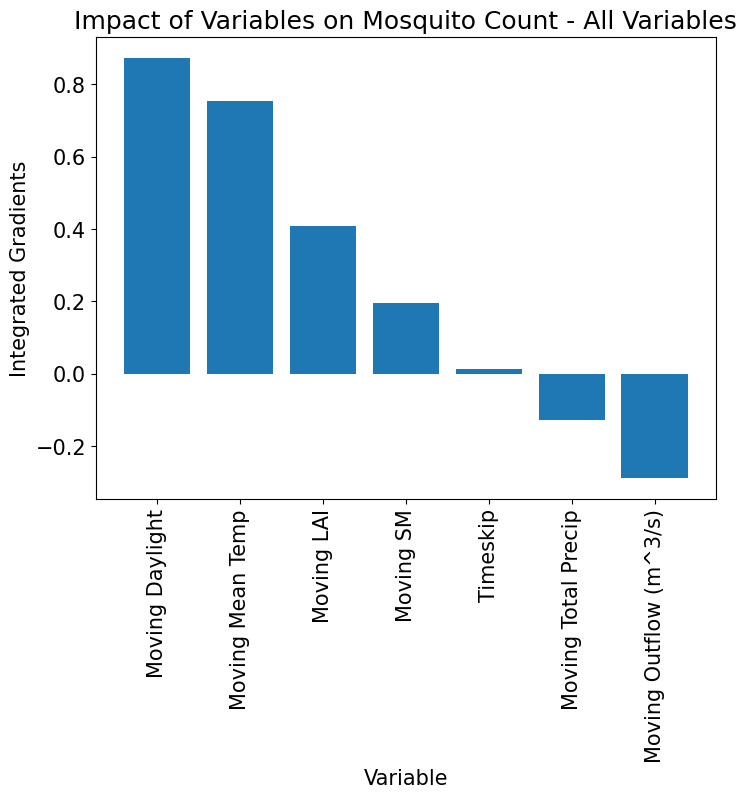

In [116]:
# https://keras.io/examples/vision/integrated_gradients/
# Getting the integrated gradient of each variable to assess the impact on the model - see how effective each one is

def integrated_gradients(model, input_data, baseline, steps):
    all_gradients = []
    # Breaking it up into steps and applying the ig similar tothe keras example
    each_step = [baseline + (step/steps) * (input_data - baseline) for step in range(steps+1)]
    for step_part in each_step:
        step_input_tensor = tf.convert_to_tensor(step_part)
        with tf.GradientTape() as tape:
            tape.watch(step_input_tensor)
            step_predictions = model(step_input_tensor)
        gradients = tape.gradient(step_predictions, step_input_tensor)
        all_gradients.append(gradients)
    avg_gradients = tf.reduce_mean(all_gradients, axis=0)
    integrated_grads = (input_data - baseline) * avg_gradients
    return integrated_grads

# Setting up the baseline and using the training dataset to see what the model is learning
baseline_input = np.zeros_like(xtrain)
integrated_gradients_result = integrated_gradients(regressor, xtrain, baseline_input, steps=25)
integrated_gradients_summed = np.sum(integrated_gradients_result, axis=1)
mean_values = np.mean(integrated_gradients_summed, axis=0)
mean_values = mean_values.flatten()
IGVariableDF = pd.DataFrame({
    'Variable': cols,
    'IG All Variables': mean_values})

sorted_indices = np.argsort(mean_values)[::-1]
sorted_cols = np.array(cols)[sorted_indices]
sorted_mean_values = mean_values[sorted_indices]
plt.figure(figsize=(8, 6))
plt.bar(range(len(sorted_cols)), sorted_mean_values)
plt.xticks(range(len(sorted_cols)), sorted_cols, rotation='vertical')
plt.xlabel('Variable')
plt.ylabel('Integrated Gradients')
plt.title('Impact of Variables on Mosquito Count - All Variables')
plt.show()

In [117]:
# Now I'm trying to see how the model would look if we remove certain variables and abs val others. For certain variables, we set the value to 0
# as 0 means there is no impact of that variable. For temperature, it was set to the mean to effectively run the model.
def compute_IG_without_variable(model, x_train, removed_variable_idx, baseline, steps=10, cols=None, mean_temp=None):
    modified_x_train = x_train.copy()
    if cols[removed_variable_idx] == 'Moving Mean Temp' and mean_temp is not None:
        modified_x_train[:, :, removed_variable_idx] = mean_temp # Temp set to mean
    else:
        modified_x_train[:, :, removed_variable_idx] = 0
    integrated_gradients_result = integrated_gradients(
        model, modified_x_train, baseline, steps)
    integrated_gradients_summed = np.sum(integrated_gradients_result, axis=1)
    mean_values = np.mean(integrated_gradients_summed, axis=0)
    abs_mean_values = np.mean(np.abs(integrated_gradients_summed), axis=0) # aforementioned abs vals
    return mean_values, abs_mean_values

cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip', 'Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM', 'Timeskip']
baseline_input = np.zeros_like(xtrain) 
IG_dfs = {}
# computing using xtrain as that is the dataset the model learns from
mean_temp = np.mean(xtrain[:, :, cols.index('Moving Mean Temp')])
for i in range(xtrain.shape[2]):
    mean_values, abs_mean_values = compute_IG_without_variable(regressor, xtrain, i, baseline_input, cols=cols, mean_temp=mean_temp)
    IG_df = pd.DataFrame({
        'Variable': cols,
        'IG values without {}'.format(cols[i]): mean_values,
        'Abs IG values without {}'.format(cols[i]): abs_mean_values})
    IG_dfs[cols[i]] = IG_df

In [118]:
combined_IG_df = IG_dfs[cols[0]]
for var_removed in cols[1:]:
    combined_IG_df = combined_IG_df.merge(IG_dfs[var_removed], on='Variable', how='outer')
combined_IG_df.at[1, 'IG values without Moving Mean Temp'] = 0.00
combined_IG_df.at[1, 'Abs IG values without Moving Mean Temp'] = 0.00

# Creating a color coded map of IG values. Blue means negative, red means positive. The black means the variable was removed.
def color_cells(val):
    if val == float(0):
        return 'background-color: black'
    elif isinstance(val, (int, float)):
        if val < 0:
            return 'background-color: lightblue'
        else:
            return 'background-color: #FFCCCC'
    return '' 
styled_df = combined_IG_df.style.applymap(color_cells)
styled_df

,Variable,IG values without Moving Daylight,Abs IG values without Moving Daylight,IG values without Moving Mean Temp,Abs IG values without Moving Mean Temp,IG values without Moving Total Precip,Abs IG values without Moving Total Precip,IG values without Moving LAI,Abs IG values without Moving LAI,IG values without Moving Outflow (m^3/s),Abs IG values without Moving Outflow (m^3/s),IG values without Moving SM,Abs IG values without Moving SM,IG values without Timeskip,Abs IG values without Timeskip
0,Moving Daylight,0.000000,0.000000,0.660311,0.660311,0.807622,0.807745,0.863549,0.863549,0.845192,0.847862,0.849931,0.850073,0.899703,0.899703
1,Moving Mean Temp,0.691248,0.691365,0.000000,0.000000,0.701859,0.702314,0.819232,0.823767,0.845954,0.846180,0.727144,0.727268,0.769340,0.769340
2,Moving Total Precip,-0.156176,0.159800,-0.118319,0.124464,0.000000,0.000000,-0.103739,0.116567,-0.108028,0.136324,-0.151066,0.178842,-0.124286,0.158421
3,Moving LAI,0.415146,0.416145,0.438976,0.444705,0.370143,0.379569,0.000000,0.000000,0.446263,0.449871,0.450985,0.471864,0.395355,0.399017
4,Moving Outflow (m^3/s),-0.346686,0.383709,-0.191622,0.238662,-0.263440,0.345226,-0.189906,0.240218,0.000000,0.000000,-0.238906,0.304740,-0.298895,0.355992
5,Moving SM,0.189840,0.196572,0.198162,0.207084,0.159665,0.181977,0.218757,0.245834,0.170778,0.225235,0.000000,0.000000,0.202715,0.226176
6,Timeskip,0.033798,0.067357,0.017627,0.051541,0.011421,0.039767,-0.008918,0.046076,-0.003012,0.031450,0.023466,0.046492,0.000000,0.000000


In [119]:
ActualObs.rename(columns={'Moving Daylight_s': 'Moving Daylight'}, inplace=True)
ActualObs.rename(columns={'Moving Total Precip (mm)': 'Moving Total Precip'}, inplace=True)
x_data = []
y_data = []
cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']

# Reprepping x data to get variation in mosquitos with changing variables
for _, row in ObservedDataset.iterrows():
    date = row['Date']
    mosquito_count = row['# of Mosquitoes Rolling']
    timeskip_value = row['Timeskip']
    start_date = date - pd.Timedelta(days=60)
    mask = (ActualObs['Date'] > start_date) & (ActualObs['Date'] <= date)
    subset_ActualObs = ActualObs[mask].copy()
    if len(subset_ActualObs) == 60:
        subset_ActualObs['Timeskip'] = timeskip_value
        subset_values = subset_ActualObs[cols].values
        x_data.append(subset_values)
        y_data.append(mosquito_count)

x_data = np.array(x_data)
y_data = np.array(y_data)
num_samples, sequence_length, num_features = x_data.shape

cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']
feature_names = []
feature_means = []
feature_stds = []
StartDate=ObservedDataset['Date'][0]-pd.Timedelta(days=60)
LastDate = ObservedDataset['Date'].tail(1).iloc[0]
mask = (ActualObs['Date'] >= StartDate) & (ActualObs['Date'] <= LastDate)
CutActualObs = ActualObs[mask].copy()
CutActualObs=CutActualObs.reset_index(drop=True)
cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']
MeansForVars={}
SDforVars={}
for feature in cols:
    MeansForVars[feature] = np.mean(CutActualObs[feature])
    SDforVars[feature] = np.std(CutActualObs[feature])
    
SDforVars = {k: (1 if v == 0 else v) for k, v in SDforVars.items()}

feature_means = {}
feature_stds = {}
for feature in cols:
    feature_idx = cols.index(feature)
    feature_values = x_data[:,:,feature_idx]
    feature_mean = feature_values.mean()
    feature_std = feature_values.std()
    feature_std = feature_std if feature_std != 0 else 1
    feature_means[feature] = feature_mean
    feature_stds[feature] = feature_std
feature_stats_df = pd.DataFrame({
    'Feature': feature_means.keys(),
    'Mean': feature_means.values(),
    'Standard Deviation': feature_stds.values()})
# Rerunning everything
xtrain = np.array(x_data[:2290]).astype('float32')
ytrain = np.array(y_data[:2290]).astype('float32')
xtest = np.array(x_data[2290:3435]).astype('float32')
ytest = np.array(y_data[2290:3435]).astype('float32')
results = {}

# Initially considered using scaled_SDforVars for normalizing variables but decided against for consistency
def scale_stddev(SDforVars, MeansForVars):
    return (SDforVars - MeansForVars)  / (SDforVars)
scaled_SDforVars = {}
for feature in cols:
    scaled_SDforVars[feature] = scale_stddev(SDforVars[feature], MeansForVars[feature])
    if feature == 'Timeskip':
        scaled_SDforVars[feature] = 1

# Using xtest in this portion
original_test_data = xtest.copy()

# Prepping code to increase/decrease one variable at a time. Only some of these were implemented in the figure
def get_feature_data(original_test_data, feature_to_keep):
    feature_data = original_test_data.copy()
    feature_data_inc_05 = original_test_data.copy()
    feature_data_dec_05 = original_test_data.copy()
    feature_data_inc_10 = original_test_data.copy()
    feature_data_dec_10 = original_test_data.copy()
    feature_data_inc_15 = original_test_data.copy()
    feature_data_dec_15 = original_test_data.copy()
    feature_data_inc_20 = original_test_data.copy()
    feature_data_dec_20 = original_test_data.copy()
    feature_data_inc_30 = original_test_data.copy()
    feature_data_dec_30 = original_test_data.copy()

    for i in range(original_test_data.shape[2]):
        # Incorporating the feature change in this portion - specific tothe feature
        if i == feature_to_keep:
            feature_data[:,:,i] = original_test_data[:,:,i]
            feature_data_inc_10[:,:,i] = original_test_data[:,:,i]+feature_stds[cols[i]] 
            feature_data_dec_10[:,:,i] = original_test_data[:,:,i]-feature_stds[cols[i]] 
            feature_data_inc_20[:,:,i] = original_test_data[:,:,i]+feature_stds[cols[i]]*2 
            feature_data_dec_20[:,:,i] = original_test_data[:,:,i]-feature_stds[cols[i]]*2 
            feature_data_inc_30[:,:,i] = original_test_data[:,:,i]+feature_stds[cols[i]]*3 
            feature_data_dec_30[:,:,i] = original_test_data[:,:,i]-feature_stds[cols[i]]*3 
    return feature_data_dec_30,feature_data_inc_30,feature_data_dec_20,feature_data_inc_20,feature_data,feature_data_inc_10,feature_data_dec_10

Evaluating model with variations of 'Moving Daylight':
36/36 [==============================] - 0s 12ms/step


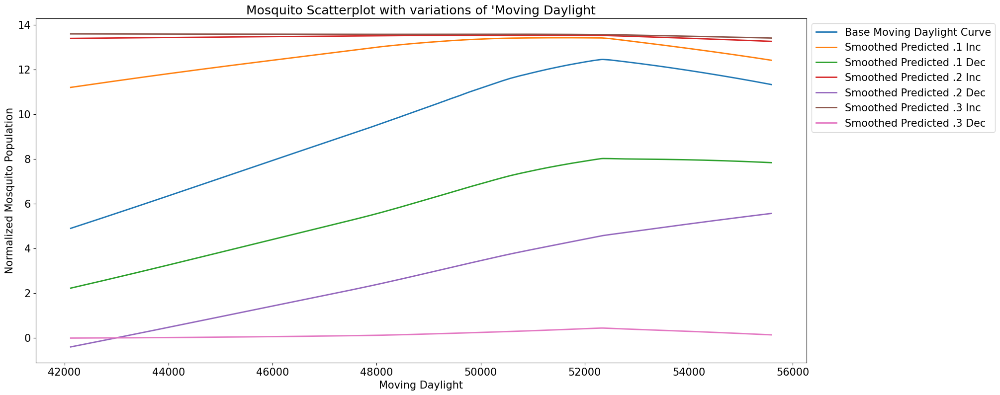

Evaluating model with variations of 'Moving Mean Temp':
36/36 [==============================] - 0s 7ms/step


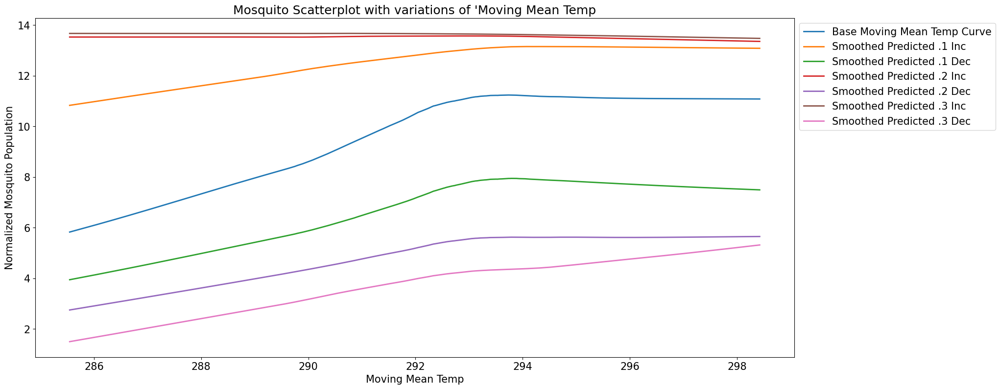

Evaluating model with variations of 'Moving Total Precip':
36/36 [==============================] - 0s 6ms/step


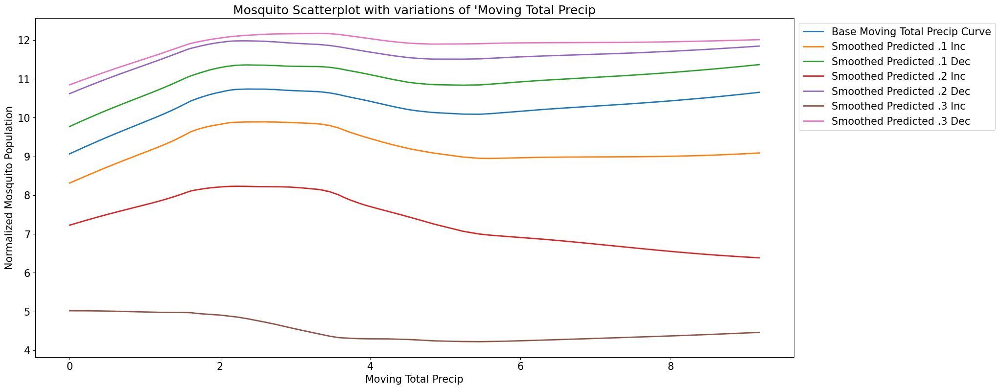

Evaluating model with variations of 'Moving LAI':
36/36 [==============================] - 0s 6ms/step


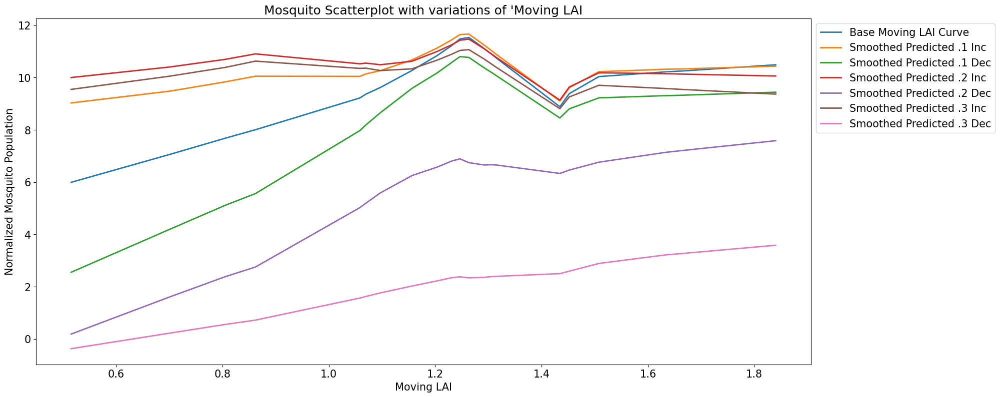

Evaluating model with variations of 'Moving Outflow (m^3/s)':
36/36 [==============================] - 0s 7ms/step


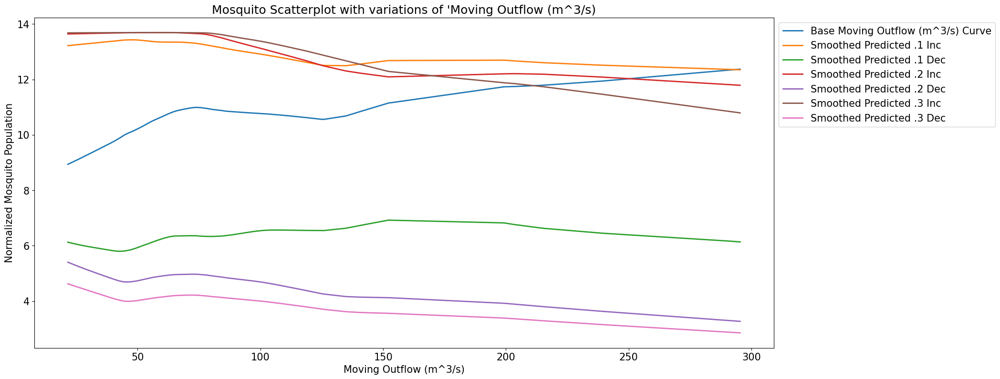

Evaluating model with variations of 'Moving SM':
36/36 [==============================] - 0s 6ms/step


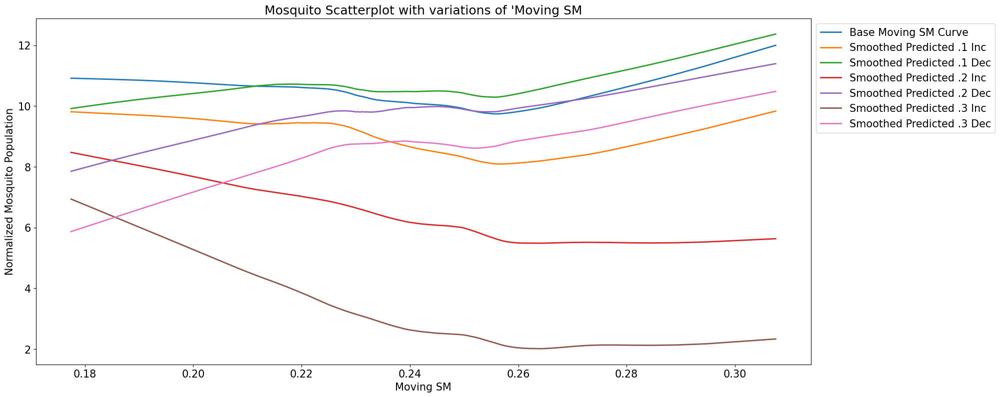

Evaluating model with variations of 'Timeskip':
36/36 [==============================] - 0s 6ms/step


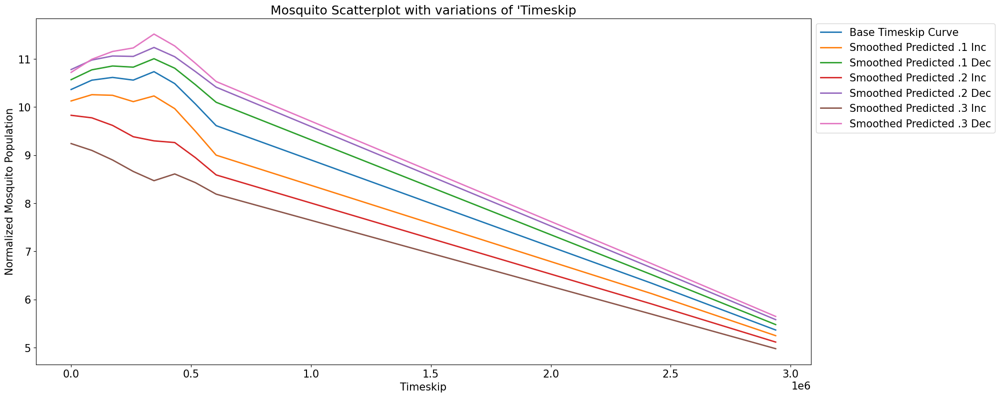

In [120]:
mean_values = np.array([feature_means[feature] for feature in cols])
std_values = np.array([feature_stds[feature] for feature in cols])
# Normalization will be implemented after changing the feature 
def normalize_features(*datasets):
    normalized_datasets = []
    for data in datasets:
        normalized_data = (data - mean_values) / std_values
        normalized_datasets.append(normalized_data)
    return normalized_datasets

# Plots of how the output would change throughout the test dataset under variations in feature variables. Feature value vs Mosquito simulated population
for i, feature in enumerate(cols):
    # Starting the feature changing - we can see what feature is being worked on at a time
    print(f"Evaluating model with variations of '{feature}':")
    feature_data_dec_30,feature_data_inc_30,feature_data_dec_20,feature_data_inc_20,feature_data,feature_data_inc_10,feature_data_dec_10 = get_feature_data(original_test_data, i)
    (feature_data_dec_30, feature_data_inc_30, feature_data_dec_20, feature_data_inc_20, feature_data, feature_data_inc_10, feature_data_dec_10) = normalize_features(
        feature_data_dec_30, feature_data_inc_30, feature_data_dec_20, feature_data_inc_20, feature_data, feature_data_inc_10, feature_data_dec_10)

    # Running the LSTM here and getting the data into a df
    ypred_avg = regressor.predict(feature_data)
    ypred_avg_inc_10 = regressor.predict(feature_data_inc_10)
    ypred_avg_dec_10 = regressor.predict(feature_data_dec_10)
    ypred_avg_inc_20 = regressor.predict(feature_data_inc_20)
    ypred_avg_dec_20 = regressor.predict(feature_data_dec_20)
    ypred_avg_inc_30 = regressor.predict(feature_data_inc_30)
    ypred_avg_dec_30 = regressor.predict(feature_data_dec_30)

    TestNo0 = pd.DataFrame()
    TestNo0['Actual Mosquito Data'] = ytest.flatten()
    TestNo0['Mosquito Predictions Average'] = ypred_avg.flatten()
    TestNo0['Mosquito Predictions .1 Inc'] = ypred_avg_inc_10.flatten()
    TestNo0['Mosquito Predictions .1 Dec'] = ypred_avg_dec_10.flatten()
    TestNo0['Mosquito Predictions .2 Inc'] = ypred_avg_inc_20.flatten()
    TestNo0['Mosquito Predictions .2 Dec'] = ypred_avg_dec_20.flatten()
    TestNo0['Mosquito Predictions .3 Inc'] = ypred_avg_inc_30.flatten()
    TestNo0['Mosquito Predictions .3 Dec'] = ypred_avg_dec_30.flatten()

    # Matching the appropriate timeframe. Also, observational data is set up as the specific feature data.
    TestNo0['Observational Data'] = ObservedDataset.iloc[2290:3435][feature].reset_index(drop=True) 
    TestNo0['Date'] = ObservedDataset.iloc[2290:3435]['Date'].reset_index(drop=True)
    TestNo0 = TestNo0[TestNo0['Actual Mosquito Data'] != 0]
    TestNo0 = TestNo0.sort_values(by='Observational Data')

    # Plotting mosquito predictions vs observational data 
    plt.close('all')
    smoothed_predicted = lowess(TestNo0['Mosquito Predictions Average'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label=f'Base {feature} Curve', linewidth=2)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .1 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted .1 Inc', linewidth=2)
    
    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .1 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted .1 Dec', linewidth=2)
    
    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .2 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted .2 Inc', linewidth=2)
    
    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .2 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted .2 Dec', linewidth=2)
      
    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .3 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted .3 Inc', linewidth=2)
    
    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .3 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted .3 Dec', linewidth=2)

    plt.title(f"Mosquito Scatterplot with variations of '{feature}")
    plt.ylabel('Normalized Mosquito Population')
    plt.xlabel(f'{feature}')
    plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    plt.show()

Evaluating model with variations of 'Moving Daylight':
7/7 [==============================] - 0s 6ms/step


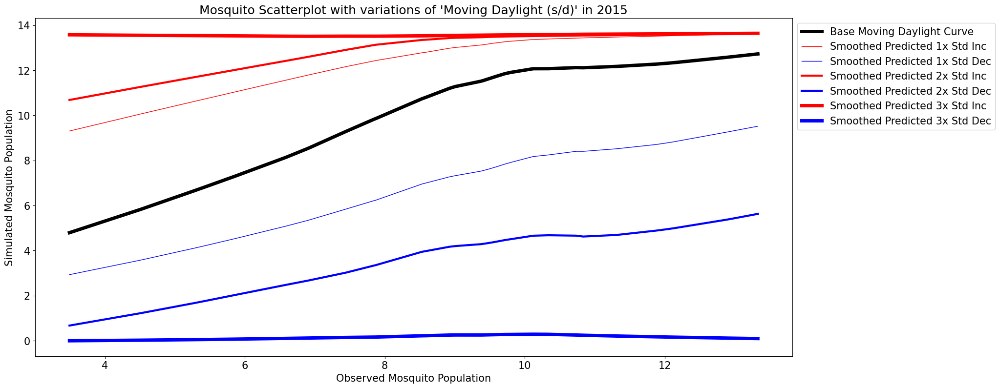

Evaluating model with variations of 'Moving Mean Temp':
7/7 [==============================] - 0s 6ms/step


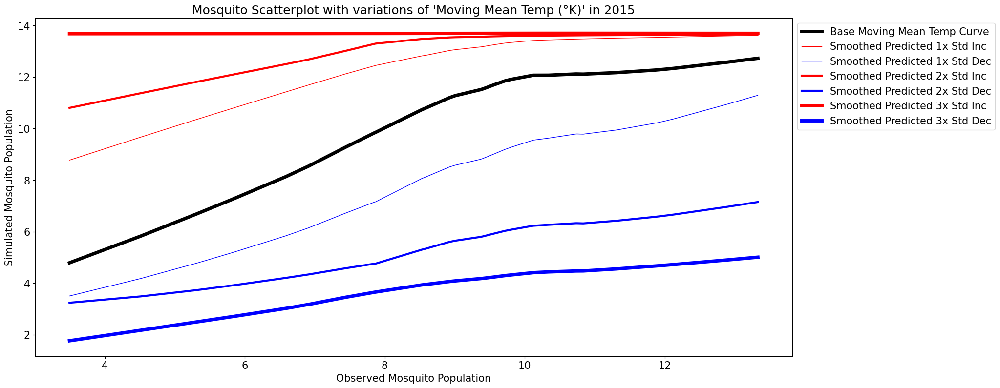

Evaluating model with variations of 'Moving Total Precip':
7/7 [==============================] - 0s 6ms/step


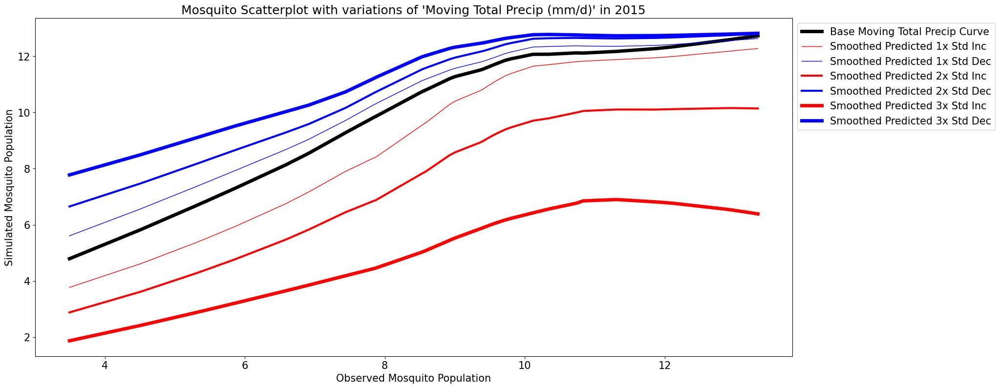

Evaluating model with variations of 'Moving LAI':
7/7 [==============================] - 0s 6ms/step


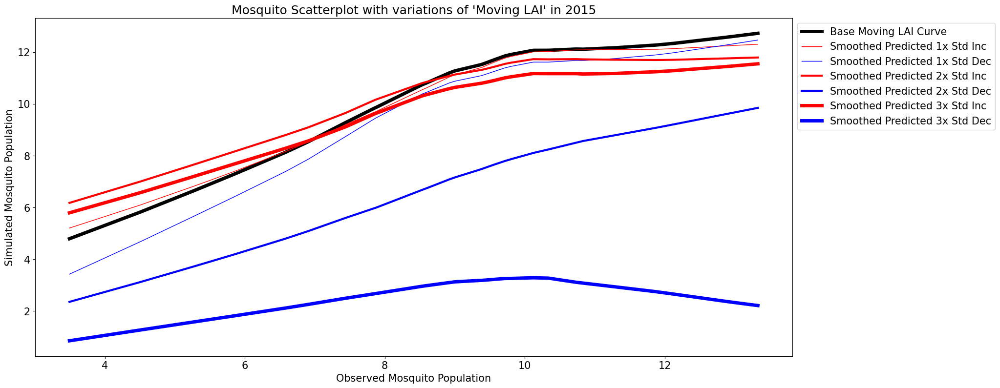

Evaluating model with variations of 'Moving Outflow (m^3/s)':
7/7 [==============================] - 0s 6ms/step


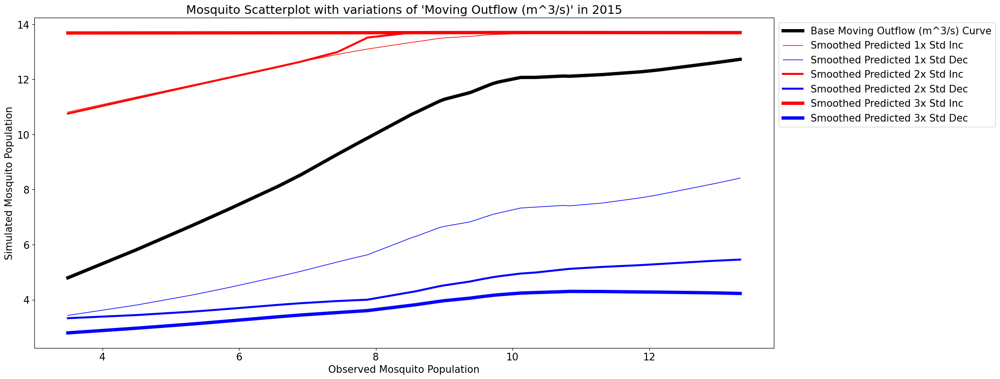

Evaluating model with variations of 'Moving SM':
7/7 [==============================] - 0s 6ms/step


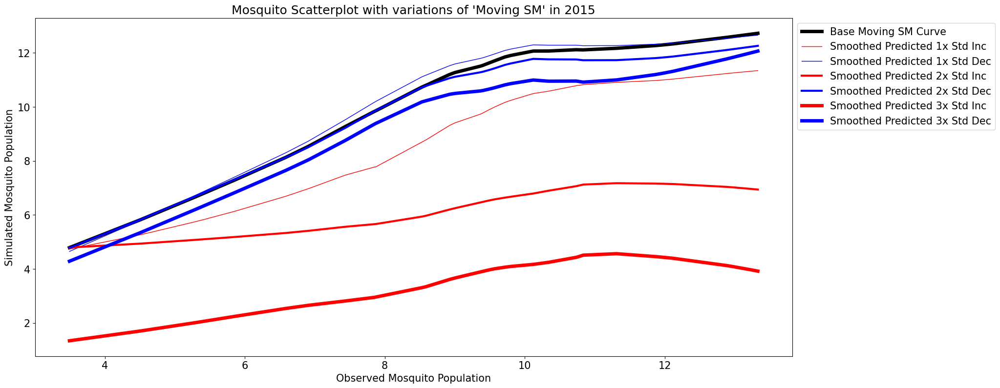

Evaluating model with variations of 'Timeskip':
7/7 [==============================] - 0s 6ms/step


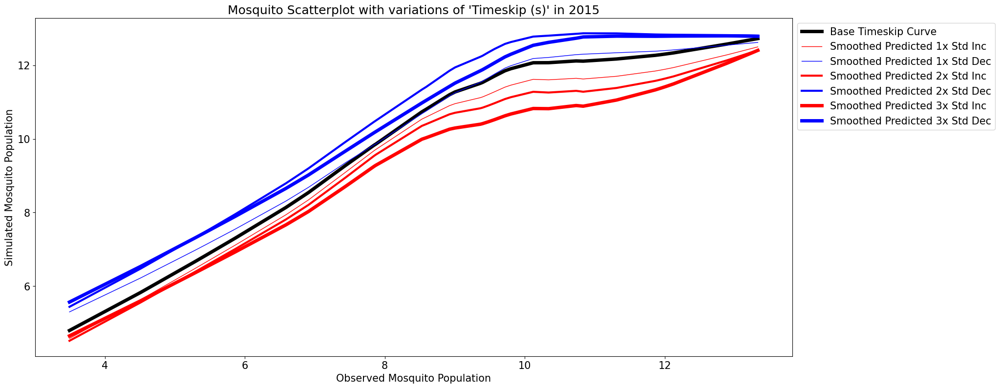

In [121]:
# Honing in a specific year for clarity of results. Plotting observed vs simulated mosquitoes to assess change more directly
SliceOfObs=ObservedDataset[ObservedDataset['Date'].dt.year==2015]
# Investigating for specific year
x_data = []
cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']
units_dict = {'Moving Daylight': 's/d', 'Moving Mean Temp': '°K', 'Moving Total Precip': 'mm/d', 'Moving LAI': '', 'Moving Outflow (m^3/s)': '',
    'Moving SM': '', 'Timeskip': 's'}

# Getting values specifically for 2015
for _, row in SliceOfObs.iterrows():
    date = row['Date']
    mosquito_count = row['# of Mosquitoes Rolling']
    timeskip_value = row['Timeskip']
    start_date = date - pd.Timedelta(days=60)
    mask = (ActualObs['Date'] > start_date) & (ActualObs['Date'] <= date)
    subset_ActualObs = ActualObs[mask].copy()
    if len(subset_ActualObs) == 60:
        subset_ActualObs['Timeskip'] = timeskip_value
        subset_values = subset_ActualObs[cols].values
        x_data.append(subset_values)
        
x_data = np.array(x_data)
original_test_data = x_data.copy()
metrics = {}
results = {}
for i, feature in enumerate(cols):
    # Similar to previous box
    print(f"Evaluating model with variations of '{feature}':")
    feature_data_dec_30,feature_data_inc_30,feature_data_dec_20,feature_data_inc_20,feature_data,feature_data_inc_10,feature_data_dec_10 = get_feature_data(original_test_data, i)
    (feature_data_dec_30, feature_data_inc_30, feature_data_dec_20, feature_data_inc_20, feature_data, feature_data_inc_10, feature_data_dec_10) = normalize_features(
        feature_data_dec_30, feature_data_inc_30, feature_data_dec_20, feature_data_inc_20, feature_data, feature_data_inc_10, feature_data_dec_10)
    
    ypred_avg = regressor.predict(feature_data)
    ypred_avg_inc_10 = regressor.predict(feature_data_inc_10)
    ypred_avg_dec_10 = regressor.predict(feature_data_dec_10)
    ypred_avg_inc_20 = regressor.predict(feature_data_inc_20)
    ypred_avg_dec_20 = regressor.predict(feature_data_dec_20)
    ypred_avg_inc_30 = regressor.predict(feature_data_inc_30)
    ypred_avg_dec_30 = regressor.predict(feature_data_dec_30)

    # Got the obs data specifically for 2015!
    New=pd.DataFrame()
    New=ObservedDataset[ObservedDataset['Date'].dt.year==2015]
    NewMosq=New[['# of Mosquitoes Rolling','Date']].reset_index(drop=True)

    # Observational data is set as the actual mosquito rolling data
    TestNo0 = pd.DataFrame()
    TestNo0['Actual Mosquito Data'] = New['# of Mosquitoes Rolling'] 
    TestNo0['Mosquito Predictions Average'] = ypred_avg.flatten()
    TestNo0['Mosquito Predictions .1 Inc'] = ypred_avg_inc_10.flatten()
    TestNo0['Mosquito Predictions .1 Dec'] = ypred_avg_dec_10.flatten()
    TestNo0['Mosquito Predictions .2 Inc'] = ypred_avg_inc_20.flatten()
    TestNo0['Mosquito Predictions .2 Dec'] = ypred_avg_dec_20.flatten()
    TestNo0['Mosquito Predictions .3 Inc'] = ypred_avg_inc_30.flatten()
    TestNo0['Mosquito Predictions .3 Dec'] = ypred_avg_dec_30.flatten()
    TestNo0['Observational Data'] = New['# of Mosquitoes Rolling'] 
    TestNo0 = TestNo0[TestNo0['Actual Mosquito Data'] != 0]
    
    results[feature] = {"Modeled Avg Density": TestNo0['Mosquito Predictions Average'].mean(),
        "Modeled .1 Inc Density": TestNo0['Mosquito Predictions .1 Inc'].mean(), "Modeled .1 Dec Density": TestNo0['Mosquito Predictions .1 Dec'].mean(),
        "Modeled .2 Inc Density": TestNo0['Mosquito Predictions .2 Inc'].mean(), "Modeled .2 Dec Density": TestNo0['Mosquito Predictions .2 Dec'].mean(),
        "Modeled .3 Inc Density": TestNo0['Mosquito Predictions .3 Inc'].mean(), "Modeled .3 Dec Density": TestNo0['Mosquito Predictions .3 Dec'].mean(),
        "Observed Density": TestNo0['Actual Mosquito Data'].mean()}

    # Modeling - Seeing actual vs simulated mosquito populations
    plt.close('all')
    smoothed_predicted = lowess(TestNo0['Mosquito Predictions Average'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label=f'Base {feature} Curve', color='black', linewidth=5)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .1 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 1x Std Inc', color='red', linewidth=1)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .1 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 1x Std Dec', color='blue', linewidth=1)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .2 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 2x Std Inc', color='red', linewidth=3)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .2 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 2x Std Dec', color='blue', linewidth=3)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .3 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 3x Std Inc', color='red', linewidth=5)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .3 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 3x Std Dec', color='blue', linewidth=5)

    unit_str = f" ({units_dict[feature]})" if units_dict[feature] != '' else ''
    plt.title(f"Mosquito Scatterplot with variations of '{feature}{unit_str}' in 2015")

    plt.ylabel('Simulated Mosquito Population')
    plt.xlabel('Observed Mosquito Population')
    plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    plt.show()

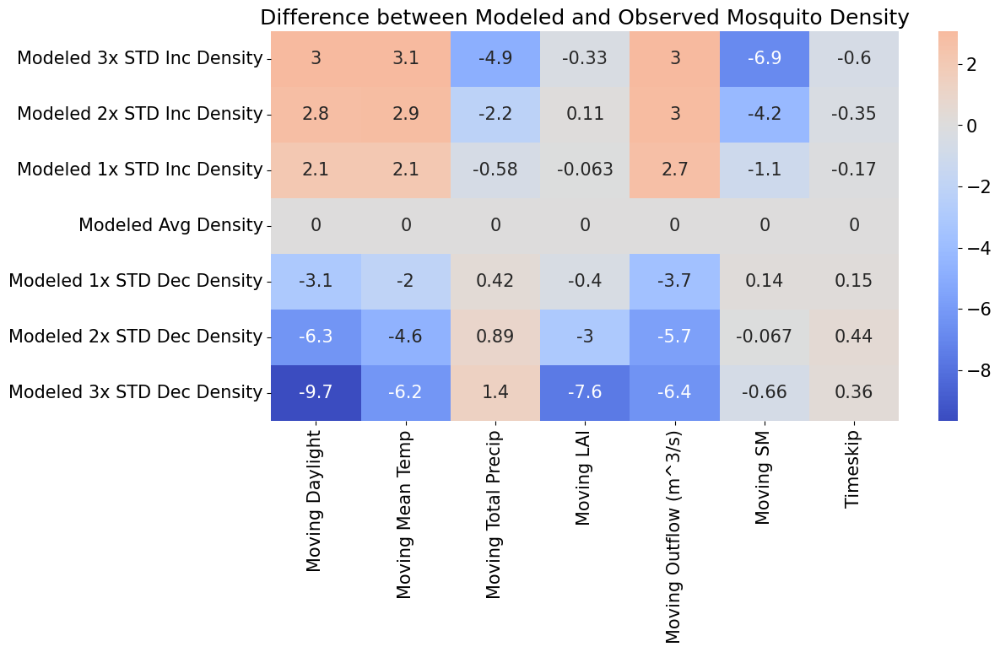

In [122]:
# Creating a comprehensive heatmap for average variable differences between average and changed feature mosquito simulation
df_differences = pd.DataFrame(index=cols)
intervals = [0.3, 0.2, 0.1] 
for feature in cols:
    diff_key = "Modeled Avg Density"
    df_differences.loc[feature, diff_key] = results[feature][diff_key] - results[feature]["Modeled Avg Density"] #The difference for avg
    # Diff for the inc/dec
    for interval in intervals:
        inc_key = f"Modeled .{int(interval*10)} Inc Density"
        dec_key = f"Modeled .{int(interval*10)} Dec Density"
        df_differences.loc[feature, inc_key] = results[feature][inc_key] - results[feature]["Modeled Avg Density"]
        df_differences.loc[feature, dec_key] = results[feature][dec_key] - results[feature]["Modeled Avg Density"]

# Getting it in a more reasonable order
df_differences_transposed = df_differences.T
custom_order = ["Modeled .3 Inc Density", "Modeled .2 Inc Density", "Modeled .1 Inc Density", "Modeled Avg Density",
                "Modeled .1 Dec Density", "Modeled .2 Dec Density", "Modeled .3 Dec Density"]
label_mapping = {
    "Modeled .3 Inc Density": "Modeled 3x STD Inc Density", "Modeled .2 Inc Density": "Modeled 2x STD Inc Density",
    "Modeled .1 Inc Density": "Modeled 1x STD Inc Density", "Modeled Avg Density": "Modeled Avg Density",
    "Modeled .1 Dec Density": "Modeled 1x STD Dec Density", "Modeled .2 Dec Density": "Modeled 2x STD Dec Density",
    "Modeled .3 Dec Density": "Modeled 3x STD Dec Density"}

# Transposed for a better figure - have those labels on the Y
df_differences_ordered = df_differences_transposed.loc[custom_order]
df_differences_ordered = df_differences_ordered.rename(index=label_mapping)
plt.figure(figsize=(12, 6))
sns.heatmap(df_differences_ordered, annot=True, cmap="coolwarm", center=0)
plt.title("Difference between Modeled and Observed Mosquito Density")
plt.show()

Evaluating model with variations of 'Moving Daylight':
7/7 [==============================] - 0s 6ms/step


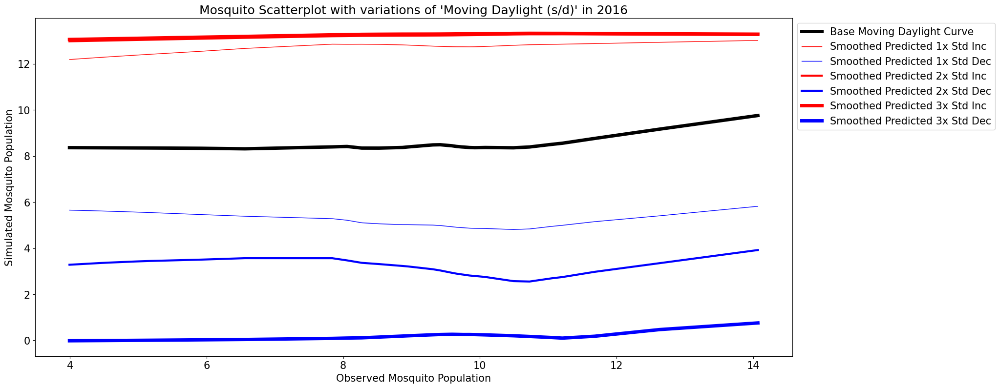

Evaluating model with variations of 'Moving Mean Temp':
7/7 [==============================] - 0s 6ms/step


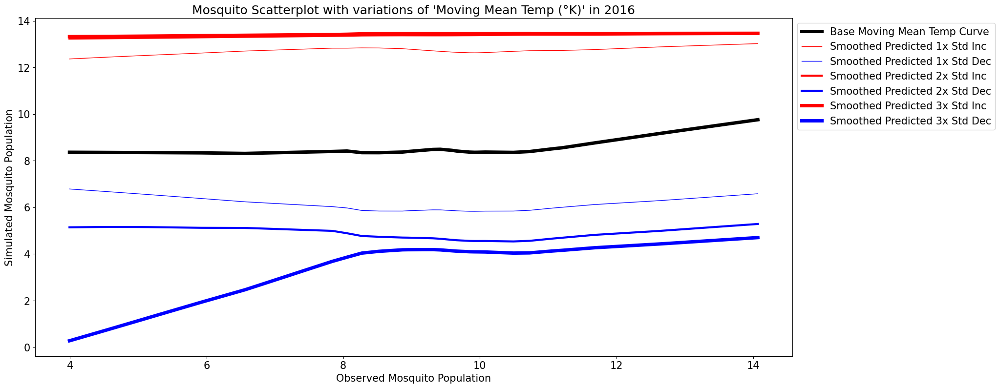

Evaluating model with variations of 'Moving Total Precip':
7/7 [==============================] - 0s 6ms/step


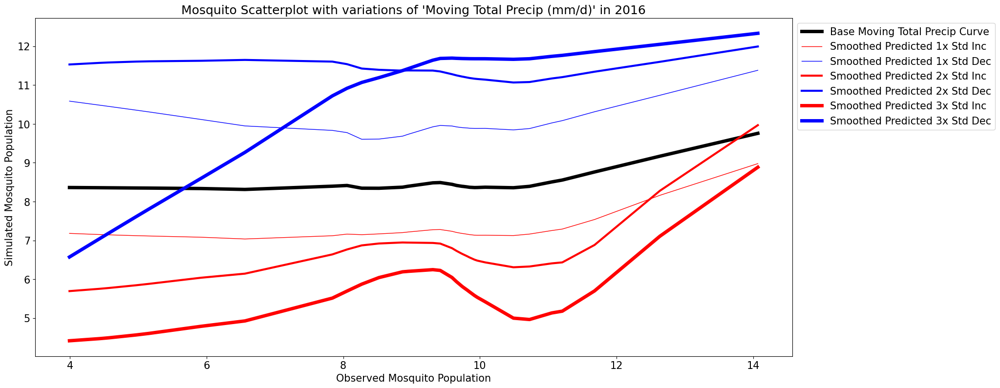

Evaluating model with variations of 'Moving LAI':
7/7 [==============================] - 0s 7ms/step


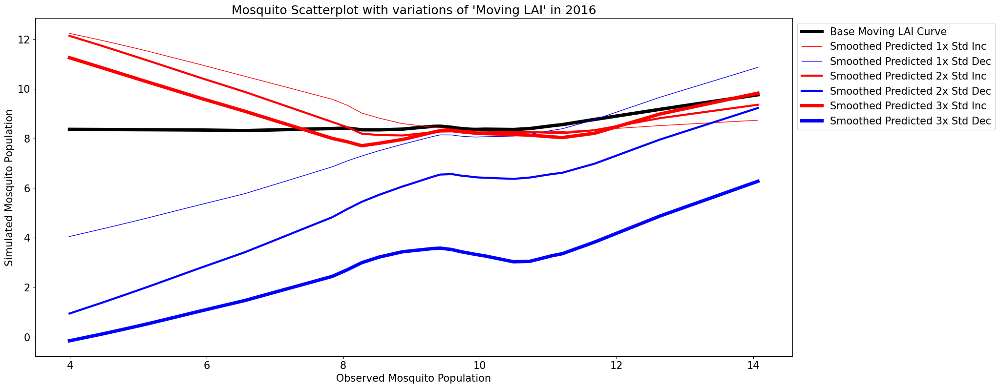

Evaluating model with variations of 'Moving Outflow (m^3/s)':
7/7 [==============================] - 0s 6ms/step


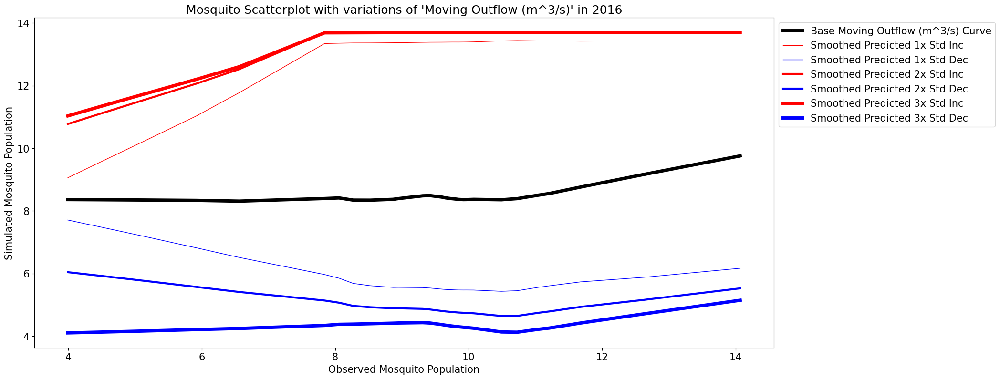

Evaluating model with variations of 'Moving SM':
7/7 [==============================] - 0s 7ms/step


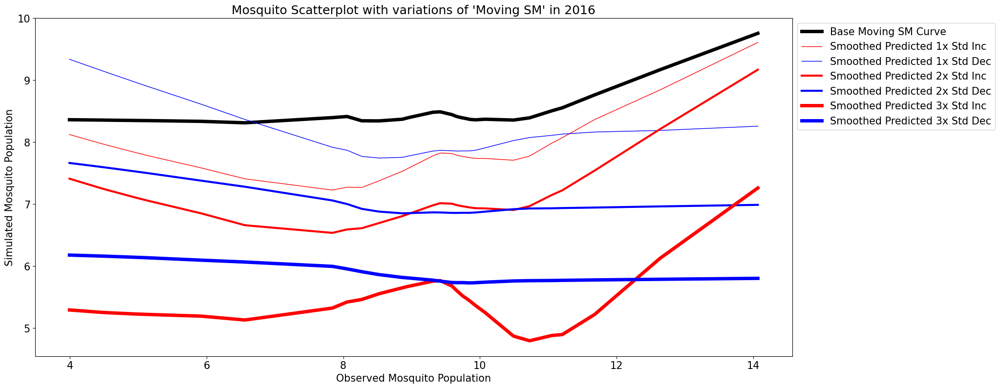

Evaluating model with variations of 'Timeskip':
7/7 [==============================] - 0s 6ms/step


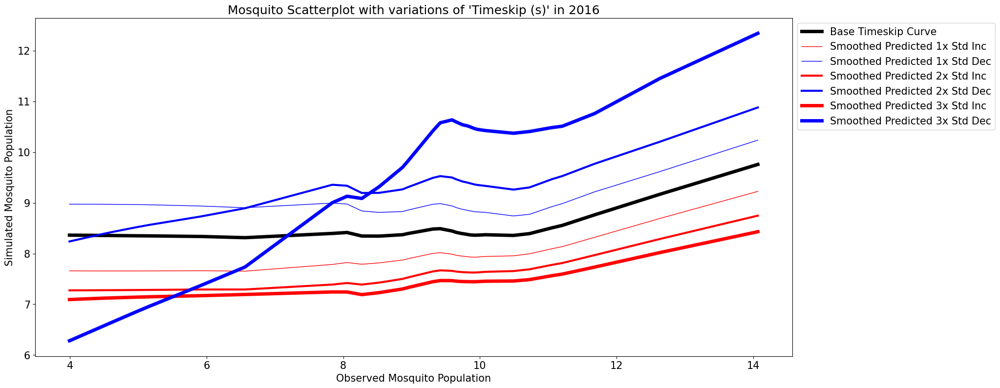

In [123]:
# Honing in a specific year for clarity of results. Plotting observed vs simulated mosquitoes to assess change more directly
SliceOfObs=ObservedDataset[ObservedDataset['Date'].dt.year==2016]
# Investigating for specific year
x_data = []
cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']
units_dict = {'Moving Daylight': 's/d', 'Moving Mean Temp': '°K', 'Moving Total Precip': 'mm/d', 'Moving LAI': '', 'Moving Outflow (m^3/s)': '',
    'Moving SM': '', 'Timeskip': 's'}

# Getting values specifically for 2016
for _, row in SliceOfObs.iterrows():
    date = row['Date']
    mosquito_count = row['# of Mosquitoes Rolling']
    timeskip_value = row['Timeskip']
    start_date = date - pd.Timedelta(days=60)
    mask = (ActualObs['Date'] > start_date) & (ActualObs['Date'] <= date)
    subset_ActualObs = ActualObs[mask].copy()
    if len(subset_ActualObs) == 60:
        subset_ActualObs['Timeskip'] = timeskip_value
        subset_values = subset_ActualObs[cols].values
        x_data.append(subset_values)
        
x_data = np.array(x_data)
original_test_data = x_data.copy()
metrics = {}
results = {}
for i, feature in enumerate(cols):
    # Similar to previous box
    print(f"Evaluating model with variations of '{feature}':")
    feature_data_dec_30,feature_data_inc_30,feature_data_dec_20,feature_data_inc_20,feature_data,feature_data_inc_10,feature_data_dec_10 = get_feature_data(original_test_data, i)
    (feature_data_dec_30, feature_data_inc_30, feature_data_dec_20, feature_data_inc_20, feature_data, feature_data_inc_10, feature_data_dec_10) = normalize_features(
        feature_data_dec_30, feature_data_inc_30, feature_data_dec_20, feature_data_inc_20, feature_data, feature_data_inc_10, feature_data_dec_10)
    
    ypred_avg = regressor.predict(feature_data)
    ypred_avg_inc_10 = regressor.predict(feature_data_inc_10)
    ypred_avg_dec_10 = regressor.predict(feature_data_dec_10)
    ypred_avg_inc_20 = regressor.predict(feature_data_inc_20)
    ypred_avg_dec_20 = regressor.predict(feature_data_dec_20)
    ypred_avg_inc_30 = regressor.predict(feature_data_inc_30)
    ypred_avg_dec_30 = regressor.predict(feature_data_dec_30)

    # Got the obs data specifically for 2016!
    New=pd.DataFrame()
    New=ObservedDataset[ObservedDataset['Date'].dt.year==2016]
    NewMosq=New[['# of Mosquitoes Rolling','Date']].reset_index(drop=True)

    # Observational data is set as the actual mosquito rolling data
    TestNo0 = pd.DataFrame()
    TestNo0['Actual Mosquito Data'] = New['# of Mosquitoes Rolling'] 
    TestNo0['Mosquito Predictions Average'] = ypred_avg.flatten()
    TestNo0['Mosquito Predictions .1 Inc'] = ypred_avg_inc_10.flatten()
    TestNo0['Mosquito Predictions .1 Dec'] = ypred_avg_dec_10.flatten()
    TestNo0['Mosquito Predictions .2 Inc'] = ypred_avg_inc_20.flatten()
    TestNo0['Mosquito Predictions .2 Dec'] = ypred_avg_dec_20.flatten()
    TestNo0['Mosquito Predictions .3 Inc'] = ypred_avg_inc_30.flatten()
    TestNo0['Mosquito Predictions .3 Dec'] = ypred_avg_dec_30.flatten()
    TestNo0['Observational Data'] = New['# of Mosquitoes Rolling'] 
    TestNo0 = TestNo0[TestNo0['Actual Mosquito Data'] != 0]
    
    results[feature] = {"Modeled Avg Density": TestNo0['Mosquito Predictions Average'].mean(),
        "Modeled .1 Inc Density": TestNo0['Mosquito Predictions .1 Inc'].mean(), "Modeled .1 Dec Density": TestNo0['Mosquito Predictions .1 Dec'].mean(),
        "Modeled .2 Inc Density": TestNo0['Mosquito Predictions .2 Inc'].mean(), "Modeled .2 Dec Density": TestNo0['Mosquito Predictions .2 Dec'].mean(),
        "Modeled .3 Inc Density": TestNo0['Mosquito Predictions .3 Inc'].mean(), "Modeled .3 Dec Density": TestNo0['Mosquito Predictions .3 Dec'].mean(),
        "Observed Density": TestNo0['Actual Mosquito Data'].mean()}

    # Modeling - Seeing actual vs simulated mosquito populations
    plt.close('all')
    smoothed_predicted = lowess(TestNo0['Mosquito Predictions Average'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label=f'Base {feature} Curve', color='black', linewidth=5)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .1 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 1x Std Inc', color='red', linewidth=1)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .1 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 1x Std Dec', color='blue', linewidth=1)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .2 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 2x Std Inc', color='red', linewidth=3)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .2 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 2x Std Dec', color='blue', linewidth=3)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .3 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 3x Std Inc', color='red', linewidth=5)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .3 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 3x Std Dec', color='blue', linewidth=5)

    unit_str = f" ({units_dict[feature]})" if units_dict[feature] != '' else ''
    plt.title(f"Mosquito Scatterplot with variations of '{feature}{unit_str}' in 2016")

    plt.ylabel('Simulated Mosquito Population')
    plt.xlabel('Observed Mosquito Population')
    plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    plt.show()

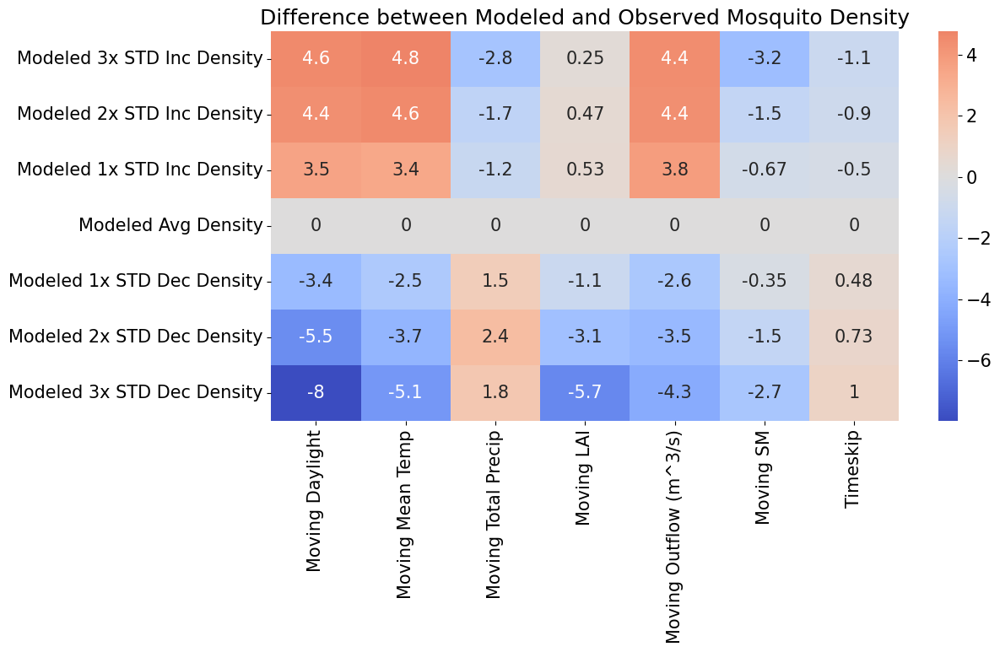

In [124]:
# Creating a comprehensive heatmap for average variable differences between average and changed feature mosquito simulation
df_differences = pd.DataFrame(index=cols)
intervals = [0.3, 0.2, 0.1] 
for feature in cols:
    diff_key = "Modeled Avg Density"
    df_differences.loc[feature, diff_key] = results[feature][diff_key] - results[feature]["Modeled Avg Density"] #The difference for avg
    # Diff for the inc/dec
    for interval in intervals:
        inc_key = f"Modeled .{int(interval*10)} Inc Density"
        dec_key = f"Modeled .{int(interval*10)} Dec Density"
        df_differences.loc[feature, inc_key] = results[feature][inc_key] - results[feature]["Modeled Avg Density"]
        df_differences.loc[feature, dec_key] = results[feature][dec_key] - results[feature]["Modeled Avg Density"]

# Getting it in a more reasonable order
df_differences_transposed = df_differences.T
custom_order = ["Modeled .3 Inc Density", "Modeled .2 Inc Density", "Modeled .1 Inc Density", "Modeled Avg Density",
                "Modeled .1 Dec Density", "Modeled .2 Dec Density", "Modeled .3 Dec Density"]
label_mapping = {
    "Modeled .3 Inc Density": "Modeled 3x STD Inc Density", "Modeled .2 Inc Density": "Modeled 2x STD Inc Density",
    "Modeled .1 Inc Density": "Modeled 1x STD Inc Density", "Modeled Avg Density": "Modeled Avg Density",
    "Modeled .1 Dec Density": "Modeled 1x STD Dec Density", "Modeled .2 Dec Density": "Modeled 2x STD Dec Density",
    "Modeled .3 Dec Density": "Modeled 3x STD Dec Density"}

# Transposed for a better figure - have those labels on the Y
df_differences_ordered = df_differences_transposed.loc[custom_order]
df_differences_ordered = df_differences_ordered.rename(index=label_mapping)
plt.figure(figsize=(12, 6))
sns.heatmap(df_differences_ordered, annot=True, cmap="coolwarm", center=0)
plt.title("Difference between Modeled and Observed Mosquito Density")
plt.show()

Evaluating model with variations of 'Moving Daylight':
5/5 [==============================] - 0s 6ms/step


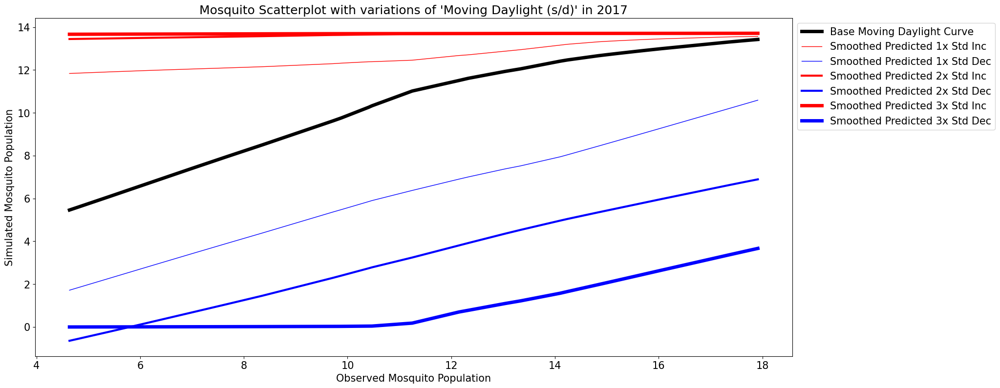

Evaluating model with variations of 'Moving Mean Temp':
5/5 [==============================] - 0s 6ms/step


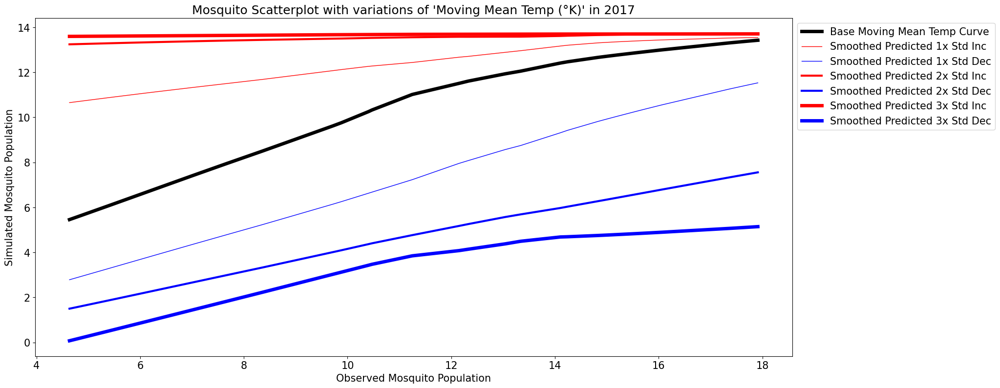

Evaluating model with variations of 'Moving Total Precip':
5/5 [==============================] - 0s 6ms/step


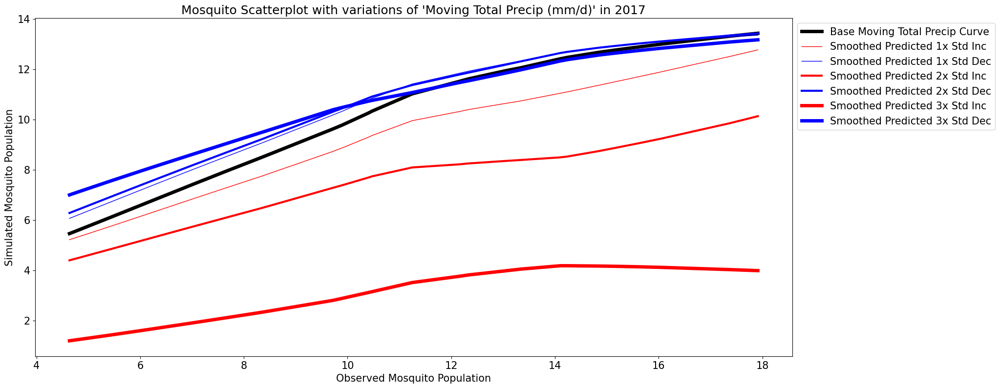

Evaluating model with variations of 'Moving LAI':
5/5 [==============================] - 0s 7ms/step


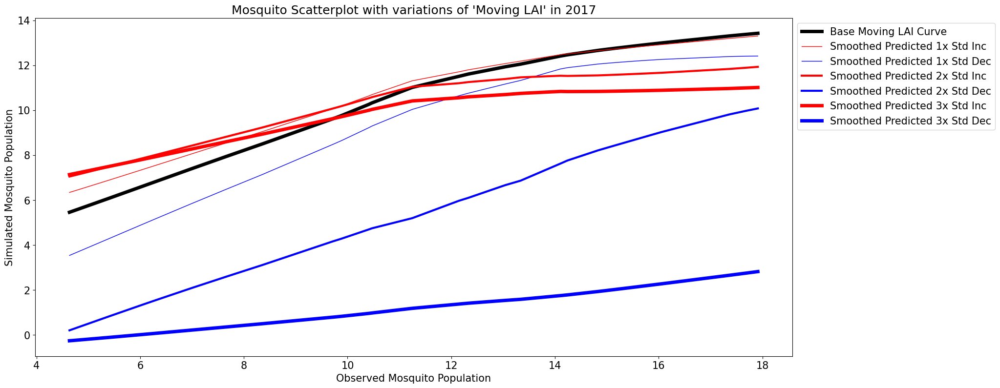

Evaluating model with variations of 'Moving Outflow (m^3/s)':
5/5 [==============================] - 0s 6ms/step


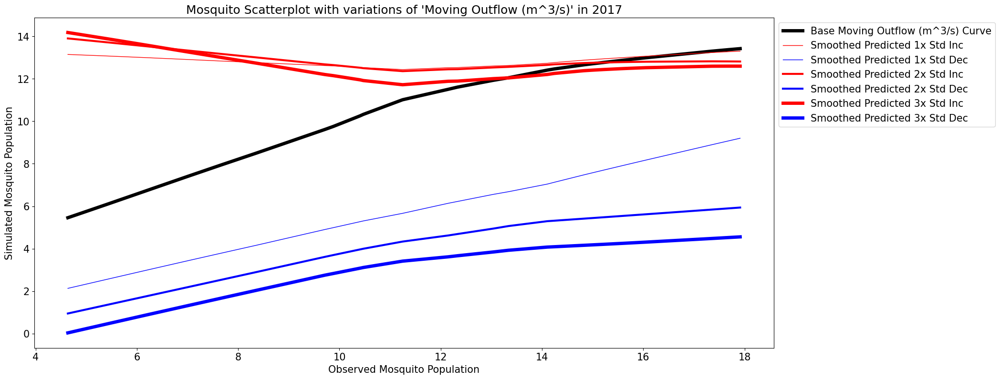

Evaluating model with variations of 'Moving SM':
5/5 [==============================] - 0s 7ms/step


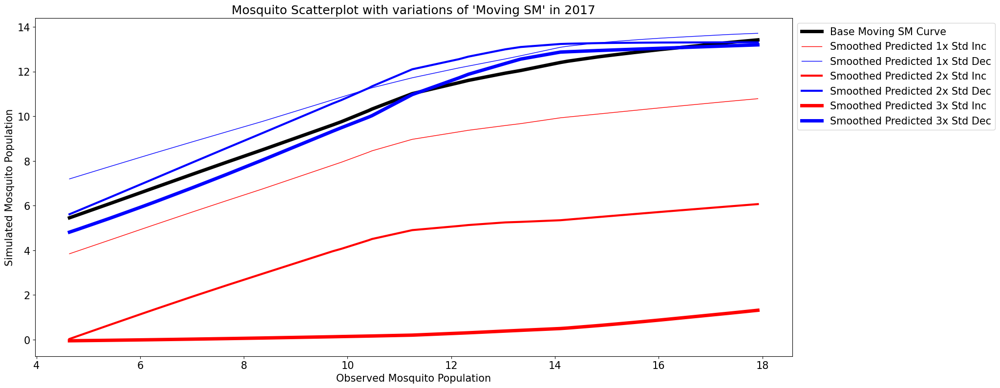

Evaluating model with variations of 'Timeskip':
5/5 [==============================] - 0s 6ms/step


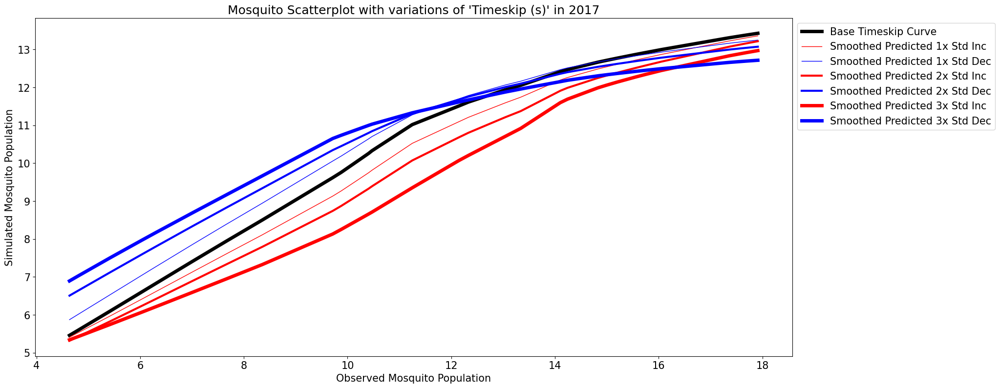

In [125]:
# Honing in a specific year for clarity of results. Plotting observed vs simulated mosquitoes to assess change more directly
SliceOfObs=ObservedDataset[ObservedDataset['Date'].dt.year==2017]
# Investigating for specific year
x_data = []
cols = ['Moving Daylight', 'Moving Mean Temp', 'Moving Total Precip','Moving LAI', 'Moving Outflow (m^3/s)', 'Moving SM','Timeskip']
units_dict = {'Moving Daylight': 's/d', 'Moving Mean Temp': '°K', 'Moving Total Precip': 'mm/d', 'Moving LAI': '', 'Moving Outflow (m^3/s)': '',
    'Moving SM': '', 'Timeskip': 's'}

# Getting values specifically for 2017
for _, row in SliceOfObs.iterrows():
    date = row['Date']
    mosquito_count = row['# of Mosquitoes Rolling']
    timeskip_value = row['Timeskip']
    start_date = date - pd.Timedelta(days=60)
    mask = (ActualObs['Date'] > start_date) & (ActualObs['Date'] <= date)
    subset_ActualObs = ActualObs[mask].copy()
    if len(subset_ActualObs) == 60:
        subset_ActualObs['Timeskip'] = timeskip_value
        subset_values = subset_ActualObs[cols].values
        x_data.append(subset_values)
        
x_data = np.array(x_data)
original_test_data = x_data.copy()
metrics = {}
results = {}
for i, feature in enumerate(cols):
    # Similar to previous box
    print(f"Evaluating model with variations of '{feature}':")
    feature_data_dec_30,feature_data_inc_30,feature_data_dec_20,feature_data_inc_20,feature_data,feature_data_inc_10,feature_data_dec_10 = get_feature_data(original_test_data, i)
    (feature_data_dec_30, feature_data_inc_30, feature_data_dec_20, feature_data_inc_20, feature_data, feature_data_inc_10, feature_data_dec_10) = normalize_features(
        feature_data_dec_30, feature_data_inc_30, feature_data_dec_20, feature_data_inc_20, feature_data, feature_data_inc_10, feature_data_dec_10)
    
    ypred_avg = regressor.predict(feature_data)
    ypred_avg_inc_10 = regressor.predict(feature_data_inc_10)
    ypred_avg_dec_10 = regressor.predict(feature_data_dec_10)
    ypred_avg_inc_20 = regressor.predict(feature_data_inc_20)
    ypred_avg_dec_20 = regressor.predict(feature_data_dec_20)
    ypred_avg_inc_30 = regressor.predict(feature_data_inc_30)
    ypred_avg_dec_30 = regressor.predict(feature_data_dec_30)

    # Got the obs data specifically for 2017!
    New=pd.DataFrame()
    New=ObservedDataset[ObservedDataset['Date'].dt.year==2017]
    NewMosq=New[['# of Mosquitoes Rolling','Date']].reset_index(drop=True)

    # Observational data is set as the actual mosquito rolling data
    TestNo0 = pd.DataFrame()
    TestNo0['Actual Mosquito Data'] = New['# of Mosquitoes Rolling'] 
    TestNo0['Mosquito Predictions Average'] = ypred_avg.flatten()
    TestNo0['Mosquito Predictions .1 Inc'] = ypred_avg_inc_10.flatten()
    TestNo0['Mosquito Predictions .1 Dec'] = ypred_avg_dec_10.flatten()
    TestNo0['Mosquito Predictions .2 Inc'] = ypred_avg_inc_20.flatten()
    TestNo0['Mosquito Predictions .2 Dec'] = ypred_avg_dec_20.flatten()
    TestNo0['Mosquito Predictions .3 Inc'] = ypred_avg_inc_30.flatten()
    TestNo0['Mosquito Predictions .3 Dec'] = ypred_avg_dec_30.flatten()
    TestNo0['Observational Data'] = New['# of Mosquitoes Rolling'] 
    TestNo0 = TestNo0[TestNo0['Actual Mosquito Data'] != 0]
    
    results[feature] = {"Modeled Avg Density": TestNo0['Mosquito Predictions Average'].mean(),
        "Modeled .1 Inc Density": TestNo0['Mosquito Predictions .1 Inc'].mean(), "Modeled .1 Dec Density": TestNo0['Mosquito Predictions .1 Dec'].mean(),
        "Modeled .2 Inc Density": TestNo0['Mosquito Predictions .2 Inc'].mean(), "Modeled .2 Dec Density": TestNo0['Mosquito Predictions .2 Dec'].mean(),
        "Modeled .3 Inc Density": TestNo0['Mosquito Predictions .3 Inc'].mean(), "Modeled .3 Dec Density": TestNo0['Mosquito Predictions .3 Dec'].mean(),
        "Observed Density": TestNo0['Actual Mosquito Data'].mean()}

    # Modeling - Seeing actual vs simulated mosquito populations
    plt.close('all')
    smoothed_predicted = lowess(TestNo0['Mosquito Predictions Average'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label=f'Base {feature} Curve', color='black', linewidth=5)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .1 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 1x Std Inc', color='red', linewidth=1)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .1 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 1x Std Dec', color='blue', linewidth=1)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .2 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 2x Std Inc', color='red', linewidth=3)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .2 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 2x Std Dec', color='blue', linewidth=3)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .3 Inc'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 3x Std Inc', color='red', linewidth=5)

    smoothed_predicted = lowess(TestNo0['Mosquito Predictions .3 Dec'], TestNo0['Observational Data'])
    plt.plot(smoothed_predicted[:, 0], smoothed_predicted[:, 1], label='Smoothed Predicted 3x Std Dec', color='blue', linewidth=5)

    unit_str = f" ({units_dict[feature]})" if units_dict[feature] != '' else ''
    plt.title(f"Mosquito Scatterplot with variations of '{feature}{unit_str}' in 2017")

    plt.ylabel('Simulated Mosquito Population')
    plt.xlabel('Observed Mosquito Population')
    plt.legend(loc='upper left',bbox_to_anchor=(1,1))
    plt.show()

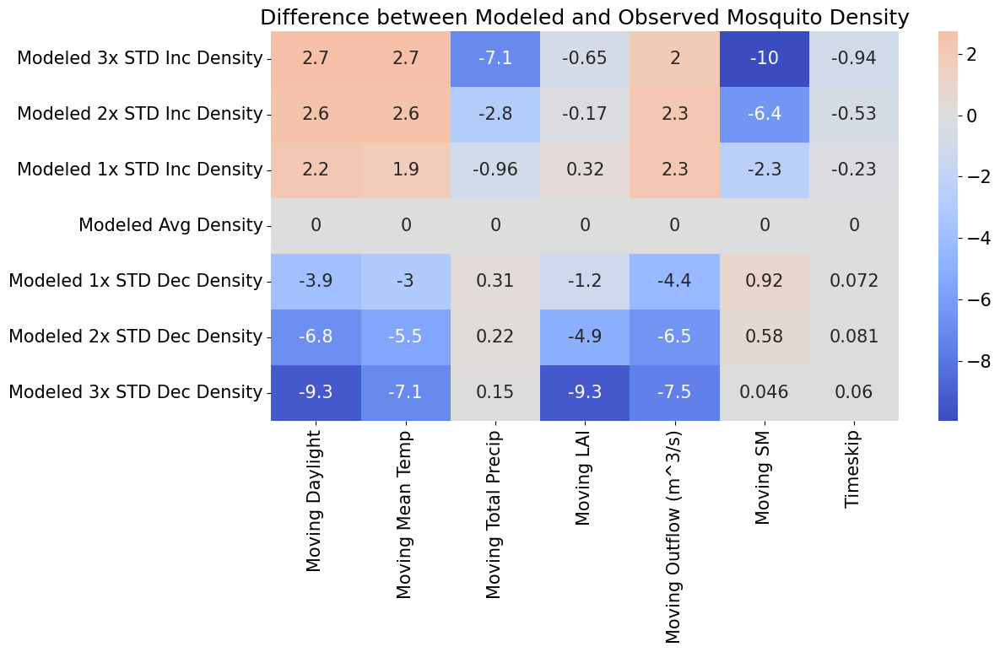

In [126]:
# Creating a comprehensive heatmap for average variable differences between average and changed feature mosquito simulation
df_differences = pd.DataFrame(index=cols)
intervals = [0.3, 0.2, 0.1] 
for feature in cols:
    diff_key = "Modeled Avg Density"
    df_differences.loc[feature, diff_key] = results[feature][diff_key] - results[feature]["Modeled Avg Density"] #The difference for avg
    # Diff for the inc/dec
    for interval in intervals:
        inc_key = f"Modeled .{int(interval*10)} Inc Density"
        dec_key = f"Modeled .{int(interval*10)} Dec Density"
        df_differences.loc[feature, inc_key] = results[feature][inc_key] - results[feature]["Modeled Avg Density"]
        df_differences.loc[feature, dec_key] = results[feature][dec_key] - results[feature]["Modeled Avg Density"]

# Getting it in a more reasonable order
df_differences_transposed = df_differences.T
custom_order = ["Modeled .3 Inc Density", "Modeled .2 Inc Density", "Modeled .1 Inc Density", "Modeled Avg Density",
                "Modeled .1 Dec Density", "Modeled .2 Dec Density", "Modeled .3 Dec Density"]
label_mapping = {
    "Modeled .3 Inc Density": "Modeled 3x STD Inc Density", "Modeled .2 Inc Density": "Modeled 2x STD Inc Density",
    "Modeled .1 Inc Density": "Modeled 1x STD Inc Density", "Modeled Avg Density": "Modeled Avg Density",
    "Modeled .1 Dec Density": "Modeled 1x STD Dec Density", "Modeled .2 Dec Density": "Modeled 2x STD Dec Density",
    "Modeled .3 Dec Density": "Modeled 3x STD Dec Density"}

# Transposed for a better figure - have those labels on the Y
df_differences_ordered = df_differences_transposed.loc[custom_order]
df_differences_ordered = df_differences_ordered.rename(index=label_mapping)
plt.figure(figsize=(12, 6))
sns.heatmap(df_differences_ordered, annot=True, cmap="coolwarm", center=0)
plt.title("Difference between Modeled and Observed Mosquito Density")
plt.show()